<a href="https://colab.research.google.com/github/springboardmentor192n-lab/AI_TraceFinder/blob/AI_TraceFinder-Athulya/AITRACEFINDER.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:

from pathlib import Path
import pandas as pd

# Change this path for each dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")

# --- List scanners ---
scanners = [d.name for d in dataset_root.iterdir() if d.is_dir()]
print(f"Total Number of Scanners: {len(scanners)}")
print("Scanner Names:", scanners)

# --- Count images per scanner ---
scanner_counts = {}
scanner_resolutions = {}

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():
        images = list(scanner_dir.rglob('*.png')) + \
                 list(scanner_dir.rglob('*.bmp')) + \
                 list(scanner_dir.rglob('*.jpg')) + \
                 list(scanner_dir.rglob('*.tif')) + \
                 list(scanner_dir.rglob('*.tiff'))
        scanner_counts[scanner_dir.name] = len(images)

        # Resolution separation per scanner
        res_counts = {"150":0, "300":0}
        for img in images:
            fname = img.name.lower()
            if "150" in fname:
                res_counts["150"] += 1
            elif "300" in fname:
                res_counts["300"] += 1
        scanner_resolutions[scanner_dir.name] = res_counts

# --- Print results ---
print("\n--- Images Per Scanner ---")
for scanner, count in scanner_counts.items():
    print(f"{scanner}: {count} images")

print("\n--- Resolution Counts Per Scanner ---")
for scanner, res in scanner_resolutions.items():
    print(f"{scanner}: 150 DPI = {res['150']}, 300 DPI = {res['300']}")

# --- Balance Check ---
print("\n--- Balance Check ---")
df = pd.DataFrame(scanner_resolutions).T
print(df)

Total Number of Scanners: 11
Scanner Names: ['Canon120-1', 'EpsonV39-1', 'Canon120-2', 'Canon220', 'HP', 'EpsonV370-2', 'EpsonV39-2', 'Canon9000-1', 'EpsonV550', 'EpsonV370-1', 'Canon9000-2']

--- Images Per Scanner ---
Canon120-1: 2 images
EpsonV39-1: 3 images
Canon120-2: 2 images
Canon220: 2 images
HP: 2 images
EpsonV370-2: 2 images
EpsonV39-2: 2 images
Canon9000-1: 2 images
EpsonV550: 2 images
EpsonV370-1: 2 images
Canon9000-2: 2 images

--- Resolution Counts Per Scanner ---
Canon120-1: 150 DPI = 1, 300 DPI = 1
EpsonV39-1: 150 DPI = 2, 300 DPI = 1
Canon120-2: 150 DPI = 1, 300 DPI = 1
Canon220: 150 DPI = 1, 300 DPI = 1
HP: 150 DPI = 1, 300 DPI = 1
EpsonV370-2: 150 DPI = 1, 300 DPI = 1
EpsonV39-2: 150 DPI = 1, 300 DPI = 1
Canon9000-1: 150 DPI = 1, 300 DPI = 1
EpsonV550: 150 DPI = 1, 300 DPI = 1
EpsonV370-1: 150 DPI = 1, 300 DPI = 1
Canon9000-2: 150 DPI = 1, 300 DPI = 1

--- Balance Check ---
             150  300
Canon120-1     1    1
EpsonV39-1     2    1
Canon120-2     1    1
Canon2

In [ ]:

from pathlib import Path
import pandas as pd

# Change this path for each dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Originals")

# --- List scanners ---
scanners = [d.name for d in dataset_root.iterdir() if d.is_dir()]
print(f"Total Number of Scanners: {len(scanners)}")
print("Scanner Names:", scanners)

# --- Count images per scanner ---
scanner_counts = {}
scanner_resolutions = {}

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():
        images = list(scanner_dir.rglob('*.png')) + \
                 list(scanner_dir.rglob('*.bmp')) + \
                 list(scanner_dir.rglob('*.jpg')) + \
                 list(scanner_dir.rglob('*.tif')) + \
                 list(scanner_dir.rglob('*.tiff'))
        scanner_counts[scanner_dir.name] = len(images)

        # Resolution separation per scanner
        res_counts = {"150":0, "300":0}
        for img in images:
            fname = img.name.lower()
            if "150" in fname:
                res_counts["150"] += 1
            elif "300" in fname:
                res_counts["300"] += 1
        scanner_resolutions[scanner_dir.name] = res_counts

# --- Print results ---
print("\n--- Images Per Scanner ---")
for scanner, count in scanner_counts.items():
    print(f"{scanner}: {count} images")

print("\n--- Resolution Counts Per Scanner ---")
for scanner, res in scanner_resolutions.items():
    print(f"{scanner}: 150 DPI = {res['150']}, 300 DPI = {res['300']}")

# --- Balance Check ---
print("\n--- Balance Check ---")
df = pd.DataFrame(scanner_resolutions).T
print(df)

Total Number of Scanners: 2
Scanner Names: ['official', 'wikipedia']

--- Images Per Scanner ---
official: 0 images
wikipedia: 0 images

--- Resolution Counts Per Scanner ---
official: 150 DPI = 0, 300 DPI = 0
wikipedia: 150 DPI = 0, 300 DPI = 0

--- Balance Check ---
           150  300
official     0    0
wikipedia    0    0


In [ ]:
from pathlib import Path
import pandas as pd

# Path for Official Document Scans dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Official")

# --- List scanners ---
scanners = [d.name for d in dataset_root.iterdir() if d.is_dir()]
print(f"Total Number of Scanners: {len(scanners)}")
print("Scanner Names:", scanners)

# --- Count images per scanner ---
scanner_counts = {}
scanner_resolutions = {}

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():  # Canon, Epson, HP
        total_images = 0
        res_counts = {"150":0, "300":0}

        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():  # 150 or 300
                tif_files = list(res_dir.glob("*.tif"))
                total_images += len(tif_files)
                if res_dir.name == "150":
                    res_counts["150"] += len(tif_files)
                elif res_dir.name == "300":
                    res_counts["300"] += len(tif_files)

        scanner_counts[scanner_dir.name] = total_images
        scanner_resolutions[scanner_dir.name] = res_counts

# --- Print results ---
print("\n--- Images Per Scanner ---")
for scanner, count in scanner_counts.items():
    print(f"{scanner}: {count} images")

print("\n--- Resolution Counts Per Scanner ---")
for scanner, res in scanner_resolutions.items():
    print(f"{scanner}: 150 DPI = {res['150']}, 300 DPI = {res['300']}")

# --- Balance Check ---
print("\n--- Balance Check ---")
df = pd.DataFrame(scanner_resolutions).T
print(df)

Total Number of Scanners: 11
Scanner Names: ['Canon120-1', 'Canon220', 'EpsonV370-2', 'EpsonV370-1', 'Canon9000-2', 'Canon120-2', 'HP', 'EpsonV39-2', 'EpsonV550', 'Canon9000-1', 'EpsonV39-1']

--- Images Per Scanner ---
Canon120-1: 200 images
Canon220: 200 images
EpsonV370-2: 200 images
EpsonV370-1: 200 images
Canon9000-2: 200 images
Canon120-2: 200 images
HP: 200 images
EpsonV39-2: 200 images
EpsonV550: 200 images
Canon9000-1: 200 images
EpsonV39-1: 200 images

--- Resolution Counts Per Scanner ---
Canon120-1: 150 DPI = 100, 300 DPI = 100
Canon220: 150 DPI = 100, 300 DPI = 100
EpsonV370-2: 150 DPI = 100, 300 DPI = 100
EpsonV370-1: 150 DPI = 100, 300 DPI = 100
Canon9000-2: 150 DPI = 100, 300 DPI = 100
Canon120-2: 150 DPI = 100, 300 DPI = 100
HP: 150 DPI = 100, 300 DPI = 100
EpsonV39-2: 150 DPI = 100, 300 DPI = 100
EpsonV550: 150 DPI = 100, 300 DPI = 100
Canon9000-1: 150 DPI = 100, 300 DPI = 100
EpsonV39-1: 150 DPI = 100, 300 DPI = 100

--- Balance Check ---
             150  300
Canon1

In [ ]:
from pathlib import Path
import pandas as pd

# Path for Official Document Scans dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")

# --- List scanners ---
scanners = [d.name for d in dataset_root.iterdir() if d.is_dir()]
print(f"Total Number of Scanners: {len(scanners)}")
print("Scanner Names:", scanners)

# --- Count images per scanner ---
scanner_counts = {}
scanner_resolutions = {}

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():  # Canon, Epson, HP
        total_images = 0
        res_counts = {"150":0, "300":0}

        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():  # 150 or 300
                tif_files = list(res_dir.glob("*.tif"))
                total_images += len(tif_files)
                if res_dir.name == "150":
                    res_counts["150"] += len(tif_files)
                elif res_dir.name == "300":
                    res_counts["300"] += len(tif_files)

        scanner_counts[scanner_dir.name] = total_images
        scanner_resolutions[scanner_dir.name] = res_counts

# --- Print results ---
print("\n--- Images Per Scanner ---")
for scanner, count in scanner_counts.items():
    print(f"{scanner}: {count} images")

print("\n--- Resolution Counts Per Scanner ---")
for scanner, res in scanner_resolutions.items():
    print(f"{scanner}: 150 DPI = {res['150']}, 300 DPI = {res['300']}")

# --- Balance Check ---
print("\n--- Balance Check ---")
df = pd.DataFrame(scanner_resolutions).T
print(df)

Total Number of Scanners: 11
Scanner Names: ['EpsonV39-2', 'EpsonV550', 'EpsonV370-1', 'EpsonV39-1', 'Canon120-1', 'Canon120-2', 'Canon220', 'Canon9000-1', 'Canon9000-2', 'EpsonV370-2', 'HP']

--- Images Per Scanner ---
EpsonV39-2: 216 images
EpsonV550: 216 images
EpsonV370-1: 216 images
EpsonV39-1: 216 images
Canon120-1: 216 images
Canon120-2: 216 images
Canon220: 216 images
Canon9000-1: 216 images
Canon9000-2: 207 images
EpsonV370-2: 217 images
HP: 216 images

--- Resolution Counts Per Scanner ---
EpsonV39-2: 150 DPI = 108, 300 DPI = 108
EpsonV550: 150 DPI = 108, 300 DPI = 108
EpsonV370-1: 150 DPI = 108, 300 DPI = 108
EpsonV39-1: 150 DPI = 108, 300 DPI = 108
Canon120-1: 150 DPI = 108, 300 DPI = 108
Canon120-2: 150 DPI = 108, 300 DPI = 108
Canon220: 150 DPI = 108, 300 DPI = 108
Canon9000-1: 150 DPI = 108, 300 DPI = 108
Canon9000-2: 150 DPI = 108, 300 DPI = 99
EpsonV370-2: 150 DPI = 109, 300 DPI = 108
HP: 150 DPI = 108, 300 DPI = 108

--- Balance Check ---
             150  300
EpsonV3

In [ ]:
from pathlib import Path
import pandas as pd

# Path for Tampered Images dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Tampered images")

summary = {}

# --- Tampered and Binary masks ---
for main_folder in ["Tampered", "Binary masks"]:
    folder_path = dataset_root / main_folder
    if folder_path.exists():
        summary[main_folder] = {}
        for subfolder in ["Splicing", "Retouching", "Copy-Move"]:
            sub_path = folder_path / subfolder
            if sub_path.exists():
                tif_files = list(sub_path.glob("*.tif"))
                summary[main_folder][subfolder] = len(tif_files)

# --- Originals ---
orig_path = dataset_root / "Original"
summary["Original"] = len(list(orig_path.glob("*.tif"))) if orig_path.exists() else 0

# --- Description ---
desc_path = dataset_root / "Description"
summary["Description"] = len(list(desc_path.glob("*.tif"))) if desc_path.exists() else 0

# --- Print results ---
print("\n--- Tampered Images Dataset Summary ---")
for main_folder, counts in summary.items():
    if isinstance(counts, dict):
        print(f"{main_folder}:")
        for subfolder, count in counts.items():
            print(f"   {subfolder}: {count} images")
    else:
        print(f"{main_folder}: {counts} images")

# --- Balance Check Table ---
rows = []
for main_folder, counts in summary.items():
    if isinstance(counts, dict):
        for subfolder, count in counts.items():
            rows.append({"Category": main_folder, "Type": subfolder, "Count": count})
    else:
        rows.append({"Category": main_folder, "Type": "-", "Count": counts})

df = pd.DataFrame(rows)
print("\n--- Balance Check ---")
print(df)


--- Tampered Images Dataset Summary ---
Tampered:
   Splicing: 34 images
   Retouching: 34 images
Binary masks:
   Splicing: 34 images
   Retouching: 34 images
Original: 34 images
Description: 0 images

--- Balance Check ---
       Category        Type  Count
0      Tampered    Splicing     34
1      Tampered  Retouching     34
2  Binary masks    Splicing     34
3  Binary masks  Retouching     34
4      Original           -     34
5   Description           -      0


In [ ]:

from pathlib import Path
from PIL import Image
import pandas as pd

# Change this path for each dataset folder
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")

image_info = []

for img_path in dataset_root.rglob("*.*"):
    if img_path.suffix.lower() in [".png",".jpg",".jpeg",".bmp",".tif",".tiff"]:
        try:
            with Image.open(img_path) as img:
                width, height = img.size
                dpi = img.info.get("dpi", None)  # (horizontal_dpi, vertical_dpi)
                mode = img.mode                 # RGB, RGBA, L (grayscale), etc.
                fmt = img.format                # TIFF, PNG, etc.

                image_info.append({
                    "Scanner": img_path.parent.name,
                    "File": img_path.name,
                    "Format": fmt,
                    "Dimensions": f"{width}x{height}",
                    "Channels": mode,
                    "DPI": dpi[0] if dpi else "Not Found",
                    "Status": "OK"
                })
        except Exception as e:
            image_info.append({
                "Scanner": img_path.parent.name,
                "File": img_path.name,
                "Format": img_path.suffix,
                "Dimensions": None,
                "Channels": None,
                "DPI": None,
                "Status": f"Corrupted/Unreadable ({e})"
            })

# Convert to DataFrame for clean output
df = pd.DataFrame(image_info)

print("\n--- Image Properties ---")
print(df.head(20))  # Preview first 20 rows

# Save full report to CSV for later analysis
df.to_csv("image_properties_report.csv", index=False)


--- Image Properties ---
        Scanner       File Format Dimensions Channels    DPI  \
0    Canon120-1    300.tif   TIFF  2480x3508      RGB  301.0   
1    Canon120-1    150.tif   TIFF  1240x1752      RGB  150.0   
2    EpsonV39-1    300.tif   TIFF  2480x3508      RGB  301.0   
3    EpsonV39-1    150.tif   TIFF  1240x1754      RGB  151.0   
4    EpsonV39-1  ._150.tif   .tif       None     None   None   
5    Canon120-2    300.tif   TIFF  2480x3508      RGB  301.0   
6    Canon120-2    150.tif   TIFF  2480x3508      RGB  301.0   
7      Canon220    300.tif   TIFF  2480x3508      RGB  301.0   
8      Canon220    150.tif   TIFF  1240x1752      RGB  150.0   
9            HP    300.tif   TIFF  2480x3503      RGB  300.0   
10           HP    150.tif   TIFF  1240x1743      RGB  150.0   
11  EpsonV370-2    300.tif   TIFF  2480x3508      RGB  301.0   
12  EpsonV370-2    150.tif   TIFF  1236x1754      RGB  151.0   
13   EpsonV39-2    300.tif   TIFF  2480x3508      RGB  301.0   
14   EpsonV39-

In [ ]:


!pip install pymupdf  # Install PyMuPDF for PDF inspection

from pathlib import Path
from PIL import Image
import pandas as pd
import fitz  # PyMuPDF

dataset_root = Path("/content/drive/MyDrive/dataset/Originals")

file_info = []

for file_path in dataset_root.rglob("*.*"):
    ext = file_path.suffix.lower()

    # --- Handle image files ---
    if ext in [".png",".jpg",".jpeg",".bmp",".tif",".tiff"]:
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                dpi = img.info.get("dpi", None)
                mode = img.mode
                fmt = img.format

                file_info.append({
                    "Scanner": file_path.parent.name,
                    "File": file_path.name,
                    "Type": "Image",
                    "Format": fmt,
                    "Dimensions": f"{width}x{height} pixels",
                    "Channels": mode,
                    "DPI": dpi[0] if dpi else "Not Found",
                    "Status": "OK"
                })
        except Exception as e:
            file_info.append({
                "Scanner": file_path.parent.name,
                "File": file_path.name,
                "Type": "Image",
                "Format": ext,
                "Dimensions": None,
                "Channels": None,
                "DPI": None,
                "Status": f"Corrupted/Unreadable ({e})"
            })

    # --- Handle PDF files ---
    elif ext == ".pdf":
        try:
            doc = fitz.open(file_path)
            for page_num in range(len(doc)):
                page = doc[page_num]
                rect = page.rect
                width, height = rect.width, rect.height
                file_info.append({
                    "Scanner": file_path.parent.name,
                    "File": f"{file_path.name} (Page {page_num+1})",
                    "Type": "PDF",
                    "Format": "PDF",
                    "Dimensions": f"{width}x{height} points",
                    "Channels": "N/A",
                    "DPI": "Depends on rendering",
                    "Status": "OK"
                })
            doc.close()
        except Exception as e:
            file_info.append({
                "Scanner": file_path.parent.name,
                "File": file_path.name,
                "Type": "PDF",
                "Format": "PDF",
                "Dimensions": None,
                "Channels": None,
                "DPI": None,
                "Status": f"Corrupted/Unreadable ({e})"
            })

# --- Convert to DataFrame for clean output ---
df = pd.DataFrame(file_info)

print("\n--- Original Documents: File Properties ---")
print(df.head(20))  # Preview first 20 rows

# Save full report to CSV
df.to_csv("original_documents_properties.csv", index=False)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.9/24.9 MB 58.4 MB/s eta 0:00:00

--- Original Documents: File Properties ---
     Scanner             File Type Format  \
0   official   9.pdf (Page 1)  PDF    PDF   
1   official   7.pdf (Page 1)  PDF    PDF   
2   official  11.pdf (Page 1)  PDF    PDF   
3   official  13.pdf (Page 1)  PDF    PDF   
4   official   5.pdf (Page 1)  PDF    PDF   
5   official   6.pdf (Page 1)  PDF    PDF   
6   official  16.pdf (Page 1)  PDF    PDF   
7   official   8.pdf (Page 1)  PDF    PDF   
8   official  15.pdf (Page 1)  PDF    PDF   
9   official  18.pdf (Page 1)  PDF    PDF   
10  official  19.pdf (Page 1)  PDF    PDF   
11  official  20.pdf (Page 1)  PDF    PDF   
12  official  21.pdf (Page 1)  PDF    PDF   
13  official  22.pdf (Page 1)  PDF    PDF   
14  official  23.pdf (Page 1)  PDF    PDF   
15  official  24.pdf (Page 1)  PDF    PDF   
16  official  25.pdf (Page 1)  PDF    PDF   
17  official  26.pdf (Page 1)  PDF    PDF   
18  official   1.pdf 

In [ ]:
from pathlib import Path
from PIL import Image
import pandas as pd
from tqdm import tqdm

dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")

file_info = []

for scanner_dir in tqdm(list(dataset_root.iterdir()), desc="Scanners"):
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():
                for file_path in tqdm(list(res_dir.glob("*.tif")), desc=f"{scanner_dir.name}-{res_dir.name}"):
                    try:
                        with Image.open(file_path) as img:
                            width, height = img.size
                            dpi = img.info.get("dpi", None)
                            mode = img.mode
                            fmt = img.format

                            file_info.append({
                                "Scanner": scanner_dir.name,
                                "Resolution": res_dir.name,
                                "File": file_path.name,
                                "Format": fmt,
                                "Dimensions": f"{width}x{height} pixels",
                                "Channels": mode,
                                "DPI": dpi[0] if dpi else "Not Found",
                                "Status": "OK"
                            })
                    except Exception as e:
                        file_info.append({
                            "Scanner": scanner_dir.name,
                            "Resolution": res_dir.name,
                            "File": file_path.name,
                            "Format": ".tif",
                            "Dimensions": None,
                            "Channels": None,
                            "DPI": None,
                            "Status": f"Corrupted/Unreadable ({e})"
                        })

df = pd.DataFrame(file_info)
print("\n--- Official Document Scans: File Properties ---")
print(df.head(20))  # Preview first 20 rows
df.to_csv("official_document_scans_properties.csv", index=False)

EpsonV39-2-300: 100%|██████████| 108/108 [00:39<00:00,  2.73it/s]

EpsonV550-300: 100%|██████████| 108/108 [00:35<00:00,  3.04it/s]

EpsonV370-1-300: 100%|██████████| 108/108 [00:27<00:00,  3.88it/s]

EpsonV39-1-300: 100%|██████████| 108/108 [00:47<00:00,  2.29it/s]

Canon120-1-150: 100%|██████████| 108/108 [00:16<00:00,  6.69it/s]

Canon120-2-150: 100%|██████████| 108/108 [00:12<00:00,  8.58it/s]

Canon220-300: 100%|██████████| 108/108 [00:35<00:00,  3.03it/s]

Canon9000-1-300: 100%|██████████| 108/108 [00:38<00:00,  2.82it/s]

Canon9000-2-300: 100%|██████████| 99/99 [01:59<00:00,  1.21s/it]

EpsonV370-2-300: 100%|██████████| 108/108 [00:40<00:00,  2.68it/s]

HP-300: 100%|██████████| 108/108 [00:53<00:00,  2.04it/s]

Scanners: 100%|██████████| 11/11 [11:17<00:00, 61.57s/it]


--- Official Document Scans: File Properties ---
       Scanner Resolution       File Format        Dimensions Channels    DPI  \
0   EpsonV39-2        300   s9_1.tif   TIFF  2480x3508 pixels      RGB  301.0   
1   EpsonV39-2        300   s9_2.tif   TIFF  2480x3508 pixels      RGB  301.0   
2   EpsonV39-2        300   s9_3.tif   TIFF  2480x3508 pixels      RGB  301.0   
3   EpsonV39-2        300   s9_4.tif   TIFF  2480x3508 pixels      RGB  301.0   
4   EpsonV39-2        300   s9_5.tif   TIFF  2480x3508 pixels      RGB  301.0   
5   EpsonV39-2        300   s9_6.tif   TIFF  2480x3508 pixels      RGB  301.0   
6   EpsonV39-2        300   s9_7.tif   TIFF  2480x3508 pixels      RGB  301.0   
7   EpsonV39-2        300   s9_8.tif   TIFF  2480x3508 pixels      RGB  301.0   
8   EpsonV39-2        300   s9_9.tif   TIFF  2480x3508 pixels      RGB  301.0   
9   EpsonV39-2        300  s9_10.tif   TIFF  2480x3508 pixels      RGB  301.0   
10  EpsonV39-2        300  s9_11.tif   TIFF  2480x3508 pixe

In [ ]:
from pathlib import Path
from PIL import Image
import pandas as pd

# Path for Tampered Images dataset
dataset_root = Path("/content/drive/MyDrive/dataset/Tampered images")

file_info = []

for file_path in dataset_root.rglob("*.*"):
    ext = file_path.suffix.lower()

    if ext in [".png",".jpg",".jpeg",".bmp",".tif",".tiff"]:
        try:
            with Image.open(file_path) as img:
                width, height = img.size
                dpi = img.info.get("dpi", None)
                mode = img.mode
                fmt = img.format

                file_info.append({
                    "Scanner": file_path.parent.name,
                    "File": file_path.name,
                    "Format": fmt,
                    "Dimensions": f"{width}x{height} pixels",
                    "Channels": mode,
                    "DPI": dpi[0] if dpi else "Not Found",
                    "Status": "OK"
                })
        except Exception as e:
            file_info.append({
                "Scanner": file_path.parent.name,
                "File": file_path.name,
                "Format": ext,
                "Dimensions": None,
                "Channels": None,
                "DPI": None,
                "Status": f"Corrupted/Unreadable ({e})"
            })

df = pd.DataFrame(file_info)
print("\n--- Tampered Images: File Properties ---")
print(df.head(20))  # Preview first 20 rows
df.to_csv("tampered_images_properties.csv", index=False)


--- Tampered Images: File Properties ---
     Scanner        File Format        Dimensions Channels    DPI Status
0   Original   s9_51.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
1   Original   s9_52.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
2   Original   s9_56.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
3   Original   s9_58.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
4   Original   s9_59.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
5   Original   s9_60.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
6   Original   s9_61.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
7   Original   s9_62.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
8   Original   s9_63.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
9   Original   s9_67.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
10  Original   s9_68.tif   TIFF  2480x3508 pixels      RGB  301.0     OK
11  Original   s11_4.tif   TIFF  2481x3487 pixels      RGB  300.0     OK
12  Origi

In [ ]:
from pathlib import Path
from PIL import Image
import pandas as pd
from tqdm import tqdm

dataset_root = Path("/content/drive/MyDrive/dataset/Official")

file_info = []

for scanner_dir in tqdm(list(dataset_root.iterdir()), desc="Scanners"):
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():
                for file_path in tqdm(list(res_dir.glob("*.tif")), desc=f"{scanner_dir.name}-{res_dir.name}"):
                    try:
                        with Image.open(file_path) as img:
                            width, height = img.size
                            dpi = img.info.get("dpi", None)
                            mode = img.mode
                            fmt = img.format

                            file_info.append({
                                "Scanner": scanner_dir.name,
                                "Resolution": res_dir.name,
                                "File": file_path.name,
                                "Format": fmt,
                                "Dimensions": f"{width}x{height} pixels",
                                "Channels": mode,
                                "DPI": dpi[0] if dpi else "Not Found",
                                "Status": "OK"
                            })
                    except Exception as e:
                        file_info.append({
                            "Scanner": scanner_dir.name,
                            "Resolution": res_dir.name,
                            "File": file_path.name,
                            "Format": ".tif",
                            "Dimensions": None,
                            "Channels": None,
                            "DPI": None,
                            "Status": f"Corrupted/Unreadable ({e})"
                        })

df = pd.DataFrame(file_info)
print("\n--- Official Document Scans: File Properties ---")
print(df.head(20))  # Preview first 20 rows
df.to_csv("official_document_scans_properties.csv", index=False)

Canon120-1-150: 100%|██████████| 100/100 [00:19<00:00,  5.09it/s]

Canon220-300: 100%|██████████| 100/100 [00:33<00:00,  3.00it/s]

EpsonV370-2-300: 100%|██████████| 100/100 [00:43<00:00,  2.31it/s]

EpsonV370-1-150: 100%|██████████| 100/100 [00:12<00:00,  8.09it/s]

Canon9000-2-150: 100%|██████████| 100/100 [00:11<00:00,  8.82it/s]

Canon120-2-150: 100%|██████████| 100/100 [00:10<00:00,  9.60it/s]

HP-300: 100%|██████████| 100/100 [00:32<00:00,  3.11it/s]

EpsonV39-2-150: 100%|██████████| 100/100 [00:08<00:00, 12.21it/s]

EpsonV550-150: 100%|██████████| 100/100 [00:13<00:00,  7.53it/s]

Canon9000-1-150: 100%|██████████| 100/100 [00:10<00:00,  9.79it/s]

EpsonV39-1-150: 100%|██████████| 100/100 [00:15<00:00,  6.43it/s]

Scanners: 100%|██████████| 11/11 [10:14<00:00, 55.83s/it]


--- Official Document Scans: File Properties ---
       Scanner Resolution       File Format        Dimensions Channels    DPI  \
0   Canon120-1        150   s1_1.tif   TIFF  1240x1752 pixels      RGB  150.0   
1   Canon120-1        150   s1_2.tif   TIFF  1240x1752 pixels      RGB  150.0   
2   Canon120-1        150   s1_3.tif   TIFF  1240x1752 pixels      RGB  150.0   
3   Canon120-1        150   s1_4.tif   TIFF  1240x1752 pixels      RGB  150.0   
4   Canon120-1        150   s1_5.tif   TIFF  1240x1752 pixels      RGB  150.0   
5   Canon120-1        150   s1_6.tif   TIFF  1240x1752 pixels      RGB  150.0   
6   Canon120-1        150   s1_7.tif   TIFF  1240x1752 pixels      RGB  150.0   
7   Canon120-1        150   s1_8.tif   TIFF  1240x1752 pixels      RGB  150.0   
8   Canon120-1        150   s1_9.tif   TIFF  1240x1752 pixels      RGB  150.0   
9   Canon120-1        150  s1_10.tif   TIFF  1240x1752 pixels      RGB  150.0   
10  Canon120-1        150  s1_11.tif   TIFF  1240x1752 pixe

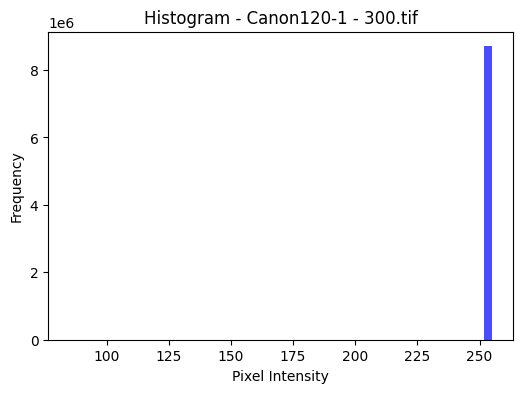

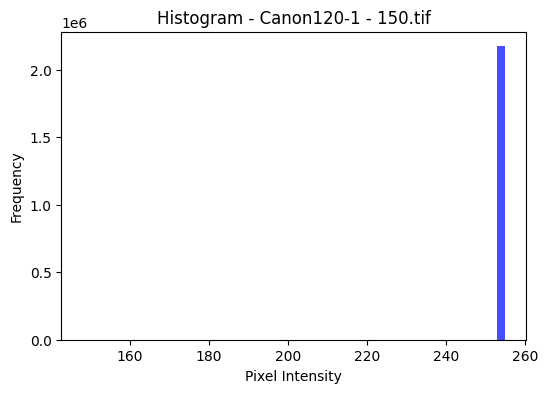

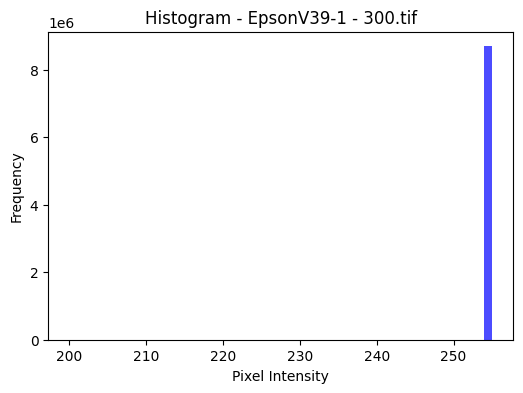

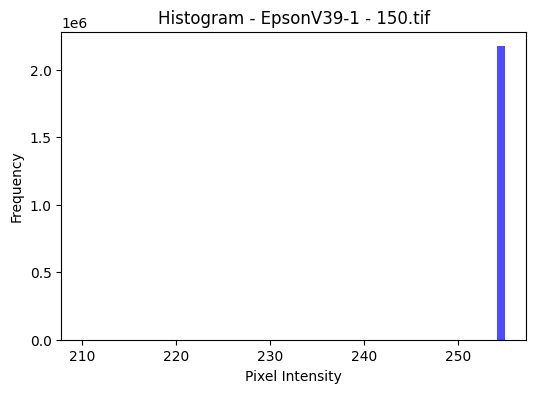

Corrupted/Unreadable: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif (cannot identify image file '/content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif')


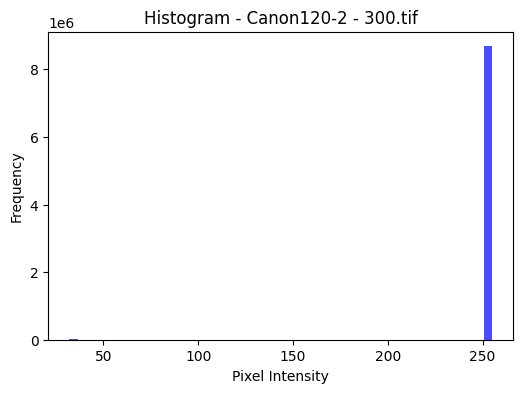

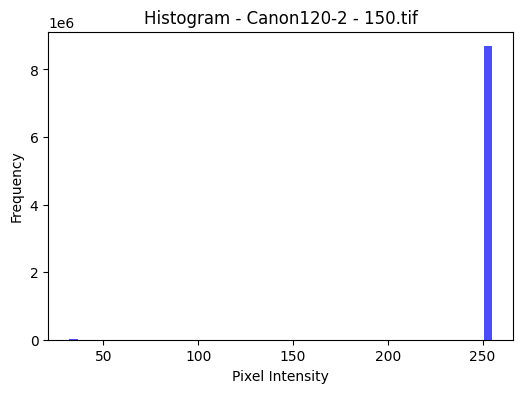

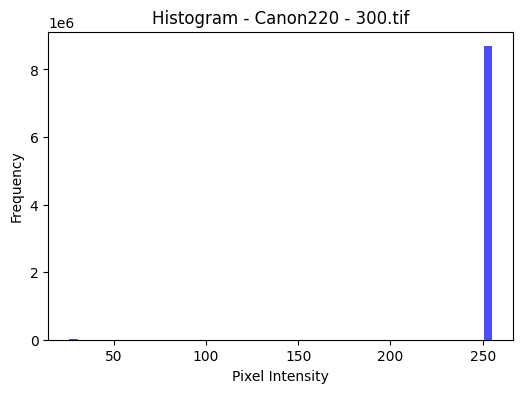

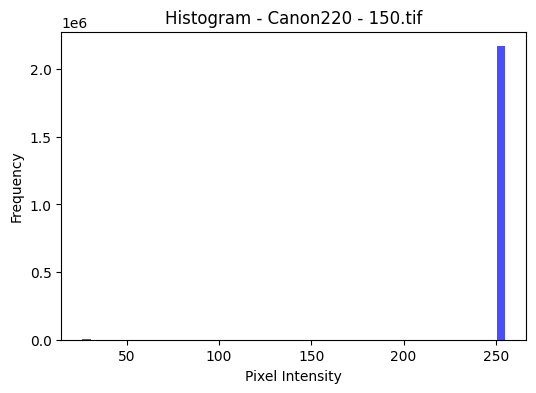

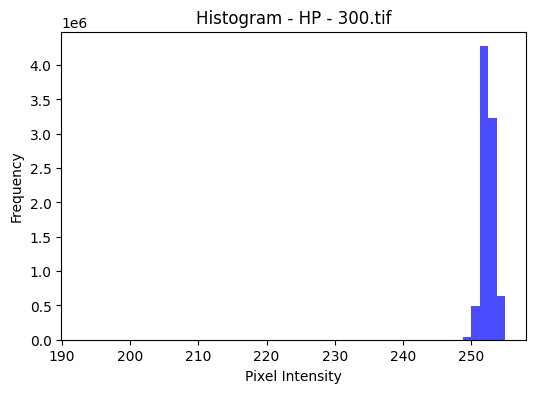

...

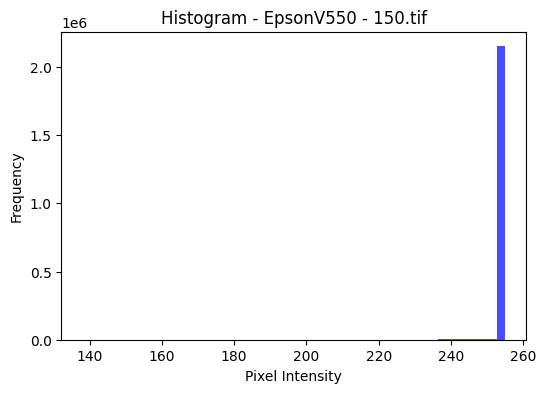

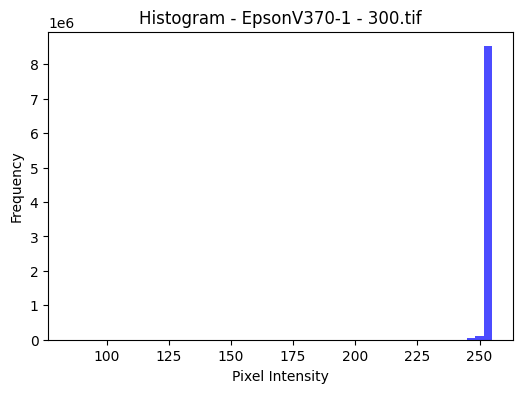

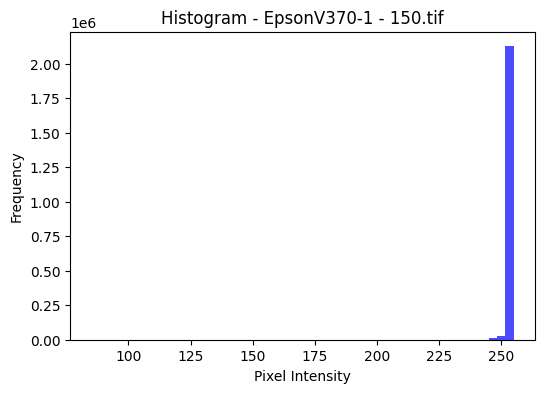

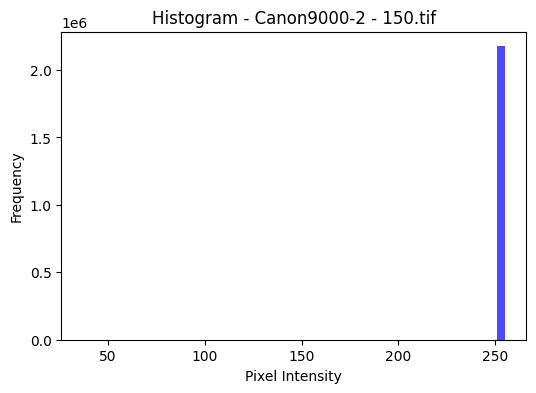

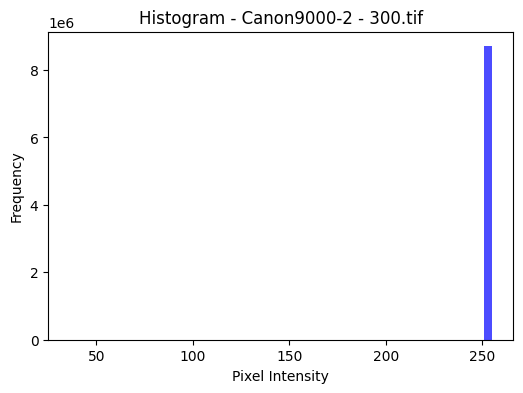


--- Pixel-Level Statistics Per Scanner ---
        Scanner  150 DPI Mean  150 DPI Variance  300 DPI Mean  \
0    Canon120-1    254.999373          0.013742    254.998964   
1    EpsonV39-1    254.998207          0.016840    254.995526   
2    Canon120-2    254.673517         63.548904    254.672265   
3      Canon220    254.606985         83.164358    254.643337   
4            HP    253.779625          0.310197    252.445602   
5   EpsonV370-2    254.736507         12.384587    254.770625   
6    EpsonV39-2    254.945264          0.202382    254.909021   
7   Canon9000-1    254.211950        159.810211    254.277202   
8     EpsonV550    254.883760          1.510445    254.881272   
9   EpsonV370-1    254.731050         13.185315    254.739987   
10  Canon9000-2    254.998337          0.256772    254.998498   

    300 DPI Variance  
0           0.026612  
1           0.035206  
2          63.849672  
3          75.669679  
4           0.582421  
5           8.007557  
6           0.

In [ ]:

from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Change this path for each dataset folder
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")

scanner_stats = []

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():
        res_stats = {"150": [], "300": []}

        for img_path in scanner_dir.rglob("*.*"):
            if img_path.suffix.lower() in [".png",".jpg",".jpeg",".bmp",".tif",".tiff"]:
                try:
                    with Image.open(img_path) as img:
                        # Convert to grayscale for intensity analysis
                        gray = img.convert("L")
                        arr = np.array(gray).flatten()

                        # Compute mean and variance
                        mean_val = np.mean(arr)
                        var_val = np.var(arr)

                        # Resolution separation
                        fname = img_path.name.lower()
                        dpi = img.info.get("dpi", (None, None))[0]
                        if "150" in fname or dpi == 150:
                            res_stats["150"].append((mean_val, var_val))
                        elif "300" in fname or dpi == 300:
                            res_stats["300"].append((mean_val, var_val))

                        # Plot histogram (optional: limit to first few images per scanner)
                        plt.figure(figsize=(6,4))
                        plt.hist(arr, bins=50, color="blue", alpha=0.7)
                        plt.title(f"Histogram - {scanner_dir.name} - {img_path.name}")
                        plt.xlabel("Pixel Intensity")
                        plt.ylabel("Frequency")
                        plt.show()

                except Exception as e:
                    print(f"Corrupted/Unreadable: {img_path} ({e})")

        # Aggregate statistics per scanner
        def summarize(res_list):
            if len(res_list) == 0:
                return {"Mean": None, "Variance": None}
            means = [m for m,v in res_list]
            vars_ = [v for m,v in res_list]
            return {"Mean": np.mean(means), "Variance": np.mean(vars_)}

        scanner_stats.append({
            "Scanner": scanner_dir.name,
            "150 DPI Mean": summarize(res_stats["150"])["Mean"],
            "150 DPI Variance": summarize(res_stats["150"])["Variance"],
            "300 DPI Mean": summarize(res_stats["300"])["Mean"],
            "300 DPI Variance": summarize(res_stats["300"])["Variance"]
        })

# --- Convert to DataFrame for clean summary ---
df = pd.DataFrame(scanner_stats)
print("\n--- Pixel-Level Statistics Per Scanner ---")
print(df)

In [ ]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random

dataset_root = Path("/content/drive/MyDrive/dataset/Originals")
results = []

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                sample_files = random.sample(tif_files, min(5, len(tif_files)))
                means, variances = [], []

                for idx, file_path in enumerate(sample_files):
                    with Image.open(file_path) as img:
                        arr = np.array(img.convert("L")).flatten()
                        means.append(np.mean(arr))
                        variances.append(np.var(arr))
                        if idx < 2:
                            plt.hist(arr, bins=50, color="blue", alpha=0.7)
                            plt.title(f"Originals - {scanner_dir.name} - {res_dir.name}")
                            plt.show()

                results.append({
                    "Scanner": scanner_dir.name,
                    "Resolution": res_dir.name,
                    "Mean": np.mean(means),
                    "Variance": np.mean(variances),
                    "Images Analyzed": len(sample_files)
                })

df = pd.DataFrame(results)
print("\n--- Originals Pixel Statistics ---")
print(df)


--- Originals Pixel Statistics ---
Empty DataFrame
Columns: []
Index: []


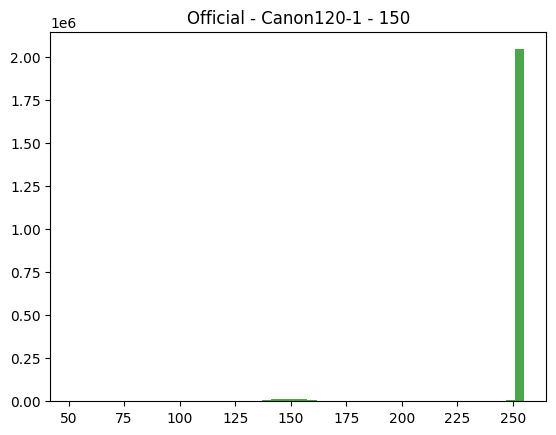

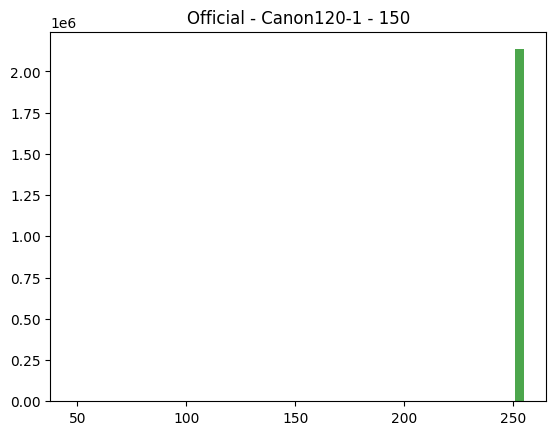

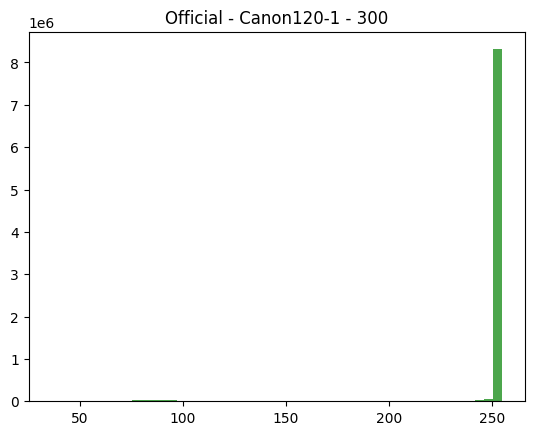

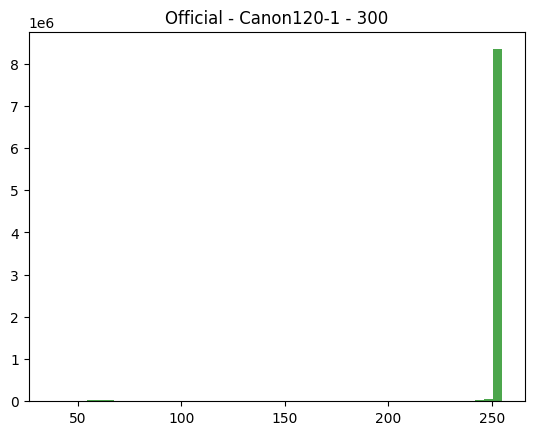

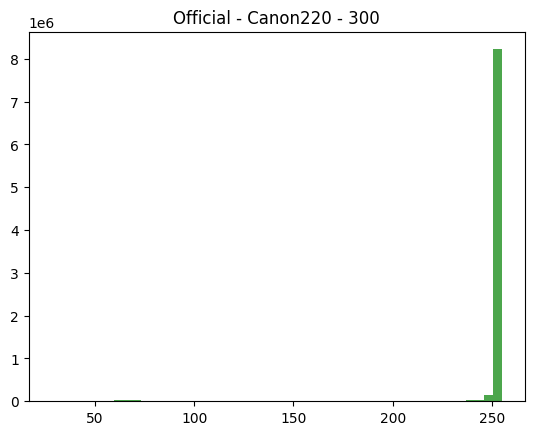

...

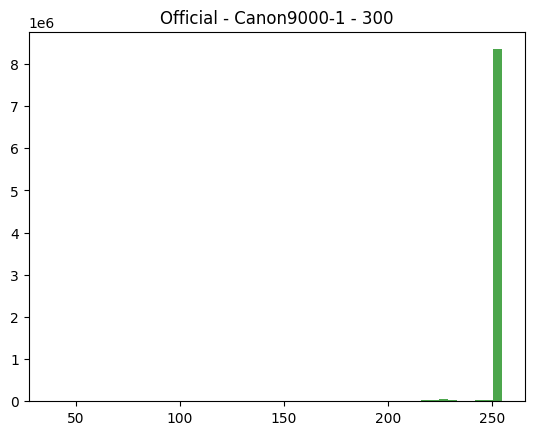

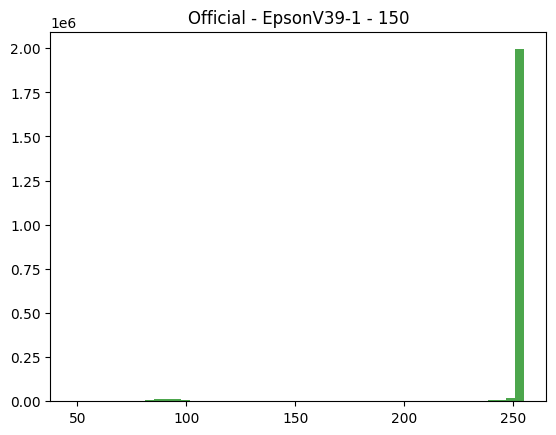

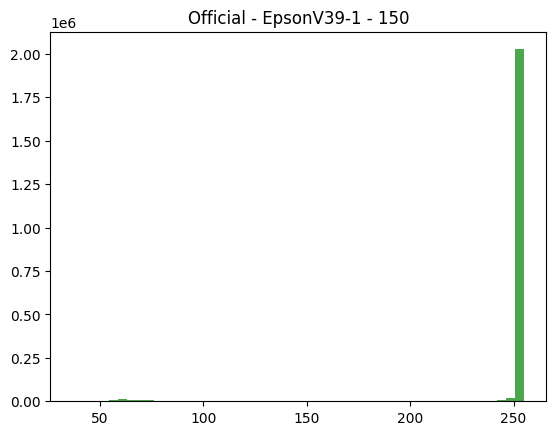

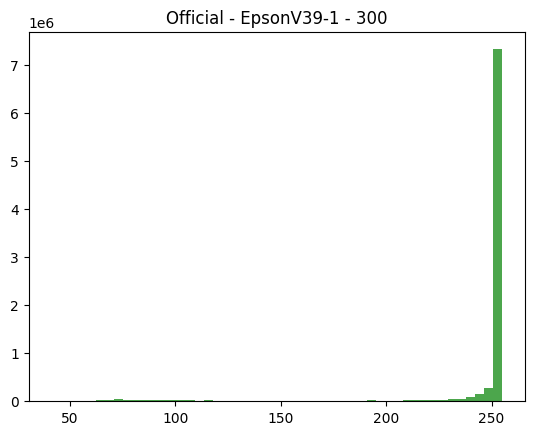

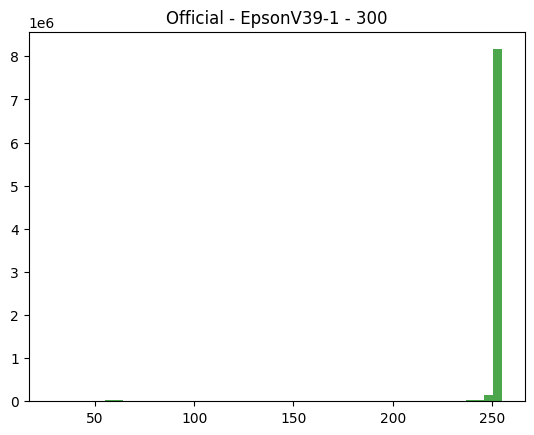


--- Official Pixel Statistics ---
        Scanner Resolution        Mean     Variance  Images Analyzed
0    Canon120-1        150  251.651549   406.542591                5
1    Canon120-1        300  249.710587   787.607324                5
2      Canon220        300  250.633456   612.437722                5
3      Canon220        150  249.140959   695.844411                5
4   EpsonV370-2        300  249.609435   446.676797                5
5   EpsonV370-2        150  245.859547   850.668708                5
6   EpsonV370-1        150  246.538602   919.388472                5
7   EpsonV370-1        300  247.181244   775.287012                5
8   Canon9000-2        150  249.490560   696.469502                5
9   Canon9000-2        300  246.003217   839.461121                5
10   Canon120-2        150  248.805290   821.863261                5
11   Canon120-2        300  249.056143   824.515171                5
12           HP        300  236.483624   632.372799                5

In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Official")
results = []

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                sample_files = random.sample(tif_files, min(5, len(tif_files)))
                means, variances = [], []

                for idx, file_path in enumerate(sample_files):
                    with Image.open(file_path) as img:
                        arr = np.array(img.convert("L")).flatten()
                        means.append(np.mean(arr))
                        variances.append(np.var(arr))
                        if idx < 2:
                            plt.hist(arr, bins=50, color="green", alpha=0.7)
                            plt.title(f"Official - {scanner_dir.name} - {res_dir.name}")
                            plt.show()

                results.append({
                    "Scanner": scanner_dir.name,
                    "Resolution": res_dir.name,
                    "Mean": np.mean(means),
                    "Variance": np.mean(variances),
                    "Images Analyzed": len(sample_files)
                })

df = pd.DataFrame(results)
print("\n--- Official Pixel Statistics ---")
print(df)

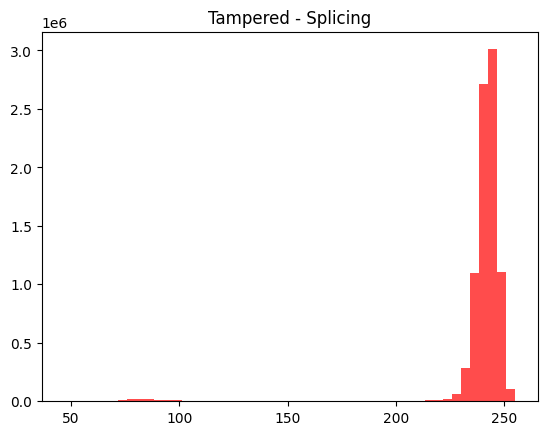

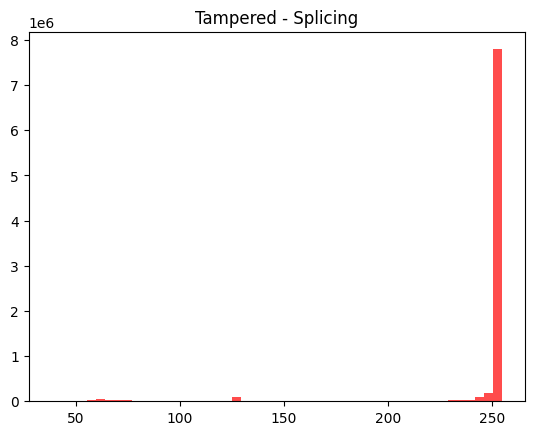

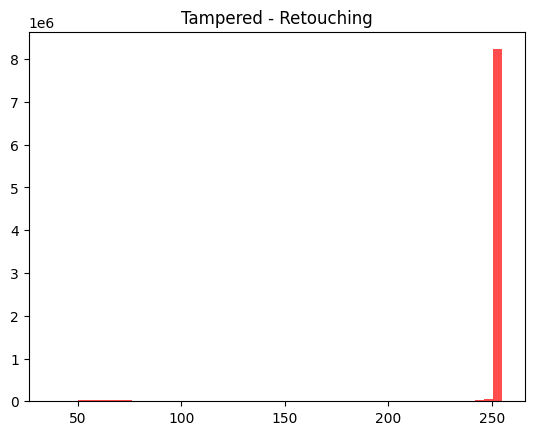

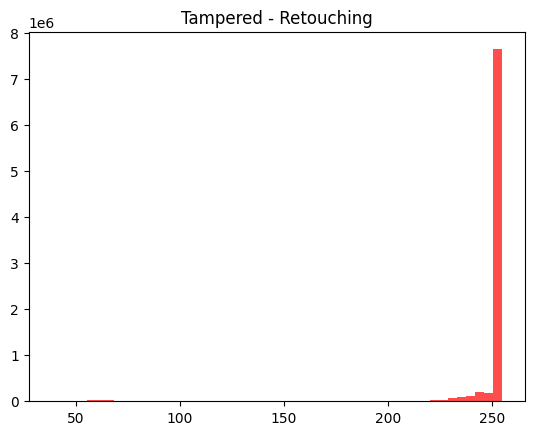

/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


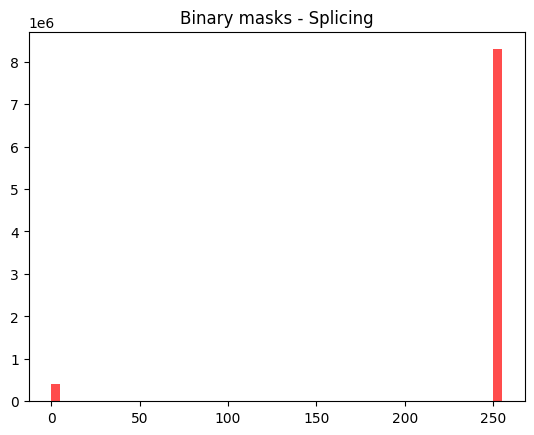

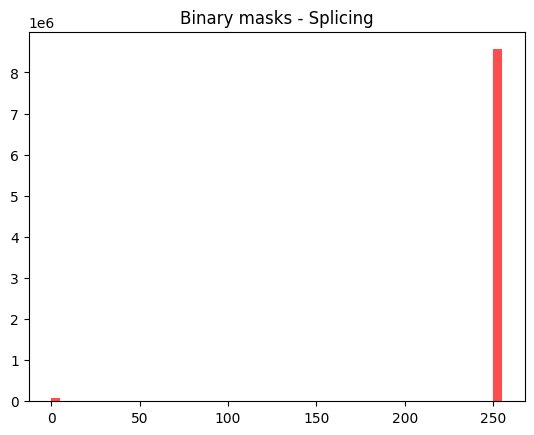

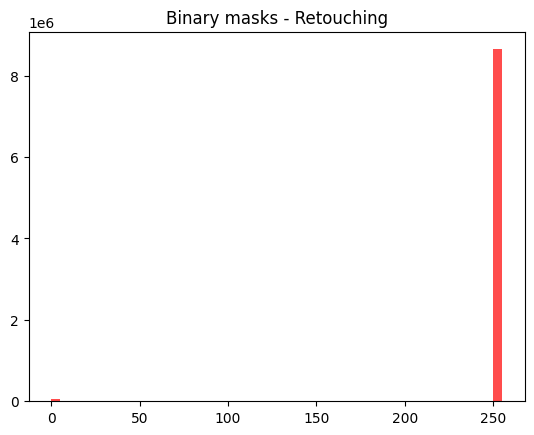

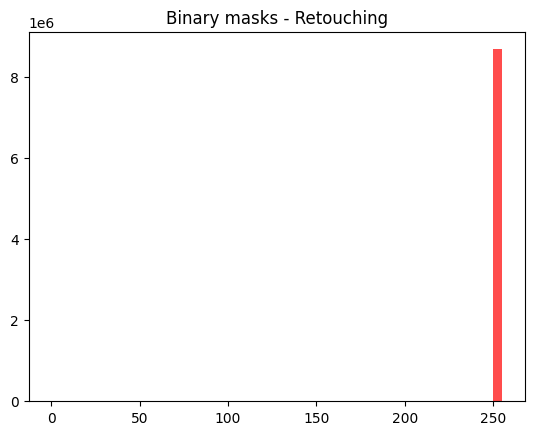


--- Tampered Pixel Statistics ---
       Category        Type        Mean     Variance  Images Analyzed
0      Tampered    Splicing  243.656514   826.177630                5
1      Tampered  Retouching  247.512429   665.227805                5
2      Tampered   Copy-Move         NaN          NaN                0
3  Binary masks    Splicing  250.727133  1054.906714                5
4  Binary masks  Retouching  254.131710   217.780779                5
5  Binary masks   Copy-Move         NaN          NaN                0


In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Tampered images")
results = []

for main_folder in ["Tampered", "Binary masks"]:
    folder_path = dataset_root / main_folder
    if folder_path.exists():
        for subfolder in ["Splicing", "Retouching", "Copy-Move"]:
            sub_path = folder_path / subfolder
            tif_files = list(sub_path.glob("*.tif"))
            sample_files = random.sample(tif_files, min(5, len(tif_files)))
            means, variances = [], []

            for idx, file_path in enumerate(sample_files):
                with Image.open(file_path) as img:
                    arr = np.array(img.convert("L")).flatten()
                    means.append(np.mean(arr))
                    variances.append(np.var(arr))
                    if idx < 2:
                        plt.hist(arr, bins=50, color="red", alpha=0.7)
                        plt.title(f"{main_folder} - {subfolder}")
                        plt.show()

            results.append({
                "Category": main_folder,
                "Type": subfolder,
                "Mean": np.mean(means),
                "Variance": np.mean(variances),
                "Images Analyzed": len(sample_files)
            })

df = pd.DataFrame(results)
print("\n--- Tampered Pixel Statistics ---")
print(df)

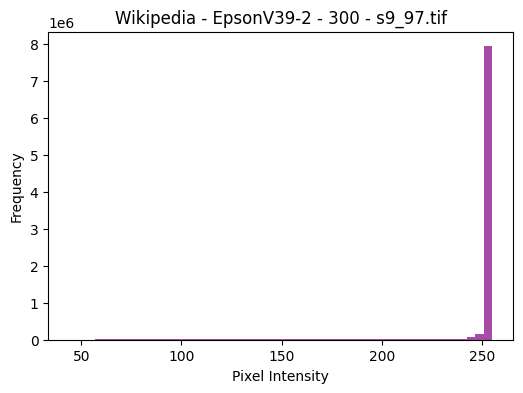

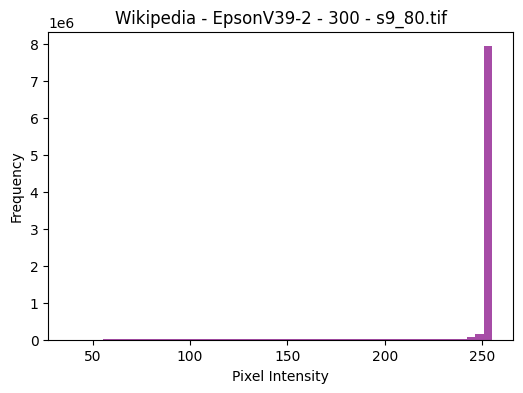

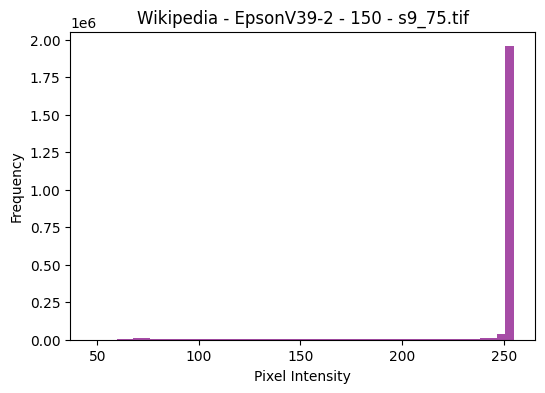

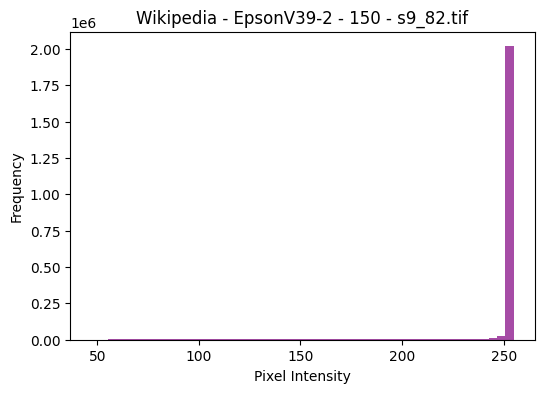

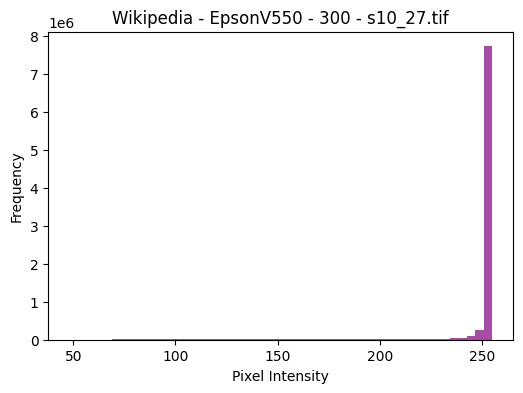

...

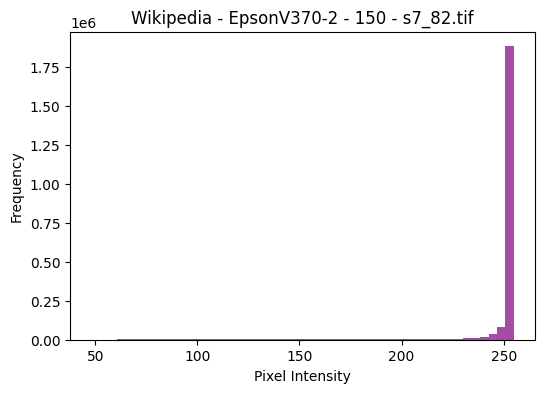

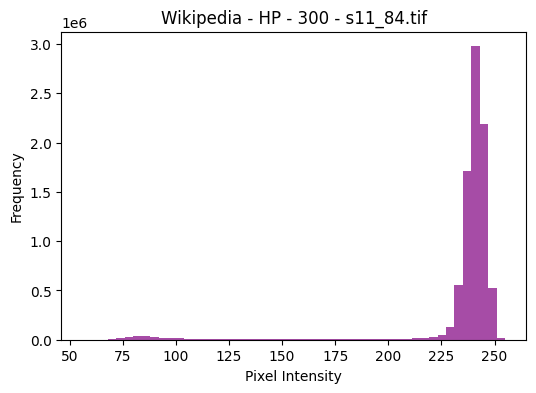

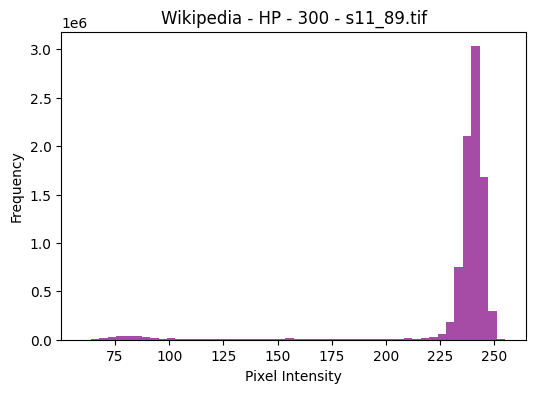

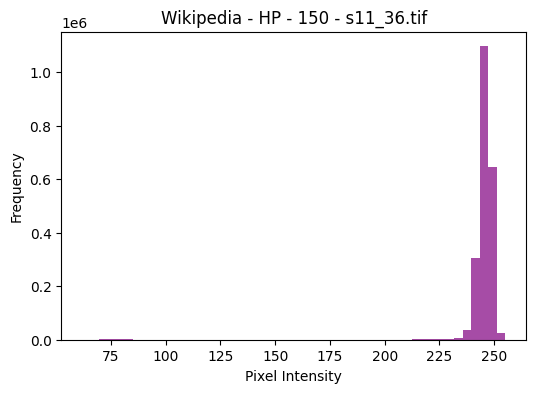

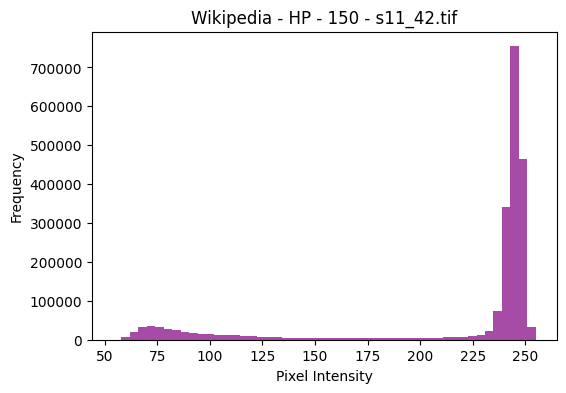


--- Wikipedia Pixel Statistics ---
        Scanner Resolution  Mean Intensity     Variance  Images Analyzed
0    EpsonV39-2        300      246.852992   975.607151                5
1    EpsonV39-2        150      243.748624  1346.858656                5
2     EpsonV550        300      246.903048   921.061471                5
3     EpsonV550        150      238.490160  2085.180479                5
4   EpsonV370-1        300      244.522371  1052.835978                5
5   EpsonV370-1        150      247.330326   783.626221                5
6    EpsonV39-1        300      246.500829  1028.345865                5
7    EpsonV39-1        150      246.599327   981.993376                5
8    Canon120-1        150      241.649688  1695.330830                5
9    Canon120-1        300      242.758676  1622.352018                5
10   Canon120-2        150      247.473249   944.938462                5
11   Canon120-2        300      244.344739  1375.286507                5
12     Canon220

In [ ]:
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random

dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")
results = []

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():  # Canon, Epson, HP
        for res_dir in scanner_dir.iterdir():
            if res_dir.is_dir():  # 150 or 300
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files:
                    continue

                # Sample a few images per scanner-resolution
                sample_files = random.sample(tif_files, min(5, len(tif_files)))
                means, variances = [], []

                for idx, file_path in enumerate(sample_files):
                    try:
                        with Image.open(file_path) as img:
                            arr = np.array(img.convert("L")).flatten()
                            means.append(np.mean(arr))
                            variances.append(np.var(arr))

                            # Plot histogram for first 2 samples
                            if idx < 2:
                                plt.figure(figsize=(6,4))
                                plt.hist(arr, bins=50, color="purple", alpha=0.7)
                                plt.title(f"Wikipedia - {scanner_dir.name} - {res_dir.name} - {file_path.name}")
                                plt.xlabel("Pixel Intensity")
                                plt.ylabel("Frequency")
                                plt.show()
                    except Exception as e:
                        print(f"Error reading {file_path}: {e}")

                # Aggregate statistics per scanner-resolution
                if means:
                    results.append({
                        "Scanner": scanner_dir.name,
                        "Resolution": res_dir.name,
                        "Mean Intensity": np.mean(means),
                        "Variance": np.mean(variances),
                        "Images Analyzed": len(sample_files)
                    })

# --- Summary table ---
df = pd.DataFrame(results)
print("\n--- Wikipedia Pixel Statistics ---")
print(df)

Starting FFT analysis for Flatfield dataset...
Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/Canon120-1/300.tif


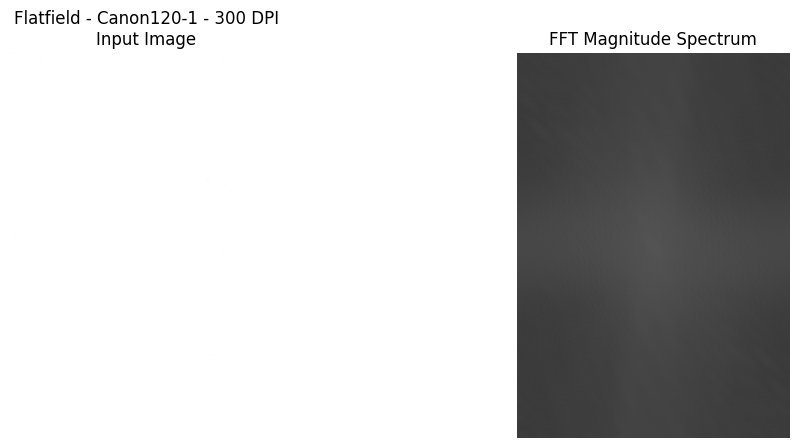

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif
Could not read /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif
Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/Canon120-2/150.tif


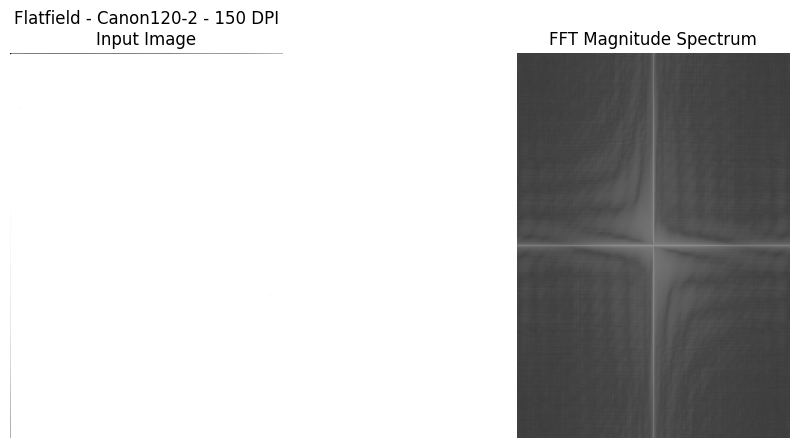

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/Canon220/300.tif


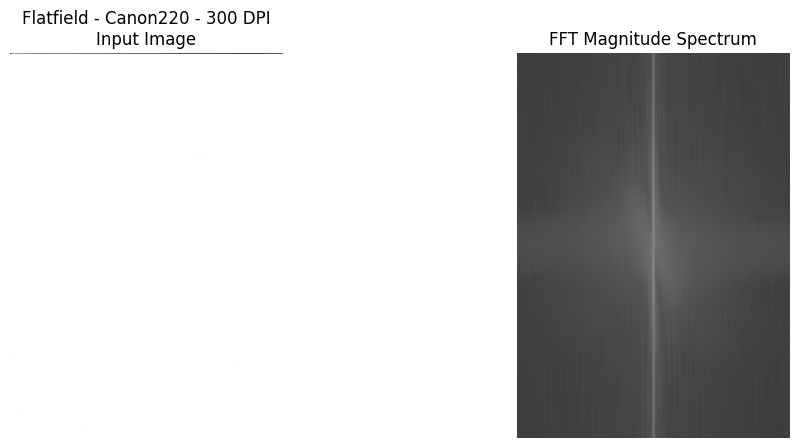

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/HP/300.tif


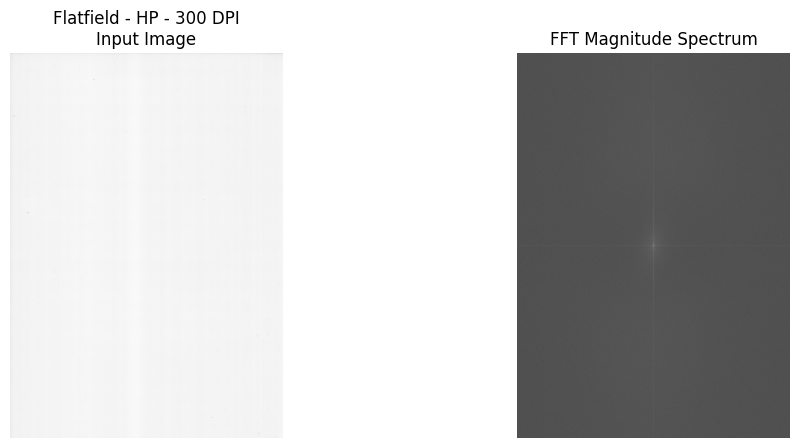

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/EpsonV370-2/150.tif


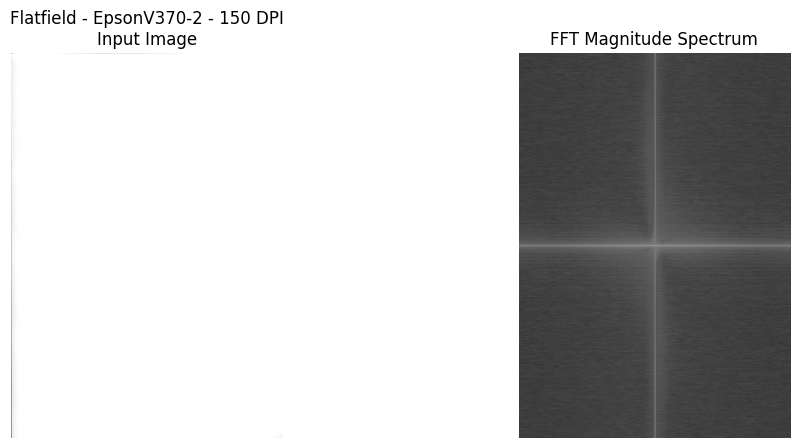

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-2/300.tif


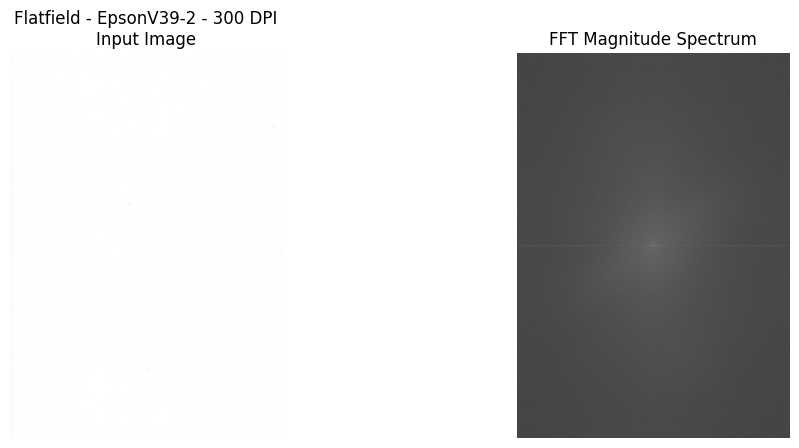

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/Canon9000-1/300.tif


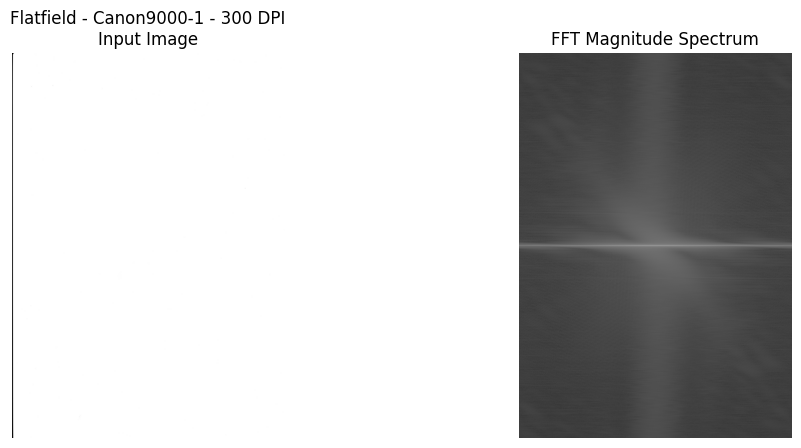

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/EpsonV550/300.tif


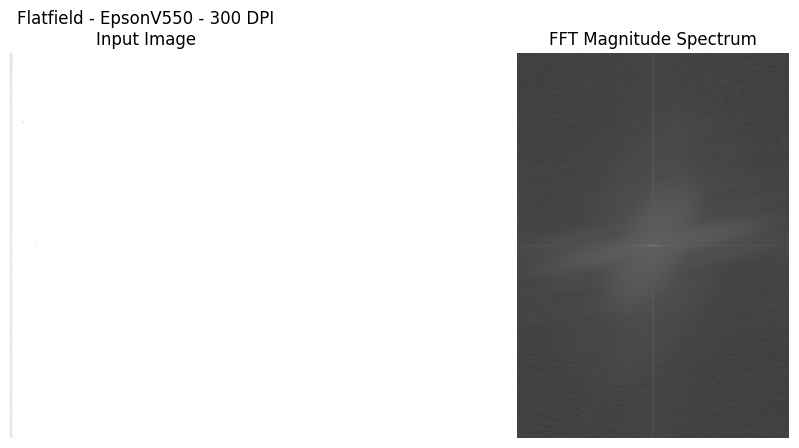

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/EpsonV370-1/300.tif


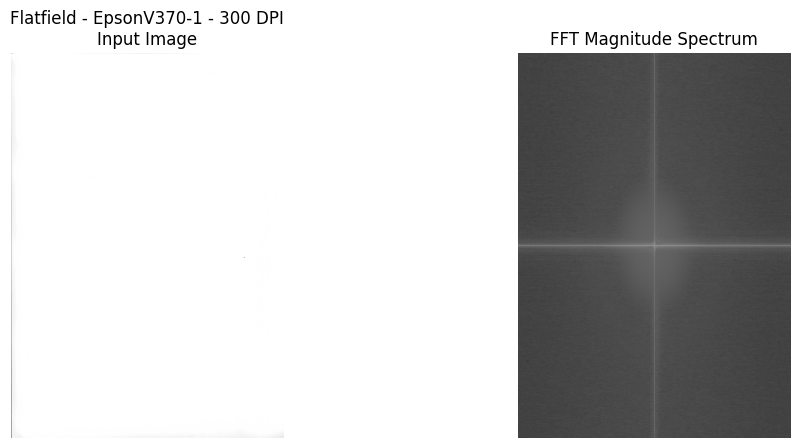

Analyzing and plotting: /content/drive/MyDrive/dataset/Flatfield/Canon9000-2/150.tif


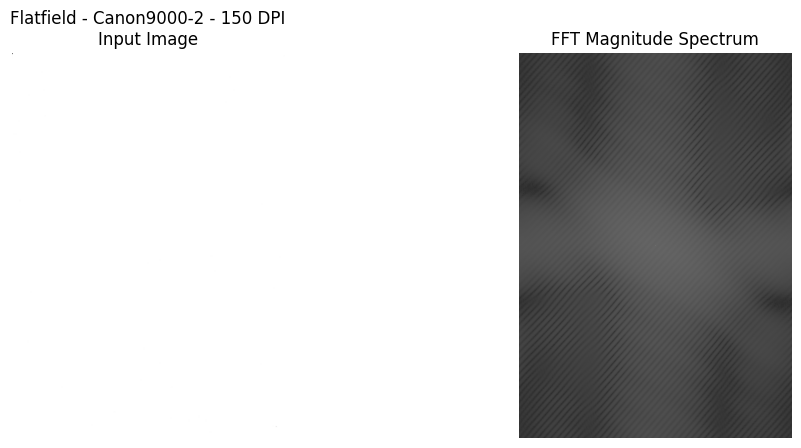

FFT analysis complete for Flatfield dataset.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random

# --- Define FFT plotting function ---
def plot_fft(img_path, dataset_name, scanner, resolution):
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not read {img_path}")
        return

    # Apply FFT
    dft = np.fft.fft2(img)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = 20 * np.log(np.abs(dft_shift) + 1)  # +1 avoids log(0)

    # Plot original + FFT spectrum
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(img, cmap='gray')
    plt.title(f"{dataset_name} - {scanner} - {resolution}\nInput Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("FFT Magnitude Spectrum")
    plt.axis("off")

    plt.show()
    plt.close() # Close the plot to free memory

# --- Example: Run for Flatfield dataset ---
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")
dataset_name = "Flatfield"

print("Starting FFT analysis for Flatfield dataset...")

for scanner_dir in dataset_root.iterdir():
    if scanner_dir.is_dir():  # e.g., Canon120-1, EpsonV39-1
        # Flatfield dataset has images directly under scanner_dir
        image_files = list(scanner_dir.glob("*.tif")) # Assuming .tif files
        if not image_files:
            print(f"No .tif files found directly in {scanner_dir}")
            continue

        # Pick one random sample image per scanner
        sample_file = random.choice(image_files)
        print(f"Analyzing and plotting: {sample_file}")

        # Infer resolution from filename or set to N/A if not clearly indicated
        resolution_str = "N/A"
        if "150" in sample_file.name:
            resolution_str = "150 DPI"
        elif "300" in sample_file.name:
            resolution_str = "300 DPI"

        # Call FFT plot function
        plot_fft(sample_file, dataset_name, scanner_dir.name, resolution_str)

print("FFT analysis complete for Flatfield dataset.")


In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Official")
dataset_name = "Official"

print("Starting FFT analysis for Official dataset...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():  # 150, 300
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files:
                    print(f"No .tif files in {res_dir}")
                    continue
                sample_file = random.choice(tif_files)
                print(f"Analyzing: {sample_file}")
                plot_fft(sample_file, dataset_name, scanner_dir.name, res_dir.name)

print("FFT analysis complete for Official dataset.")

In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")
dataset_name = "Wikipedia"

print("Starting FFT analysis for Wikipedia dataset...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():  # 150, 300
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files:
                    print(f"No .tif files in {res_dir}")
                    continue
                sample_file = random.choice(tif_files)
                print(f"Analyzing: {sample_file}")
                plot_fft(sample_file, dataset_name, scanner_dir.name, res_dir.name)

print("FFT analysis complete for Wikipedia dataset.")

Starting FFT analysis for Tampered dataset...
Analyzing: /content/drive/MyDrive/dataset/Tampered images/Tampered/Splicing/s9_58_a.tif


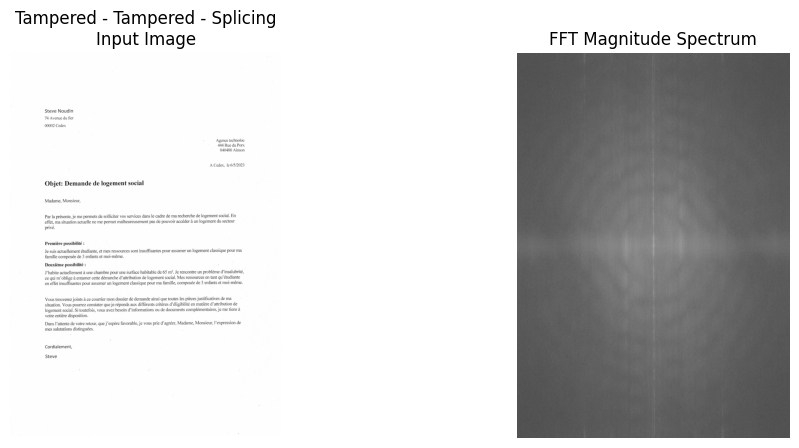

Analyzing: /content/drive/MyDrive/dataset/Tampered images/Tampered/Retouching/s9_59_c.tif


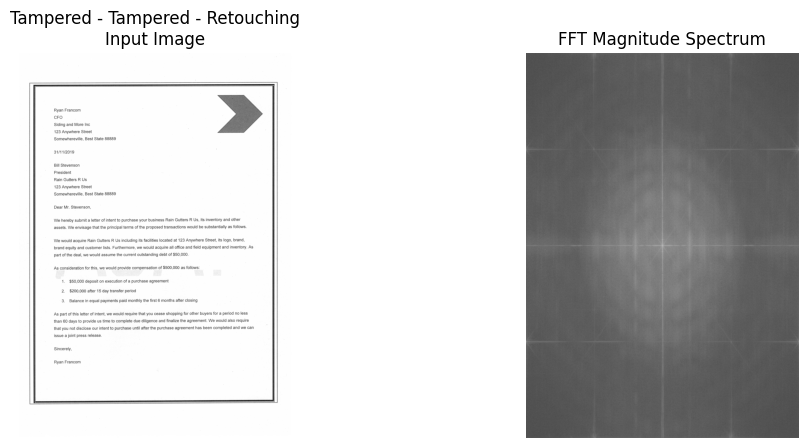

No .tif files in /content/drive/MyDrive/dataset/Tampered images/Tampered/Copy-Move
Analyzing: /content/drive/MyDrive/dataset/Tampered images/Binary masks/Splicing/s1_81_a1.tif


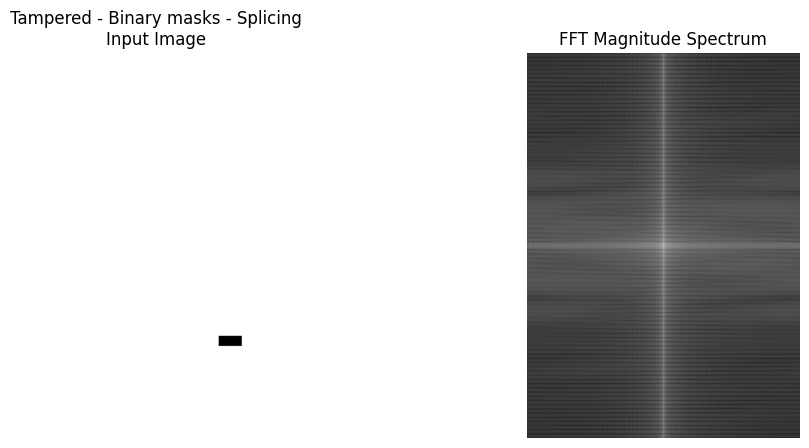

Analyzing: /content/drive/MyDrive/dataset/Tampered images/Binary masks/Retouching/s1_81_c1.tif


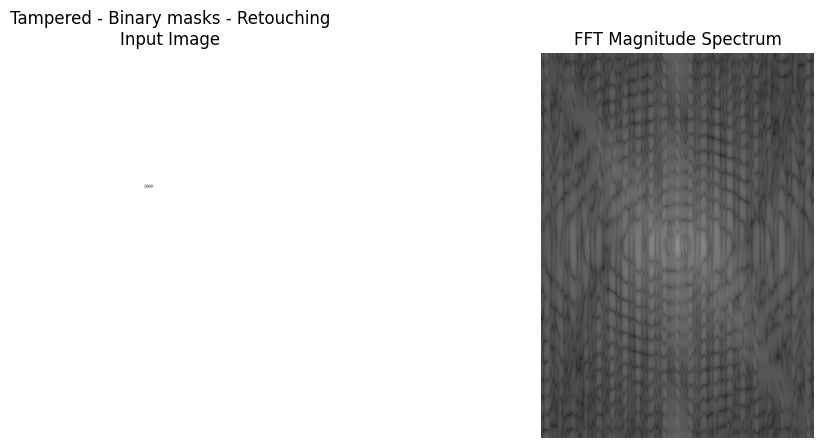

No .tif files in /content/drive/MyDrive/dataset/Tampered images/Binary masks/Copy-Move
FFT analysis complete for Tampered dataset.


In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Tampered images")
dataset_name = "Tampered"

print("Starting FFT analysis for Tampered dataset...")

for main_folder in ["Tampered", "Binary masks"]:
    folder_path = dataset_root / main_folder
    if folder_path.exists():
        for subfolder in ["Splicing", "Retouching", "Copy-Move"]:
            sub_path = folder_path / subfolder
            tif_files = list(sub_path.glob("*.tif"))
            if not tif_files:
                print(f"No .tif files in {sub_path}")
                continue
            sample_file = random.choice(tif_files)
            print(f"Analyzing: {sample_file}")
            plot_fft(sample_file, dataset_name, main_folder, subfolder)

print("FFT analysis complete for Tampered dataset.")

In [ ]:
dataset_root = Path("/content/drive/MyDrive/dataset/Originals")
dataset_name = "Originals"

print("Starting FFT analysis for Originals dataset...")

found_image_for_fft = False
for scanner_dir in dataset_root.iterdir():  # e.g., 'official', 'wikipedia'
    if scanner_dir.is_dir():
        print(f"Processing scanner directory: {scanner_dir.name}")
        # Iterate directly over files in scanner_dir, using rglob to find files in potential subdirectories
        for file_path in scanner_dir.rglob("*.*"):
            ext = file_path.suffix.lower()
            if ext in [".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"]:
                # This is an image, attempt FFT
                found_image_for_fft = True
                # Originals dataset doesn't have explicit resolution folders, infer from filename or use N/A
                resolution_str = "N/A"
                if "150" in file_path.name.lower():
                    resolution_str = "150 DPI"
                elif "300" in file_path.name.lower():
                    resolution_str = "300 DPI"

                print(f"Analyzing image for FFT: {file_path}")
                plot_fft(file_path, dataset_name, scanner_dir.name, resolution_str)
            elif ext == ".pdf":
                print(f"Skipping PDF file for FFT analysis: {file_path}. The FFT function is designed for image files.")
            else:
                print(f"Skipping unknown file type for FFT analysis: {file_path}")

if not found_image_for_fft:
    print("\nNo image files suitable for FFT analysis were found in the 'Originals' dataset. ")
    print("This dataset appears to primarily contain PDF documents, which cannot be directly processed by the FFT image analysis function.")

print("FFT analysis complete for Originals dataset.")

Starting FFT analysis for Originals dataset...
Processing scanner directory: official
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/9.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/7.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/11.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/13.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/5.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/official/6.pdf. The FFT function is designed for image files.
Skipping PDF file for FFT analysis: /content/drive/MyDrive/dataset/Originals/o

Starting flat-field residual analysis...
Analyzing: /content/drive/MyDrive/dataset/Flatfield/Canon120-1/150.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif
Could not read /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/Canon120-2/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/Canon220/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/HP/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/EpsonV370-2/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-2/150.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/Canon9000-1/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/EpsonV550/150.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/EpsonV370-1/300.tif
Analyzing: /content/drive/MyDrive/dataset/Flatfield/Canon9000-2/300.tif

Visualizing scanner fingerprints side by side...


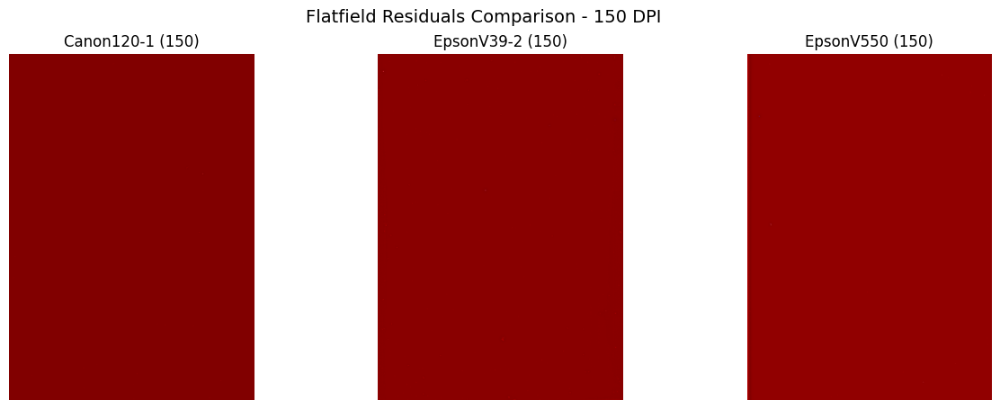

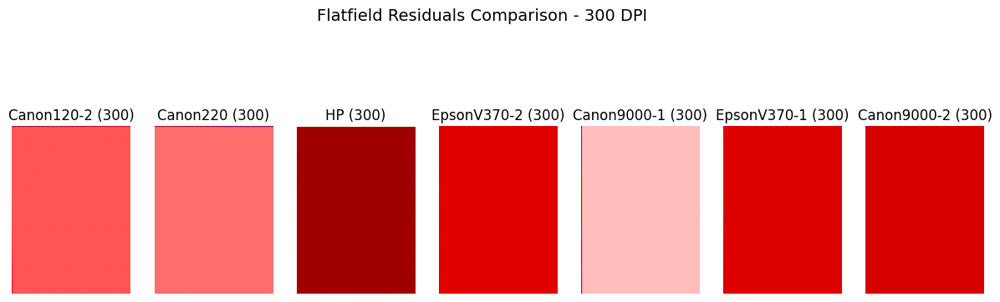


--- Scanner Fingerprint Statistics ---
       Scanner Resolution  Mean Residual  Variance Residual  Residual Energy
0   Canon120-1        150      -0.000031           0.013556     2.945064e+04
1   Canon120-2        300      -0.034339          34.323387     2.986166e+08
2     Canon220        300      -0.017360          29.679144     2.582084e+08
3           HP        300      -0.000693           0.433281     3.764104e+06
4  EpsonV370-2        300      -0.012812           3.182768     2.769097e+07
5   EpsonV39-2        150      -0.000327           0.134383     2.922784e+05
6  Canon9000-1        300      -0.014570          34.927994     3.038698e+08
7    EpsonV550        150      -0.003437           0.266157     5.784399e+05
8  EpsonV370-1        300      -0.017464           5.437709     4.730982e+07
9  Canon9000-2        300      -0.000139           0.143519     1.248598e+06
Flat-field residual analysis complete.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import random
import pandas as pd

def compute_flatfield_residual(img_path):
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not read {img_path}")
        return None, None

    img = img.astype(np.float32)

    # Estimate "ideal flatfield" using Gaussian blur (low-pass filter)
    ideal = cv2.GaussianBlur(img, (51, 51), 0)

    # Residual = actual - ideal
    residual = img - ideal

    return img, residual

def plot_flatfield_residual(img, residual, dataset_name, scanner, resolution):
    plt.figure(figsize=(12,5))

    # Original flatfield
    plt.subplot(1,2,1)
    plt.imshow(img, cmap='gray')
    plt.title(f"{dataset_name} - {scanner} - {resolution}\nFlatfield Input")
    plt.axis("off")

    # Residuals (auto-scaled for visibility)
    plt.subplot(1,2,2)
    plt.imshow(residual, cmap='seismic', vmin=residual.min(), vmax=residual.max())
    plt.title("Flatfield Residual (Scanner Fingerprint)")
    plt.axis("off")

    plt.show()
    plt.close()

# --- Run for Flatfield dataset ---
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")
dataset_name = "Flatfield"

print("Starting flat-field residual analysis...")

results = []

# Collect one sample per scanner-resolution
samples = []

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        # Flatfield dataset has images directly under scanner_dir
        tif_files = list(scanner_dir.glob("*.tif"))
        if not tif_files:
            print(f"No .tif files found directly in {scanner_dir}")
            continue

        # Pick one random sample image per scanner
        sample_file = random.choice(tif_files)
        print(f"Analyzing: {sample_file}")

        # Infer resolution from filename or set to N/A if not clearly indicated
        resolution_str = "N/A"
        if "150" in sample_file.name:
            resolution_str = "150"
        elif "300" in sample_file.name:
            resolution_str = "300"

        img, residual = compute_flatfield_residual(sample_file)
        if img is not None:
            # Save for comparison plotting
            samples.append((scanner_dir.name, resolution_str, img, residual))

            # Compute fingerprint statistics
            mean_dev = np.mean(residual)
            var_dev = np.var(residual)
            energy = np.sum(residual**2)

            results.append({
                "Scanner": scanner_dir.name,
                "Resolution": resolution_str,
                "Mean Residual": mean_dev,
                "Variance Residual": var_dev,
                "Residual Energy": energy
            })

# --- Comparison Visualization ---
print("\nVisualizing scanner fingerprints side by side...")
for resolution in ["150", "300"]:
    # Filter samples for the current resolution
    current_res_samples = [s for s in samples if s[1] == resolution]
    if not current_res_samples:
        print(f"No samples found for {resolution} DPI.")
        continue

    fig, axes = plt.subplots(1, len(current_res_samples), figsize=(15,5))
    fig.suptitle(f"Flatfield Residuals Comparison - {resolution} DPI", fontsize=14)

    # Handle case where there's only one subplot
    if len(current_res_samples) == 1:
        scanner, res, img, residual = current_res_samples[0]
        axes.imshow(residual, cmap='seismic', vmin=residual.min(), vmax=residual.max())
        axes.set_title(f"{scanner} ({res})")
        axes.axis("off")
    else:
        for idx, (scanner, res, img, residual) in enumerate(current_res_samples):
            axes[idx].imshow(residual, cmap='seismic', vmin=residual.min(), vmax=residual.max())
            axes[idx].set_title(f"{scanner} ({res})")
            axes[idx].axis("off")
    plt.show()
    plt.close() # Close the figure after showing

# --- Summary table ---
df = pd.DataFrame(results)
print("\n--- Scanner Fingerprint Statistics ---")
print(df)
print("Flat-field residual analysis complete.")


In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path

# --- Parameters ---
dataset_root = Path("/content/drive/MyDrive/dataset/Official")
output_root = Path("/content/drive/MyDrive/dataset/Official_Preprocessed")
output_root.mkdir(parents=True, exist_ok=True)

fixed_size = (256, 256)  # resize target

print("Starting preprocessing for Official dataset...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():  # 150, 300
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files:
                    print(f"No .tif files in {res_dir}")
                    continue

                # Create output folder
                out_dir = output_root / scanner_dir.name / res_dir.name
                out_dir.mkdir(parents=True, exist_ok=True)

                for file_path in tif_files[:5]:  # limit to first 5 for demo
                    # Read image in grayscale
                    img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
                    if img is None:
                        print(f"Could not read {file_path}")
                        continue

                    # Resize to fixed size
                    img_resized = cv2.resize(img, fixed_size, interpolation=cv2.INTER_AREA)

                    # Construct clean filename
                    out_name = f"{scanner_dir.name}_{res_dir.name}_{file_path.stem}.tif"
                    out_path = out_dir / out_name

                    # Save preprocessed image
                    cv2.imwrite(str(out_path), img_resized)

                    # --- Show original vs preprocessed in Colab ---
                    plt.figure(figsize=(6,3))
                    plt.subplot(1,2,1)
                    plt.imshow(img, cmap='gray')
                    plt.title("Original")
                    plt.axis("off")

                    plt.subplot(1,2,2)
                    plt.imshow(img_resized, cmap='gray')
                    plt.title("Preprocessed (256x256)")
                    plt.axis("off")

                    plt.suptitle(out_name)
                    plt.show()

                print(f"Processed {len(tif_files)} images in {scanner_dir.name}/{res_dir.name}")

print("Preprocessing complete. Preprocessed dataset saved to:", output_root)


In [ ]:
import cv2, matplotlib.pyplot as plt
from pathlib import Path

dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")
output_root = Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed")
output_root.mkdir(parents=True, exist_ok=True)

fixed_size = (256, 256)

print("Starting preprocessing for Wikipedia dataset...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():  # 150, 300
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files: continue
                out_dir = output_root / scanner_dir.name / res_dir.name
                out_dir.mkdir(parents=True, exist_ok=True)

                for file_path in tif_files[:5]:  # limit to first 5 for demo
                    img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
                    if img is None: continue
                    img_resized = cv2.resize(img, fixed_size)

                    out_name = f"{scanner_dir.name}_{res_dir.name}_{file_path.stem}.tif"
                    cv2.imwrite(str(out_dir / out_name), img_resized)

                    plt.figure(figsize=(6,3))
                    plt.subplot(1,2,1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis("off")
                    plt.subplot(1,2,2); plt.imshow(img_resized, cmap='gray'); plt.title("Preprocessed"); plt.axis("off")
                    plt.suptitle(out_name); plt.show()

print("Wikipedia preprocessing complete.")


Starting preprocessing for Flatfield dataset...


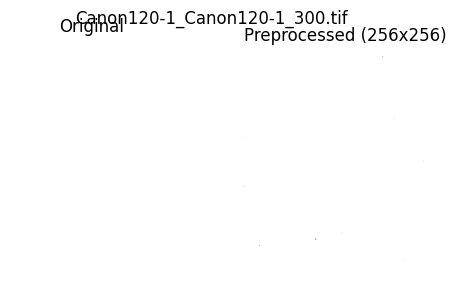

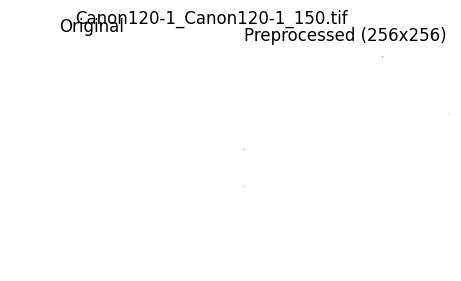

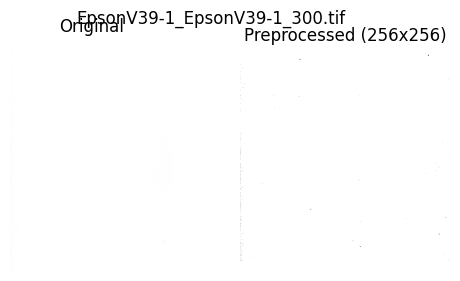

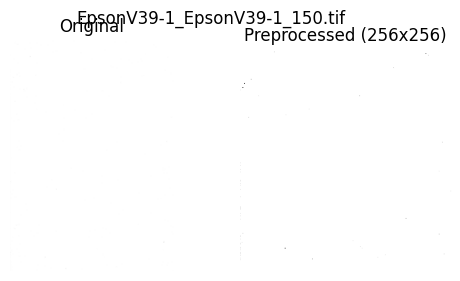

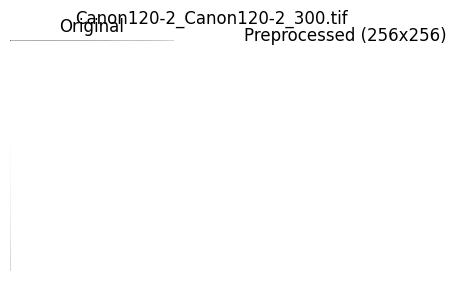

...

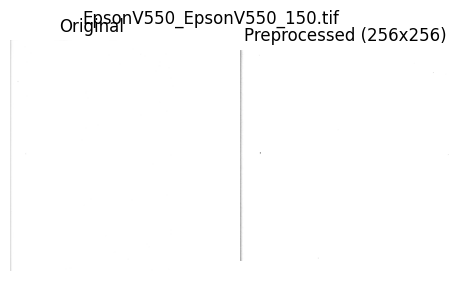

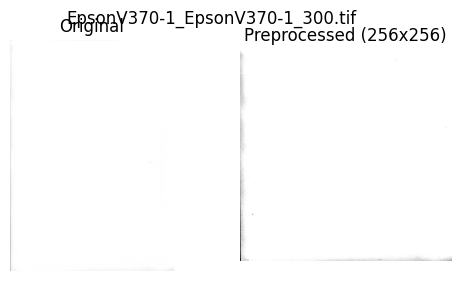

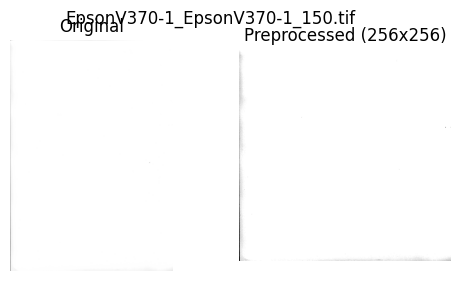

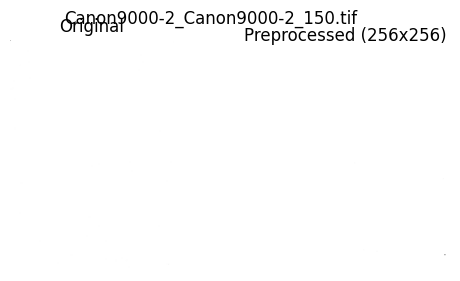

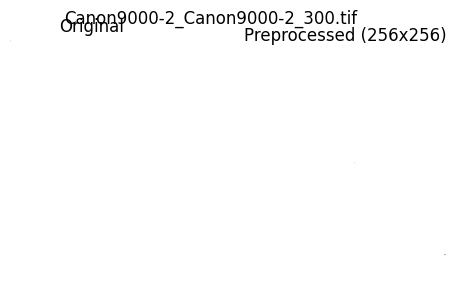

Flatfield preprocessing complete. Output saved to: /content/drive/MyDrive/dataset/Flatfield_Preprocessed


In [ ]:
import cv2, matplotlib.pyplot as plt
from pathlib import Path

dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield")
output_root = Path("/content/drive/MyDrive/dataset/Flatfield_Preprocessed")
output_root.mkdir(parents=True, exist_ok=True)

fixed_size = (256, 256)

print("Starting preprocessing for Flatfield dataset...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        res_dirs = [d for d in scanner_dir.iterdir() if d.is_dir()]
        if not res_dirs:  # if no resolution subfolders
            res_dirs = [scanner_dir]

        for res_dir in res_dirs:
            tif_files = []
            for ext in ["*.tif", "*.tiff", "*.png", "*.jpg"]:
                tif_files.extend(res_dir.glob(ext))

            if not tif_files:
                print(f"No image files in {res_dir}")
                continue

            out_dir = output_root / scanner_dir.name / res_dir.name
            out_dir.mkdir(parents=True, exist_ok=True)

            for file_path in tif_files[:5]:  # limit to first 5 for demo
                # Skip hidden/system files
                if file_path.name.startswith("._"):
                    continue

                img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
                if img is None:
                    print(f"Could not read {file_path}")
                    continue

                img_resized = cv2.resize(img, fixed_size)
                out_name = f"{scanner_dir.name}_{res_dir.name}_{file_path.stem}.tif"
                cv2.imwrite(str(out_dir / out_name), img_resized)

                # Show original vs preprocessed
                plt.figure(figsize=(6,3))
                plt.subplot(1,2,1); plt.imshow(img, cmap='gray'); plt.title("Original"); plt.axis("off")
                plt.subplot(1,2,2); plt.imshow(img_resized, cmap='gray'); plt.title("Preprocessed (256x256)"); plt.axis("off")
                plt.suptitle(out_name); plt.show()

print("Flatfield preprocessing complete. Output saved to:", output_root)

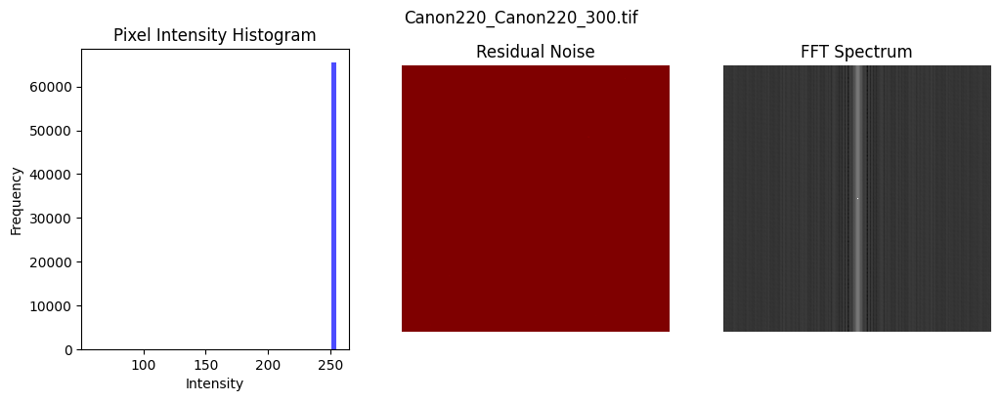

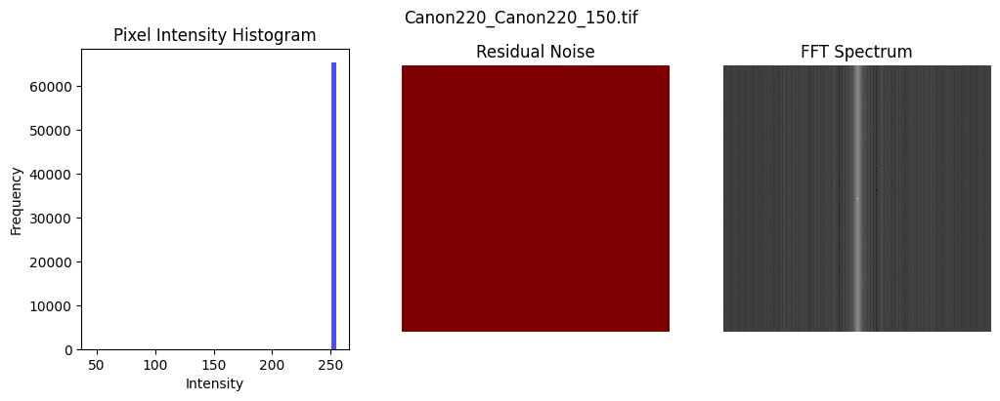

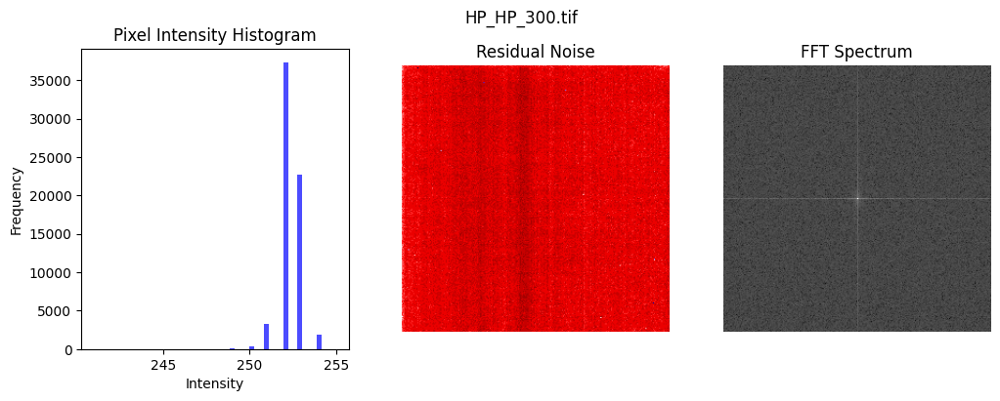

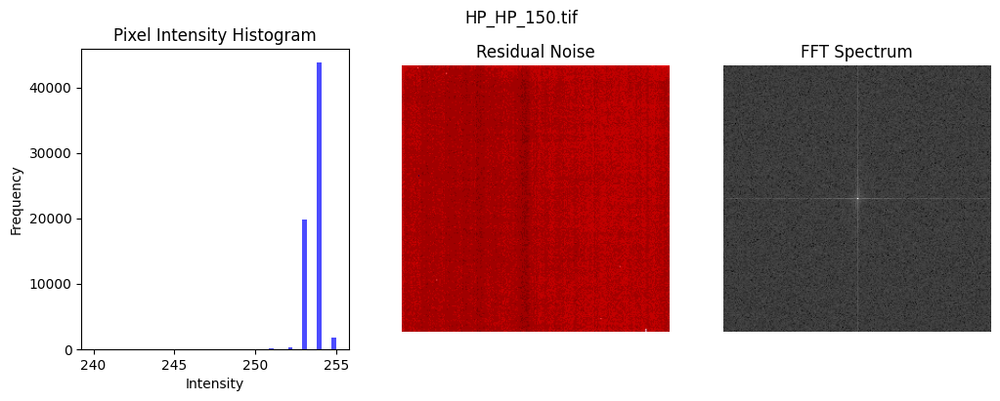

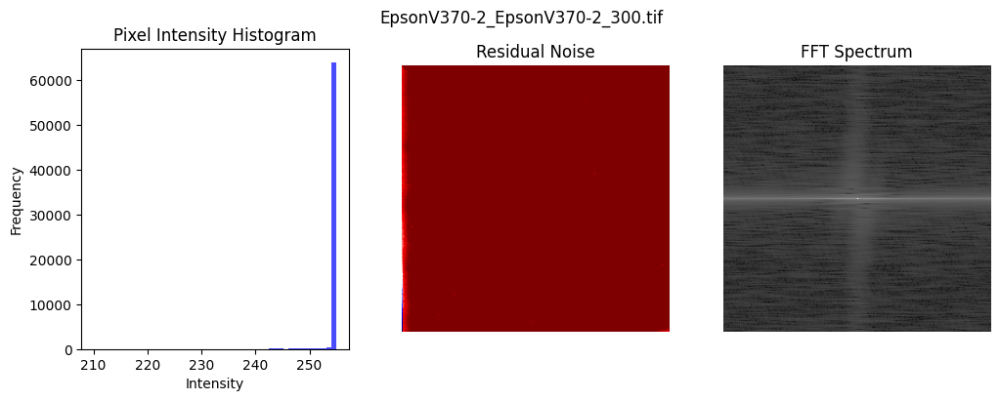

Exploratory analysis complete for Flatfield dataset.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.restoration import denoise_wavelet

# --- Parameters ---
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield_Preprocessed")
fixed_size = (256, 256)

def exploratory_analysis(file_path):
    # Read image in grayscale
    img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not read {file_path}")
        return

    # --- Pixel Intensity Histogram ---
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1)
    plt.hist(img.ravel(), bins=50, color='blue', alpha=0.7)
    plt.title("Pixel Intensity Histogram")
    plt.xlabel("Intensity"); plt.ylabel("Frequency")

    # --- Residual Noise Extraction ---
    denoised = denoise_wavelet(img)
    residual = img - denoised
    plt.subplot(1,3,2)
    plt.imshow(residual, cmap='seismic')
    plt.title("Residual Noise")
    plt.axis("off")

    # --- FFT Frequency Spectrum ---
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift)+1)
    plt.subplot(1,3,3)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("FFT Spectrum")
    plt.axis("off")

    plt.suptitle(file_path.name)
    plt.show()

# --- Run EDA on first few samples ---
sample_files = list(dataset_root.rglob("*.tif"))[:5]  # first 5 images
for file in sample_files:
    exploratory_analysis(file)

print("Exploratory analysis complete for Flatfield dataset.")

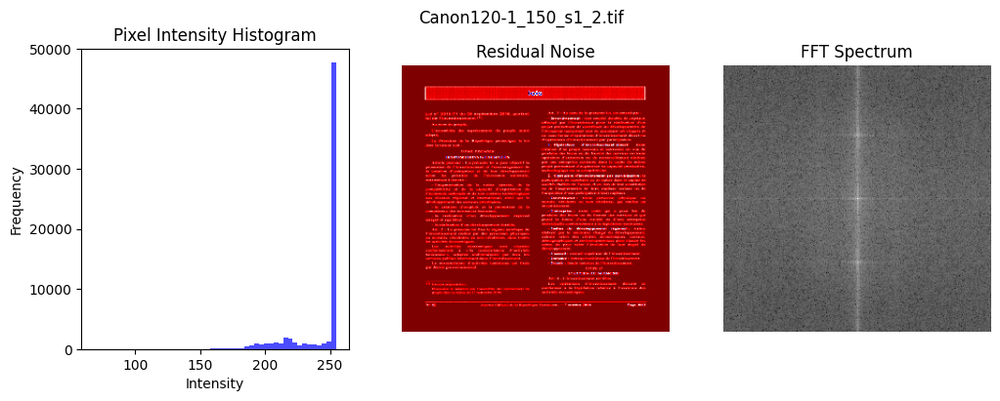

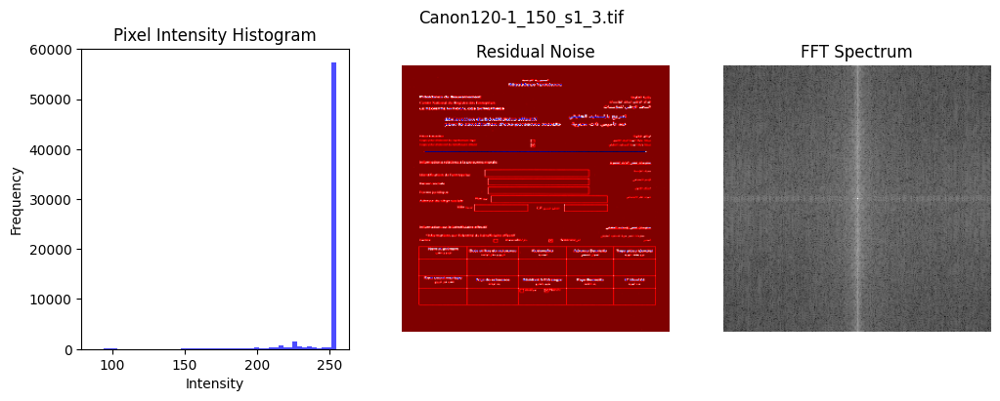

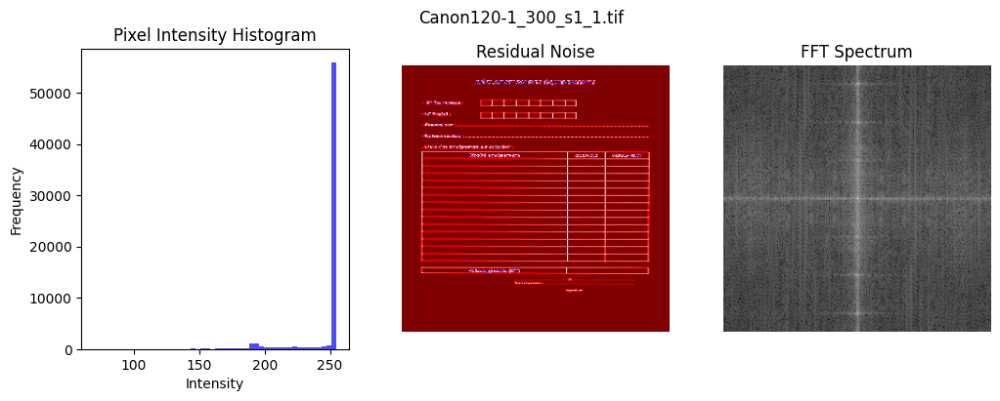

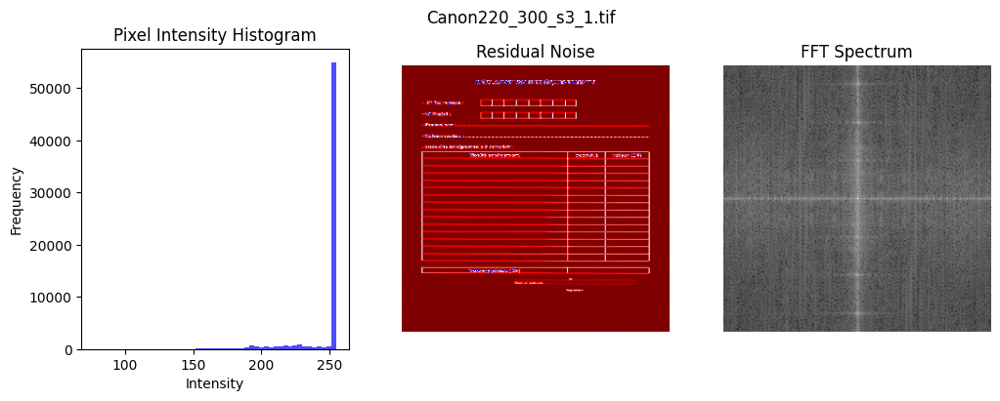

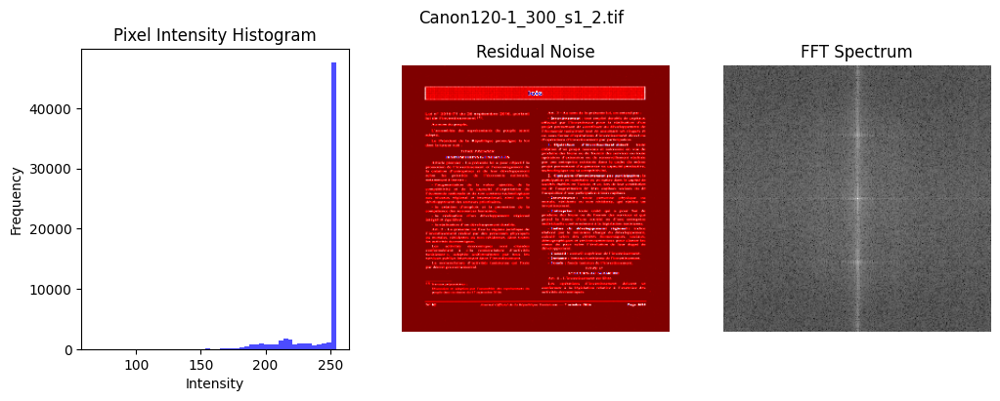

Exploratory analysis complete for Official dataset.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.restoration import denoise_wavelet

# --- Parameters ---
dataset_root = Path("/content/drive/MyDrive/dataset/Official_Preprocessed")

def exploratory_analysis(file_path):
    # Read image in grayscale
    img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not read {file_path}")
        return

    plt.figure(figsize=(12,4))

    # --- Pixel Intensity Histogram ---
    plt.subplot(1,3,1)
    plt.hist(img.ravel(), bins=50, color='blue', alpha=0.7)
    plt.title("Pixel Intensity Histogram")
    plt.xlabel("Intensity"); plt.ylabel("Frequency")

    # --- Residual Noise Extraction ---
    denoised = denoise_wavelet(img)
    residual = img - denoised
    plt.subplot(1,3,2)
    plt.imshow(residual, cmap='seismic')
    plt.title("Residual Noise")
    plt.axis("off")

    # --- FFT Frequency Spectrum ---
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift)+1)
    plt.subplot(1,3,3)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("FFT Spectrum")
    plt.axis("off")

    plt.suptitle(file_path.name)
    plt.show()

# --- Run EDA on first few samples ---
sample_files = list(dataset_root.rglob("*.tif"))[:5]  # first 5 images
for file in sample_files:
    exploratory_analysis(file)

print("Exploratory analysis complete for Official dataset.")

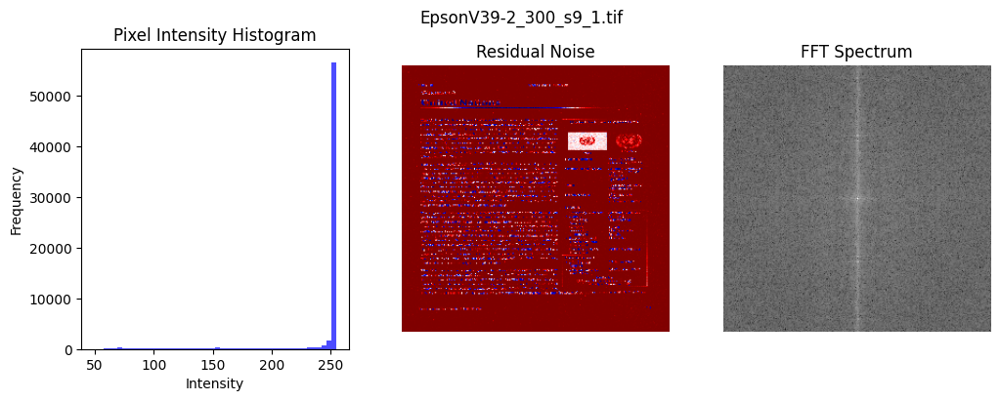

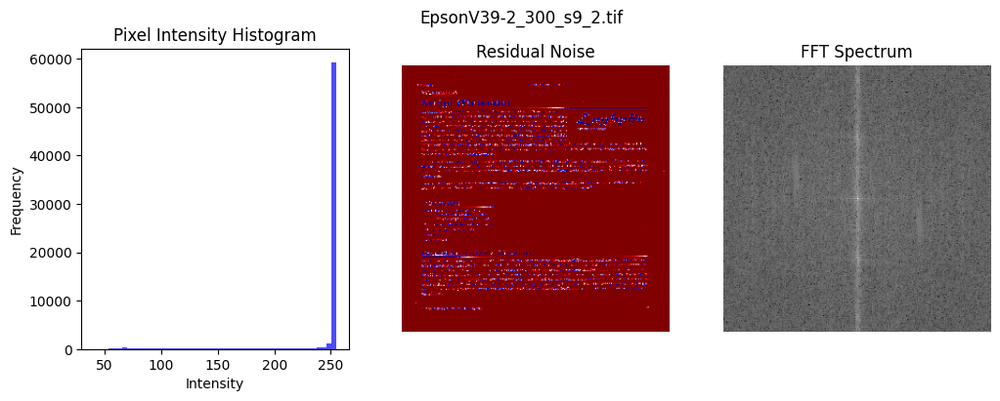

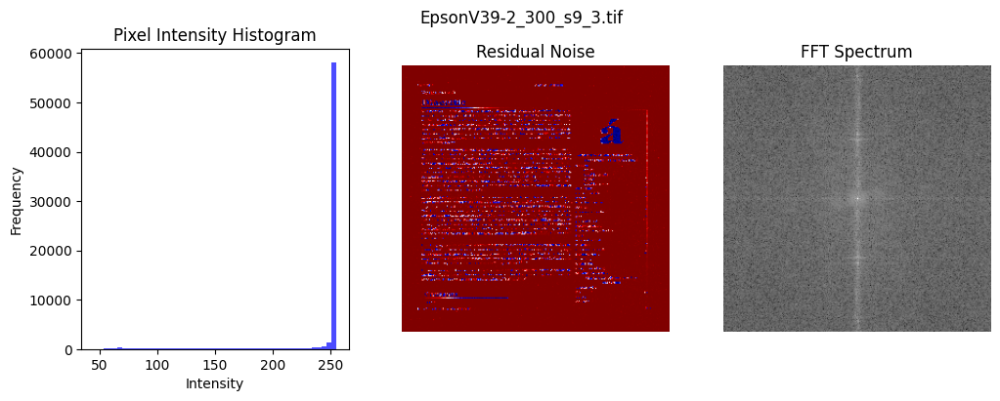

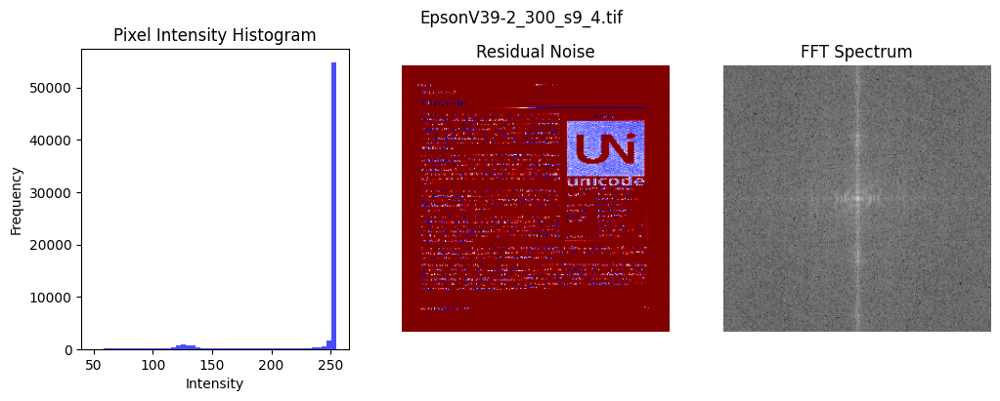

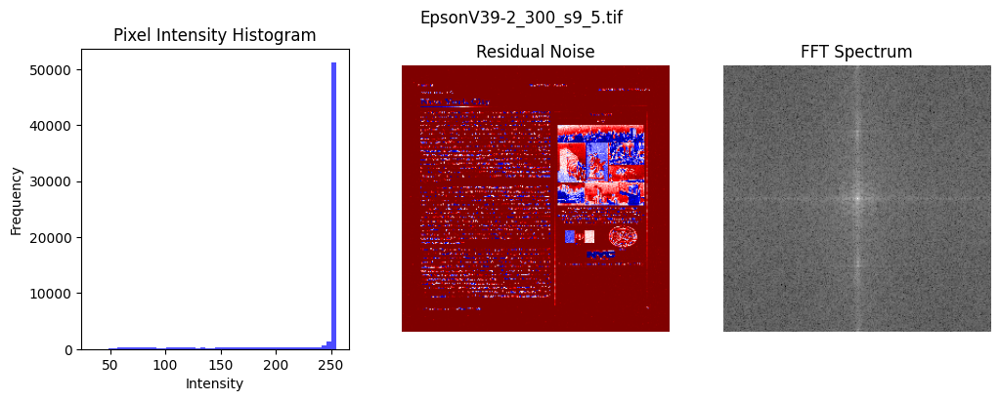

Exploratory analysis complete for Wikipedia dataset.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.restoration import denoise_wavelet

# --- Parameters ---
dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed")

def exploratory_analysis(file_path):
    # Read image in grayscale
    img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"Could not read {file_path}")
        return

    plt.figure(figsize=(12,4))

    # --- Pixel Intensity Histogram ---
    plt.subplot(1,3,1)
    plt.hist(img.ravel(), bins=50, color='blue', alpha=0.7)
    plt.title("Pixel Intensity Histogram")
    plt.xlabel("Intensity"); plt.ylabel("Frequency")

    # --- Residual Noise Extraction ---
    denoised = denoise_wavelet(img)
    residual = img - denoised
    plt.subplot(1,3,2)
    plt.imshow(residual, cmap='seismic')
    plt.title("Residual Noise")
    plt.axis("off")

    # --- FFT Frequency Spectrum ---
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift)+1)
    plt.subplot(1,3,3)
    plt.imshow(magnitude_spectrum, cmap='gray')
    plt.title("FFT Spectrum")
    plt.axis("off")

    plt.suptitle(file_path.name)
    plt.show()

# --- Run EDA on first few samples ---
sample_files = list(dataset_root.rglob("*.tif"))[:5]  # first 5 images
for file in sample_files:
    exploratory_analysis(file)

print("Exploratory analysis complete for Wikipedia dataset.")

Starting fingerprint extraction...


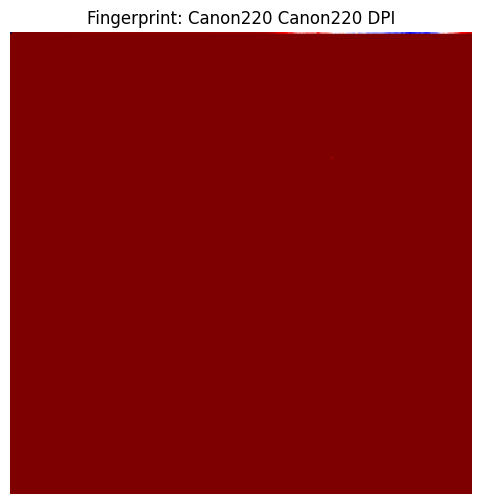

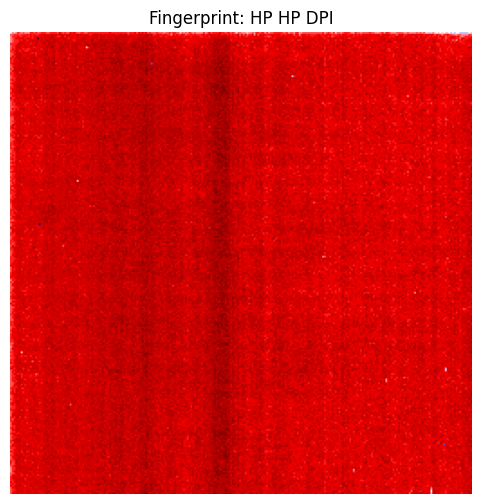

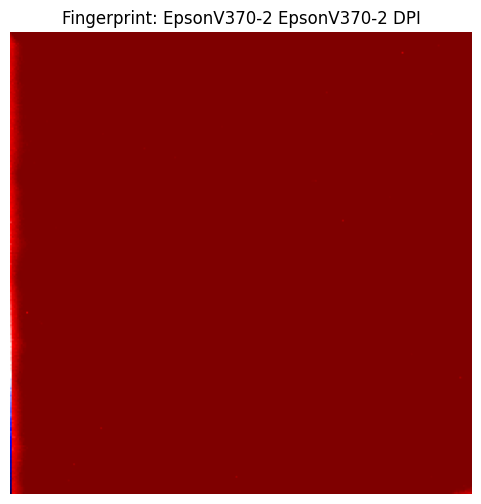

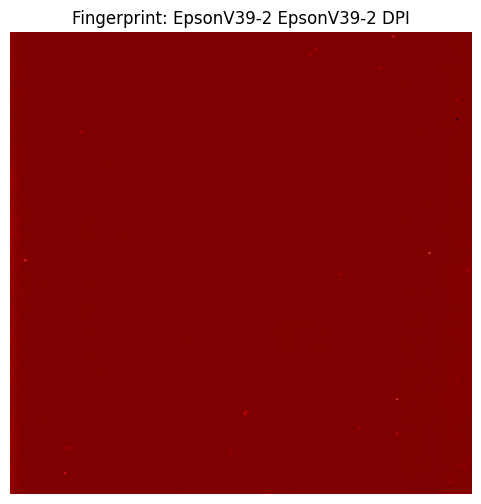

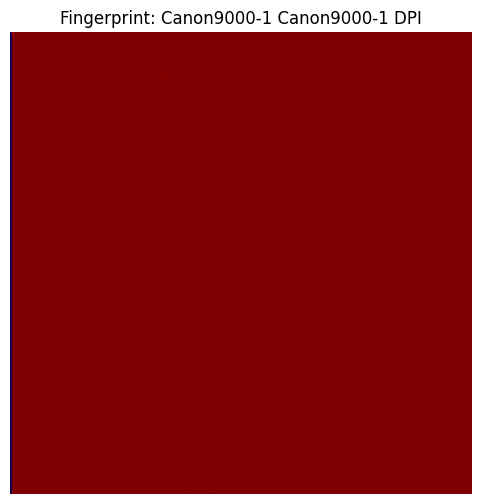

...

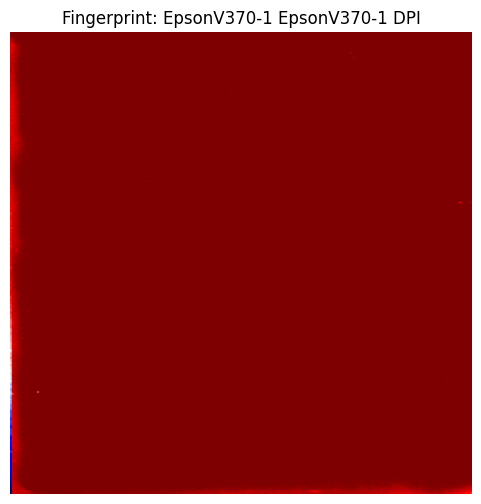

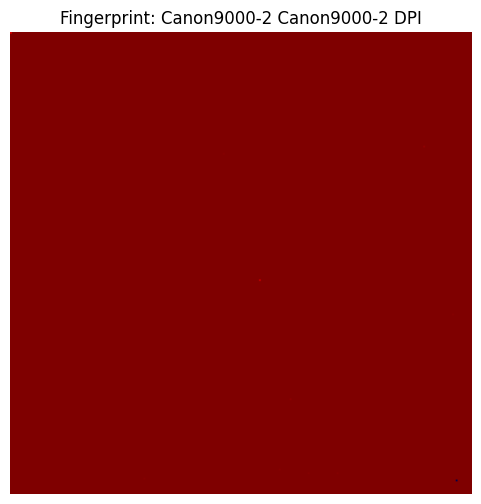

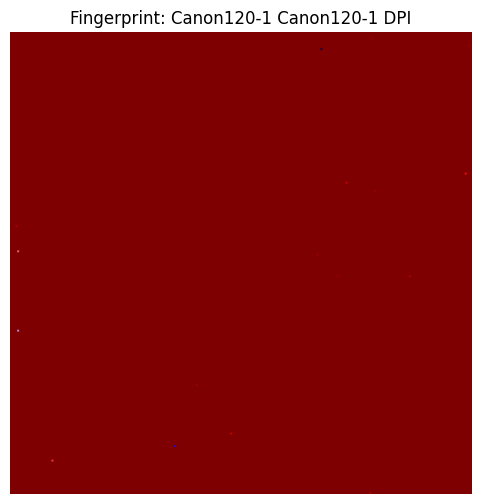

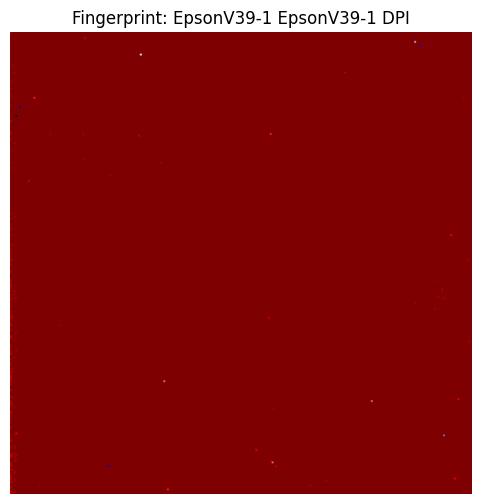

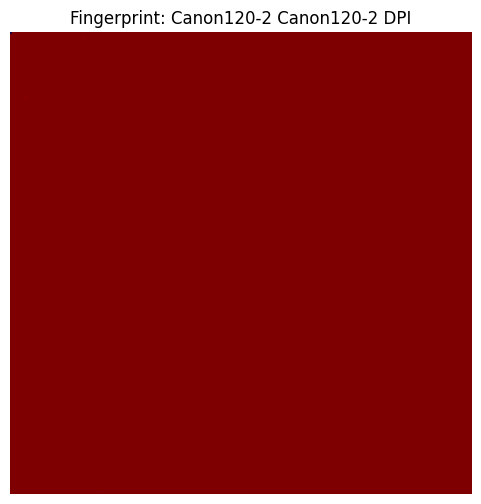

Fingerprint extraction complete. Fingerprints saved to: /content/drive/MyDrive/dataset/Fingerprints


In [ ]:
import cv2
import numpy as np
from pathlib import Path
from skimage.restoration import denoise_wavelet
import matplotlib.pyplot as plt

# --- Parameters ---
dataset_root = Path("/content/drive/MyDrive/dataset/Flatfield_Preprocessed")
output_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
output_root.mkdir(parents=True, exist_ok=True)

fixed_size = (256, 256)

def extract_residual(img):
    """Compute residual = original - denoised"""
    denoised = denoise_wavelet(img)
    residual = img - denoised
    return residual

def generate_fingerprint(image_files):
    """Average residuals across multiple images"""
    residuals = []
    for file_path in image_files:
        img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        residual = extract_residual(img)
        residuals.append(residual)
    if residuals:
        fingerprint = np.mean(residuals, axis=0)
        return fingerprint
    else:
        return None

print("Starting fingerprint extraction...")

for scanner_dir in dataset_root.iterdir():  # Canon, Epson, HP
    if scanner_dir.is_dir():
        for res_dir in scanner_dir.iterdir():  # 150, 300 DPI
            if res_dir.is_dir():
                tif_files = list(res_dir.glob("*.tif"))
                if not tif_files:
                    continue

                # Generate fingerprint
                fingerprint = generate_fingerprint(tif_files[:20])  # use first 20 images for stability
                if fingerprint is None:
                    continue

                # Save fingerprint as .npy file
                out_name = f"{scanner_dir.name}_{res_dir.name}_fingerprint.npy"
                out_path = output_root / out_name
                np.save(out_path, fingerprint)

                # Visualize fingerprint
                plt.figure(figsize=(6,6))
                plt.imshow(fingerprint, cmap='seismic')
                plt.title(f"Fingerprint: {scanner_dir.name} {res_dir.name} DPI")
                plt.axis("off")
                plt.show()

print("Fingerprint extraction complete. Fingerprints saved to:", output_root)


Loaded fingerprints: ['Canon220_150_fingerprint', 'EpsonV370-2_150_fingerprint', 'EpsonV370-1_150_fingerprint', 'Canon9000-2_300_fingerprint', 'Canon120-2_150_fingerprint', 'HP_150_fingerprint', 'EpsonV39-2_150_fingerprint', 'EpsonV550_150_fingerprint', 'Canon9000-1_150_fingerprint', 'EpsonV39-1_150_fingerprint', 'EpsonV39-2_300_fingerprint', 'EpsonV550_300_fingerprint', 'EpsonV370-1_300_fingerprint', 'EpsonV39-1_300_fingerprint', 'Canon120-1_150_fingerprint', 'Canon120-2_300_fingerprint', 'Canon9000-1_300_fingerprint', 'Canon9000-2_150_fingerprint', 'EpsonV370-2_300_fingerprint', 'HP_300_fingerprint', 'Canon220_300_fingerprint', 'Canon120-1_300_fingerprint', 'Canon220_Canon220_fingerprint', 'HP_HP_fingerprint', 'EpsonV370-2_EpsonV370-2_fingerprint', 'EpsonV39-2_EpsonV39-2_fingerprint', 'Canon9000-1_Canon9000-1_fingerprint', 'EpsonV550_EpsonV550_fingerprint', 'EpsonV370-1_EpsonV370-1_fingerprint', 'Canon9000-2_Canon9000-2_fingerprint', 'Canon120-1_Canon120-1_fingerprint', 'EpsonV39-1_E

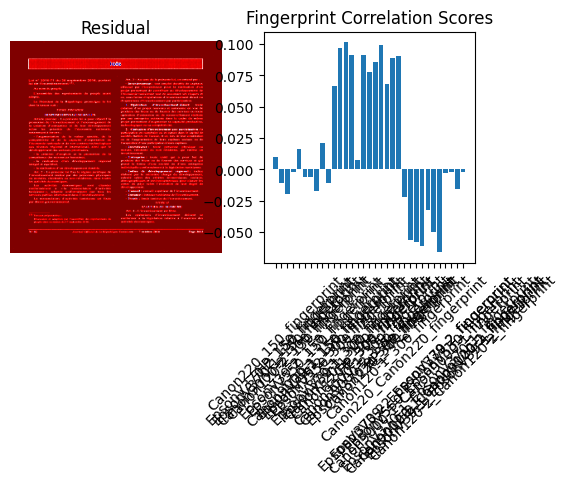

Image: Canon120-1_150_s1_3.tif
  Correlation with Canon220_150_fingerprint: 0.0242
  Correlation with EpsonV370-2_150_fingerprint: -0.0011
  Correlation with EpsonV370-1_150_fingerprint: 0.0243
  Correlation with Canon9000-2_300_fingerprint: 0.0098
  Correlation with Canon120-2_150_fingerprint: 0.0343
  Correlation with HP_150_fingerprint: 0.0057
  Correlation with EpsonV39-2_150_fingerprint: 0.0301
  Correlation with EpsonV550_150_fingerprint: 0.0102
  Correlation with Canon9000-1_150_fingerprint: 0.0080
  Correlation with EpsonV39-1_150_fingerprint: 0.0265
  Correlation with EpsonV39-2_300_fingerprint: 0.0382
  Correlation with EpsonV550_300_fingerprint: 0.0559
  Correlation with EpsonV370-1_300_fingerprint: 0.0575
  Correlation with EpsonV39-1_300_fingerprint: 0.0517
  Correlation with Canon120-1_150_fingerprint: 0.0343
  Correlation with Canon120-2_300_fingerprint: 0.0520
  Correlation with Canon9000-1_300_fingerprint: 0.0448
  Correlation with Canon9000-2_150_fingerprint: 0.0493
 

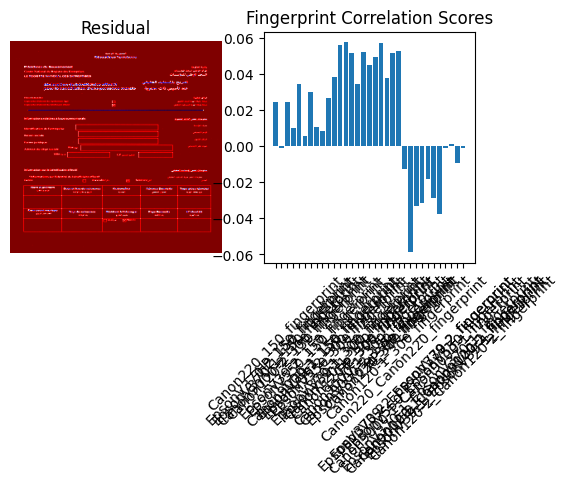

Image: Canon120-1_300_s1_1.tif
  Correlation with Canon220_150_fingerprint: 0.0059
  Correlation with EpsonV370-2_150_fingerprint: -0.0084
  Correlation with EpsonV370-1_150_fingerprint: 0.0108
  Correlation with Canon9000-2_300_fingerprint: 0.0156
  Correlation with Canon120-2_150_fingerprint: 0.0052
  Correlation with HP_150_fingerprint: 0.0195
  Correlation with EpsonV39-2_150_fingerprint: -0.0020
  Correlation with EpsonV550_150_fingerprint: 0.0080
  Correlation with Canon9000-1_150_fingerprint: 0.0098
  Correlation with EpsonV39-1_150_fingerprint: -0.0034
  Correlation with EpsonV39-2_300_fingerprint: 0.0422
  Correlation with EpsonV550_300_fingerprint: 0.0643
  Correlation with EpsonV370-1_300_fingerprint: 0.0651
  Correlation with EpsonV39-1_300_fingerprint: 0.0578
  Correlation with Canon120-1_150_fingerprint: 0.0147
  Correlation with Canon120-2_300_fingerprint: 0.0588
  Correlation with Canon9000-1_300_fingerprint: 0.0506
  Correlation with Canon9000-2_150_fingerprint: 0.0547

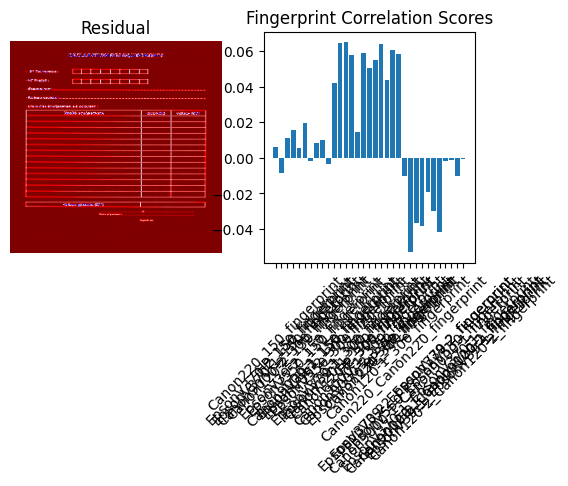

Image: Canon220_300_s3_1.tif
  Correlation with Canon220_150_fingerprint: 0.0100
  Correlation with EpsonV370-2_150_fingerprint: -0.0046
  Correlation with EpsonV370-1_150_fingerprint: 0.0085
  Correlation with Canon9000-2_300_fingerprint: 0.0131
  Correlation with Canon120-2_150_fingerprint: -0.0011
  Correlation with HP_150_fingerprint: 0.0194
  Correlation with EpsonV39-2_150_fingerprint: -0.0060
  Correlation with EpsonV550_150_fingerprint: 0.0033
  Correlation with Canon9000-1_150_fingerprint: 0.0043
  Correlation with EpsonV39-1_150_fingerprint: -0.0070
  Correlation with EpsonV39-2_300_fingerprint: 0.0425
  Correlation with EpsonV550_300_fingerprint: 0.0651
  Correlation with EpsonV370-1_300_fingerprint: 0.0659
  Correlation with EpsonV39-1_300_fingerprint: 0.0584
  Correlation with Canon120-1_150_fingerprint: 0.0109
  Correlation with Canon120-2_300_fingerprint: 0.0594
  Correlation with Canon9000-1_300_fingerprint: 0.0537
  Correlation with Canon9000-2_150_fingerprint: 0.0554


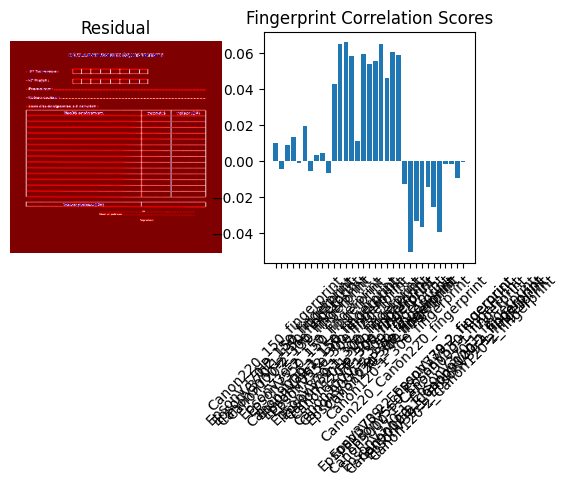

Image: Canon120-1_300_s1_2.tif
  Correlation with Canon220_150_fingerprint: 0.0096
  Correlation with EpsonV370-2_150_fingerprint: -0.0065
  Correlation with EpsonV370-1_150_fingerprint: -0.0210
  Correlation with Canon9000-2_300_fingerprint: -0.0045
  Correlation with Canon120-2_150_fingerprint: 0.0141
  Correlation with HP_150_fingerprint: -0.0089
  Correlation with EpsonV39-2_150_fingerprint: -0.0061
  Correlation with EpsonV550_150_fingerprint: -0.0164
  Correlation with Canon9000-1_150_fingerprint: 0.0182
  Correlation with EpsonV39-1_150_fingerprint: -0.0091
  Correlation with EpsonV39-2_300_fingerprint: 0.0665
  Correlation with EpsonV550_300_fingerprint: 0.0966
  Correlation with EpsonV370-1_300_fingerprint: 0.1015
  Correlation with EpsonV39-1_300_fingerprint: 0.0907
  Correlation with Canon120-1_150_fingerprint: 0.0072
  Correlation with Canon120-2_300_fingerprint: 0.0911
  Correlation with Canon9000-1_300_fingerprint: 0.0783
  Correlation with Canon9000-2_150_fingerprint: 0.

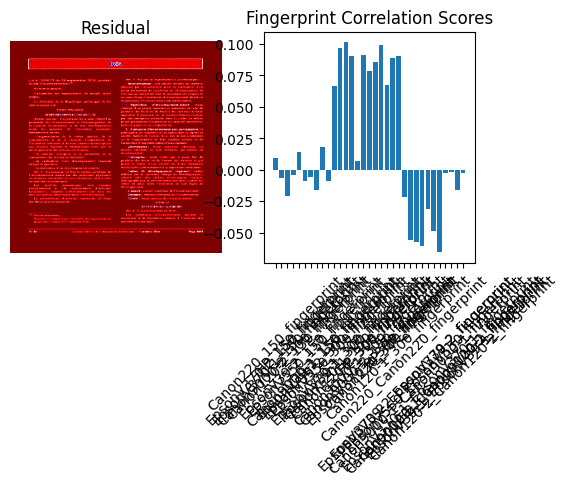


Analyzing dataset: Wikipedia
Image: EpsonV39-2_300_s9_1.tif
  Correlation with Canon220_150_fingerprint: 0.0360
  Correlation with EpsonV370-2_150_fingerprint: 0.1660
  Correlation with EpsonV370-1_150_fingerprint: 0.2366
  Correlation with Canon9000-2_300_fingerprint: 0.1516
  Correlation with Canon120-2_150_fingerprint: 0.0051
  Correlation with HP_150_fingerprint: -0.0159
  Correlation with EpsonV39-2_150_fingerprint: 0.3904
  Correlation with EpsonV550_150_fingerprint: 0.1764
  Correlation with Canon9000-1_150_fingerprint: 0.1002
  Correlation with EpsonV39-1_150_fingerprint: 0.2746
  Correlation with EpsonV39-2_300_fingerprint: 0.0386
  Correlation with EpsonV550_300_fingerprint: 0.0550
  Correlation with EpsonV370-1_300_fingerprint: 0.0574
  Correlation with EpsonV39-1_300_fingerprint: 0.0518
  Correlation with Canon120-1_150_fingerprint: 0.0145
  Correlation with Canon120-2_300_fingerprint: 0.0518
  Correlation with Canon9000-1_300_fingerprint: 0.0448
  Correlation with Canon90

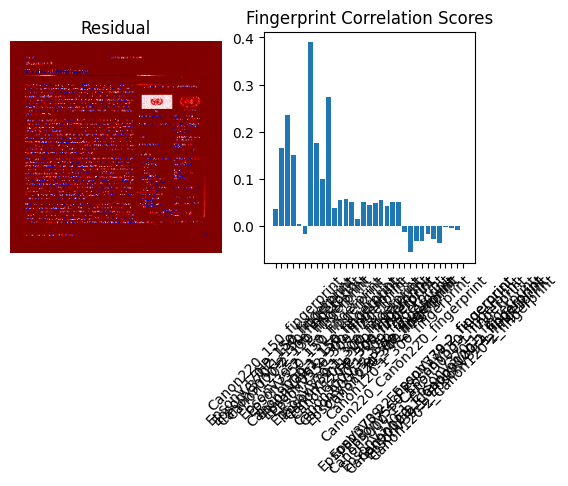

Image: EpsonV39-2_300_s9_2.tif
  Correlation with Canon220_150_fingerprint: 0.0049
  Correlation with EpsonV370-2_150_fingerprint: 0.1217
  Correlation with EpsonV370-1_150_fingerprint: 0.1429
  Correlation with Canon9000-2_300_fingerprint: 0.0845
  Correlation with Canon120-2_150_fingerprint: 0.0154
  Correlation with HP_150_fingerprint: -0.0188
  Correlation with EpsonV39-2_150_fingerprint: 0.2755
  Correlation with EpsonV550_150_fingerprint: 0.1989
  Correlation with Canon9000-1_150_fingerprint: 0.0869
  Correlation with EpsonV39-1_150_fingerprint: 0.2514
  Correlation with EpsonV39-2_300_fingerprint: 0.0338
  Correlation with EpsonV550_300_fingerprint: 0.0479
  Correlation with EpsonV370-1_300_fingerprint: 0.0494
  Correlation with EpsonV39-1_300_fingerprint: 0.0443
  Correlation with Canon120-1_150_fingerprint: 0.0040
  Correlation with Canon120-2_300_fingerprint: 0.0446
  Correlation with Canon9000-1_300_fingerprint: 0.0381
  Correlation with Canon9000-2_150_fingerprint: 0.0421
 

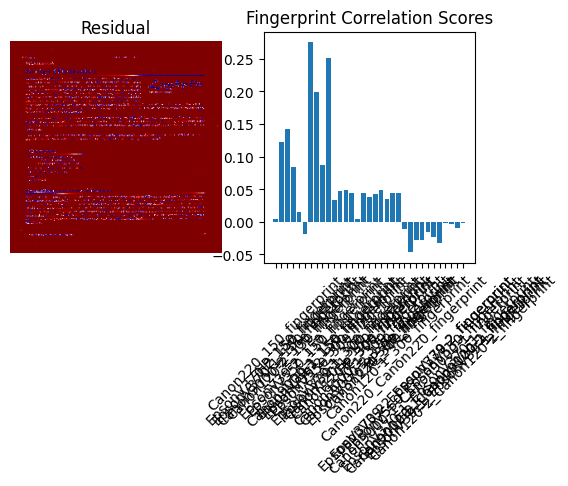

Image: EpsonV39-2_300_s9_3.tif
  Correlation with Canon220_150_fingerprint: 0.0079
  Correlation with EpsonV370-2_150_fingerprint: 0.1734
  Correlation with EpsonV370-1_150_fingerprint: 0.1251
  Correlation with Canon9000-2_300_fingerprint: 0.1299
  Correlation with Canon120-2_150_fingerprint: 0.0068
  Correlation with HP_150_fingerprint: -0.0633
  Correlation with EpsonV39-2_150_fingerprint: 0.3218
  Correlation with EpsonV550_150_fingerprint: 0.2116
  Correlation with Canon9000-1_150_fingerprint: 0.0562
  Correlation with EpsonV39-1_150_fingerprint: 0.3027
  Correlation with EpsonV39-2_300_fingerprint: 0.0365
  Correlation with EpsonV550_300_fingerprint: 0.0515
  Correlation with EpsonV370-1_300_fingerprint: 0.0538
  Correlation with EpsonV39-1_300_fingerprint: 0.0485
  Correlation with Canon120-1_150_fingerprint: -0.0457
  Correlation with Canon120-2_300_fingerprint: 0.0485
  Correlation with Canon9000-1_300_fingerprint: 0.0416
  Correlation with Canon9000-2_150_fingerprint: 0.0457


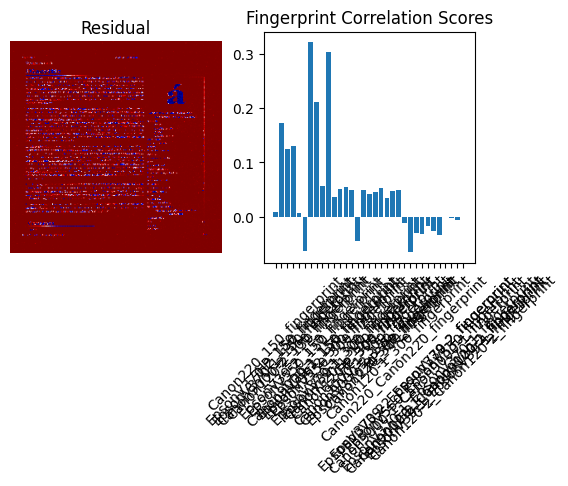

Image: EpsonV39-2_300_s9_4.tif
  Correlation with Canon220_150_fingerprint: -0.0004
  Correlation with EpsonV370-2_150_fingerprint: 0.1433
  Correlation with EpsonV370-1_150_fingerprint: 0.1584
  Correlation with Canon9000-2_300_fingerprint: 0.0827
  Correlation with Canon120-2_150_fingerprint: -0.0256
  Correlation with HP_150_fingerprint: 0.0245
  Correlation with EpsonV39-2_150_fingerprint: 0.3161
  Correlation with EpsonV550_150_fingerprint: 0.1255
  Correlation with Canon9000-1_150_fingerprint: 0.0407
  Correlation with EpsonV39-1_150_fingerprint: 0.1465
  Correlation with EpsonV39-2_300_fingerprint: 0.0485
  Correlation with EpsonV550_300_fingerprint: 0.0681
  Correlation with EpsonV370-1_300_fingerprint: 0.0707
  Correlation with EpsonV39-1_300_fingerprint: 0.0635
  Correlation with Canon120-1_150_fingerprint: -0.0186
  Correlation with Canon120-2_300_fingerprint: 0.0637
  Correlation with Canon9000-1_300_fingerprint: 0.0544
  Correlation with Canon9000-2_150_fingerprint: 0.0601

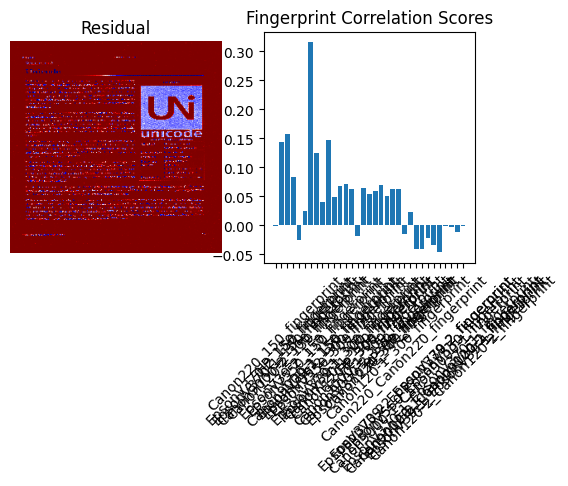

Image: EpsonV39-2_300_s9_5.tif
  Correlation with Canon220_150_fingerprint: 0.0074
  Correlation with EpsonV370-2_150_fingerprint: 0.1497
  Correlation with EpsonV370-1_150_fingerprint: 0.1183
  Correlation with Canon9000-2_300_fingerprint: 0.1087
  Correlation with Canon120-2_150_fingerprint: 0.0067
  Correlation with HP_150_fingerprint: -0.0118
  Correlation with EpsonV39-2_150_fingerprint: 0.3058
  Correlation with EpsonV550_150_fingerprint: 0.1525
  Correlation with Canon9000-1_150_fingerprint: 0.0358
  Correlation with EpsonV39-1_150_fingerprint: 0.1365
  Correlation with EpsonV39-2_300_fingerprint: 0.0549
  Correlation with EpsonV550_300_fingerprint: 0.0805
  Correlation with EpsonV370-1_300_fingerprint: 0.0822
  Correlation with EpsonV39-1_300_fingerprint: 0.0735
  Correlation with Canon120-1_150_fingerprint: -0.0274
  Correlation with Canon120-2_300_fingerprint: 0.0739
  Correlation with Canon9000-1_300_fingerprint: 0.0628
  Correlation with Canon9000-2_150_fingerprint: 0.0696


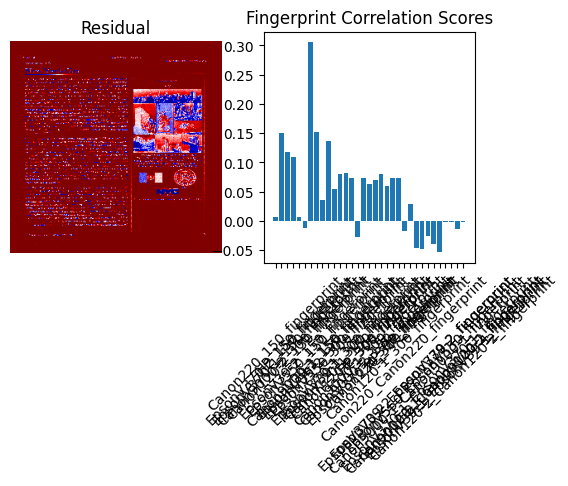

In [ ]:
import cv2
import numpy as np
from pathlib import Path
from skimage.restoration import denoise_wavelet
import matplotlib.pyplot as plt

# --- Parameters ---
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
datasets = {
    "Official": Path("/content/drive/MyDrive/dataset/Official_Preprocessed"),
    "Wikipedia": Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed")
}

def extract_residual(img):
    denoised = denoise_wavelet(img)
    residual = img - denoised
    return residual

def normalized_correlation(residual, fingerprint):
    # Flatten and normalize
    r = residual.flatten()
    f = fingerprint.flatten()
    r = (r - np.mean(r)) / (np.std(r) + 1e-8)
    f = (f - np.mean(f)) / (np.std(f) + 1e-8)
    return np.mean(r * f)

# --- Load fingerprints ---
fingerprints = {}
for fp_file in fingerprint_root.glob("*.npy"):
    fingerprints[fp_file.stem] = np.load(fp_file)

print("Loaded fingerprints:", list(fingerprints.keys()))

# --- Correlation analysis ---
for dataset_name, dataset_path in datasets.items():
    print(f"\nAnalyzing dataset: {dataset_name}")
    sample_files = list(dataset_path.rglob("*.tif"))[:5]  # first 5 samples
    for file_path in sample_files:
        img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        residual = extract_residual(img)

        scores = {}
        for fp_name, fp in fingerprints.items():
            scores[fp_name] = normalized_correlation(residual, fp)

        # Show results
        print(f"Image: {file_path.name}")
        for fp_name, score in scores.items():
            print(f"  Correlation with {fp_name}: {score:.4f}")

        # Optional visualization
        plt.figure(figsize=(6,3))
        plt.subplot(1,2,1); plt.imshow(residual, cmap='seismic'); plt.title("Residual"); plt.axis("off")
        plt.subplot(1,2,2); plt.bar(range(len(scores)), list(scores.values()), tick_label=list(scores.keys()))
        plt.title("Fingerprint Correlation Scores")
        plt.xticks(rotation=45)
        plt.show()

Loaded fingerprints: ['HP_HP_fingerprint', 'EpsonV550_EpsonV550_fingerprint', 'Canon220_Canon220_fingerprint', 'EpsonV370-1_EpsonV370-1_fingerprint', 'Canon9000-2_Canon9000-2_fingerprint', 'Canon120-1_Canon120-1_fingerprint', 'Canon9000-1_Canon9000-1_fingerprint', 'EpsonV370-2_EpsonV370-2_fingerprint', 'EpsonV39-2_EpsonV39-2_fingerprint', 'EpsonV39-1_EpsonV39-1_fingerprint', 'Canon120-2_Canon120-2_fingerprint', 'HP_300_fingerprint', 'Canon120-1_150_fingerprint', 'Canon120-1_300_fingerprint', 'EpsonV39-1_150_fingerprint', 'EpsonV39-1_300_fingerprint', 'Canon120-2_150_fingerprint', 'Canon120-2_300_fingerprint', 'Canon220_150_fingerprint', 'Canon220_300_fingerprint', 'HP_150_fingerprint', 'EpsonV370-2_150_fingerprint', 'EpsonV370-2_300_fingerprint', 'EpsonV39-2_150_fingerprint', 'EpsonV39-2_300_fingerprint', 'Canon9000-1_150_fingerprint', 'Canon9000-1_300_fingerprint', 'EpsonV550_150_fingerprint', 'EpsonV550_300_fingerprint', 'EpsonV370-1_150_fingerprint', 'EpsonV370-1_300_fingerprint', '

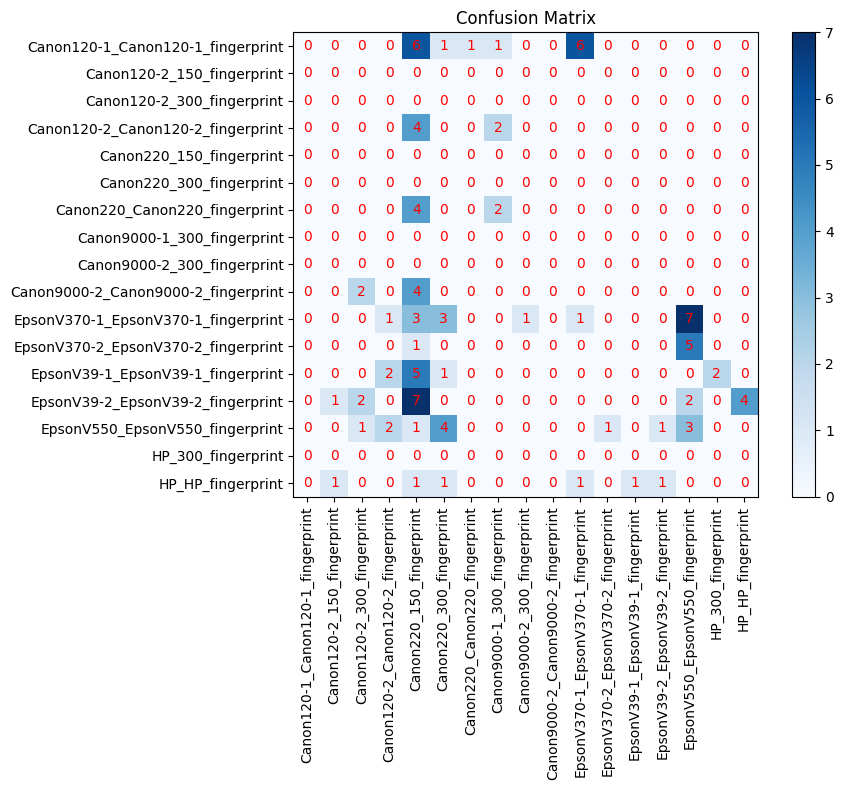


Per-dataset accuracy:
Official: 0.020
Wikipedia: 0.060


In [ ]:
import cv2
import numpy as np
from pathlib import Path
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt
from collections import defaultdict
import re

# --- Parameters ---
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
datasets = {
    "Official": Path("/content/drive/MyDrive/dataset/Official_Preprocessed"),
    "Wikipedia": Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed"),
}

# --- Helper Functions ---
def extract_residual(img):
    # Try Gaussian blur instead of wavelet for stronger residuals
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

def patch_corr(residual, fingerprint, patch_size=64):
    h, w = residual.shape
    scores = []
    # Ensure fingerprint is resized to match residual shape for patch processing
    # if it's not already the same or larger than expected patches
    # For this implementation, we assume residual and fingerprint patches are of similar scale
    for i in range(0, h - patch_size + 1, patch_size // 2): # Overlapping patches
        for j in range(0, w - patch_size + 1, patch_size // 2): # Overlapping patches
            patch = residual[i:i+patch_size, j:j+patch_size]
            # Resize fingerprint to patch_size for local comparison
            fp_patch = cv2.resize(fingerprint, (patch_size, patch_size))

            # Ensure patch and fp_patch are not flat (all same value)
            if np.std(patch) == 0 or np.std(fp_patch) == 0:
                continue

            r = (patch.flatten() - np.mean(patch)) / (np.std(patch) + 1e-8)
            f = (fp_patch.flatten() - np.mean(fp_patch)) / (np.std(fp_patch) + 1e-8)
            scores.append(np.mean(r * f))
    if scores:
        return np.mean(scores)
    else:
        return -1.0 # Return a low score if no valid patches for correlation

# --- Load fingerprints ---
fingerprints = {}
for fp_file in fingerprint_root.glob("*.npy"):
    fingerprints[fp_file.stem] = np.load(fp_file)

print("Loaded fingerprints:", list(fingerprints.keys()))

# --- Scanner Identification ---
y_true, y_pred = [], []
dataset_acc = defaultdict(list)

for dataset_name, dataset_path in datasets.items():
    print(f"\nAnalyzing dataset: {dataset_name}")
    # use more samples for stability, and also ensuring images are preprocessed and resized
    sample_files = list(dataset_path.rglob("*.tif"))[:50]
    for file_path in sample_files:
        img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
        if img is None: continue
        residual = extract_residual(img)

        # Correlate with fingerprints using patch_corr
        scores = {fp_name: patch_corr(residual, fp) for fp_name, fp in fingerprints.items()}
        predicted_scanner = max(scores, key=scores.get)

        # --- Extract true scanner from filename prefix ---
        fname = file_path.name
        match = re.match(r"([A-Za-z0-9\-]+)_", fname)
        true_scanner = match.group(1) if match else "Unknown"

        # Align with fingerprint naming convention
        # Example: Canon220 \u2192 Canon220_Canon220_fingerprint (if fingerprint was generated without DPI suffix)
        # Or Canon120-1_150_fingerprint (if with DPI suffix)
        # We need to find the best matching true label
        true_scanner_label = "Unknown"
        for fp_key in fingerprints.keys():
            if fp_key.startswith(true_scanner):
                if f"_{true_scanner}_fingerprint" in fp_key: # Older format like Canon120-1_Canon120-1_fingerprint
                    true_scanner_label = fp_key
                    break
                elif f"_{true_scanner}_{re.search(r'(\d+)', fname).group(1) if re.search(r'(\d+)', fname) else 'N/A'}_fingerprint" in fp_key: # Format like Canon120-1_150_fingerprint
                    true_scanner_label = fp_key
                    break

        # Fallback if specific DPI match not found but scanner name matches
        if true_scanner_label == "Unknown" and true_scanner != "Unknown":
             possible_labels = [fp_k for fp_k in fingerprints.keys() if fp_k.startswith(true_scanner)]
             if possible_labels:
                 # Pick one, ideally the best correlated or a representative one. For now, just the first.
                 true_scanner_label = possible_labels[0]

        y_true.append(true_scanner_label)
        y_pred.append(predicted_scanner)
        dataset_acc[dataset_name].append(true_scanner_label == predicted_scanner)

        print(f"Image: {fname} | True: {true_scanner_label} | Predicted: {predicted_scanner}")

# --- Evaluation ---
labels = sorted(set(y_true) | set(y_pred))
cm = confusion_matrix(y_true, y_pred, labels=labels)
acc = accuracy_score(y_true, y_pred)

print("\nConfusion Matrix:")
print(cm)
print("\nOverall Accuracy:", acc)
print("\nClassification Report:")
print(classification_report(y_true, y_pred, labels=labels, zero_division=0))

# --- Visualize Confusion Matrix ---
plt.figure(figsize=(10,8))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.xticks(range(len(labels)), labels, rotation=90)
plt.yticks(range(len(labels)), labels)
plt.colorbar()
for i in range(len(labels)):
    for j in range(len(labels)):
        plt.text(j, i, cm[i,j], ha="center", va="center", color="red")
plt.tight_layout()
plt.show()

# --- Per-dataset accuracy breakdown ---
print("\nPer-dataset accuracy:")
for dataset_name, results in dataset_acc.items():
    print(f"{dataset_name}: {np.mean(results):.3f}")


In [ ]:
import cv2
import numpy as np
from pathlib import Path
from skimage.restoration import denoise_wavelet

# --- Parameters ---
flatfield_root = Path("/content/drive/MyDrive/dataset/Flatfield")  # adjust to your flatfield folder
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
fingerprint_root.mkdir(exist_ok=True)

def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0)  # Gaussian blur residual
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Generate fingerprints ---
for scanner_dir in flatfield_root.iterdir():
    if not scanner_dir.is_dir():
        continue
    scanner_name = scanner_dir.name
    for dpi_dir in scanner_dir.iterdir():
        if not dpi_dir.is_dir():
            continue
        dpi_name = dpi_dir.name
        residuals = []
        for img_file in dpi_dir.glob("*.tif"):
            img = cv2.imread(str(img_file), cv2.IMREAD_GRAYSCALE)
            if img is None: continue
            residuals.append(extract_residual(img))
        if residuals:
            fingerprint = np.mean(residuals, axis=0)
            fp_name = f"{scanner_name}_{dpi_name}_fingerprint.npy"
            np.save(fingerprint_root / fp_name, fingerprint)
            print(f"Saved fingerprint: {fp_name}")


Loading dataset: Official
Loading dataset: Wikipedia
Combined dataset size: (260, 4096) Labels: 22

Overall Accuracy: 0.7948717948717948

Classification Report:
                       precision    recall  f1-score   support

  Official_Canon120-1       1.00      0.60      0.75         5
  Official_Canon120-2       0.67      1.00      0.80         4
    Official_Canon220       0.83      1.00      0.91         5
 Official_Canon9000-1       0.00      0.00      0.00         2
 Official_Canon9000-2       0.50      1.00      0.67         5
 Official_EpsonV370-1       1.00      1.00      1.00         5
 Official_EpsonV370-2       1.00      1.00      1.00         4
  Official_EpsonV39-1       1.00      1.00      1.00         2
  Official_EpsonV39-2       1.00      0.80      0.89         5
   Official_EpsonV550       0.50      1.00      0.67         3
          Official_HP       0.83      1.00      0.91         5
 Wikipedia_Canon120-1       1.00      1.00      1.00         3
 Wikipedia_Canon120

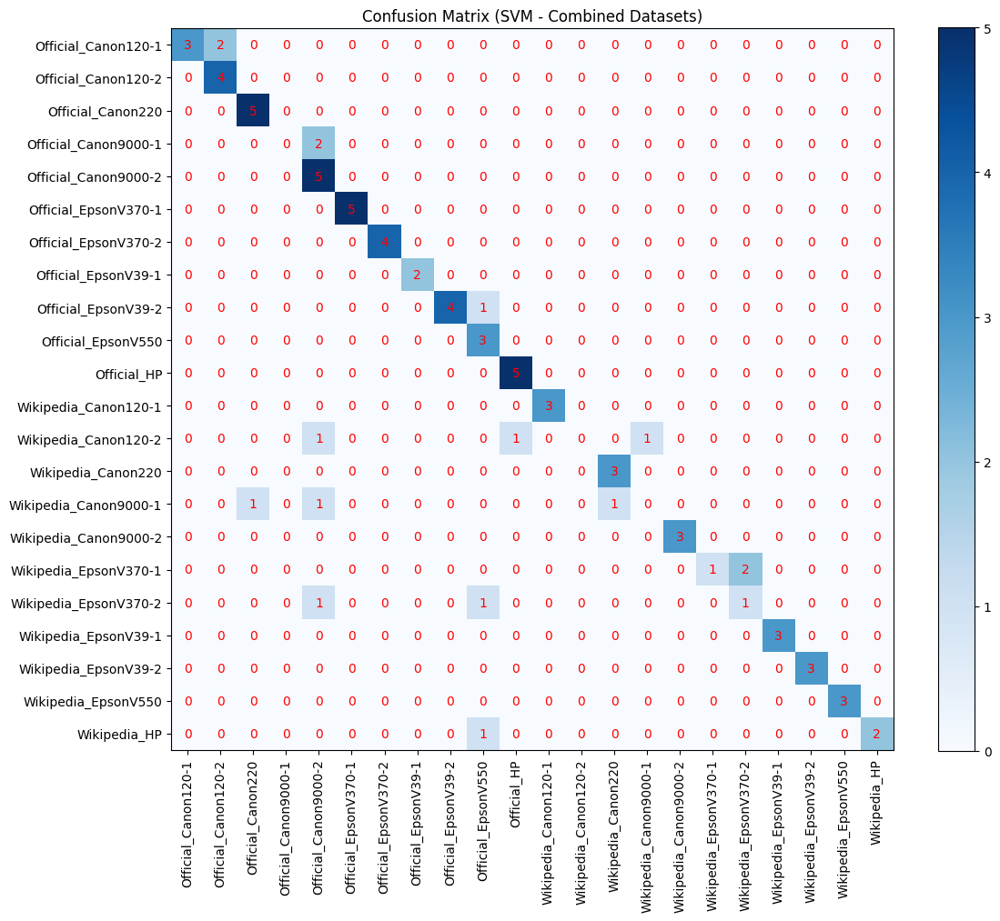

In [ ]:
import cv2
import numpy as np
from pathlib import Path
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import re

# --- Parameters ---
datasets = {
    "Official": Path("/content/drive/MyDrive/dataset/Official_Preprocessed"),
    "Wikipedia": Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed"),
}

# --- Residual Extraction ---
def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Feature Extraction ---
def residual_features(img):
    residual = extract_residual(img)
    # Downsample residual to reduce dimensionality
    resized = cv2.resize(residual, (64,64))
    return resized.flatten()

# --- Build Combined Dataset ---
X, y = [], []
for dataset_name, dataset_path in datasets.items():
    print(f"Loading dataset: {dataset_name}")
    sample_files = list(dataset_path.rglob("*.tif"))[:150]  # use more samples
    for file_path in sample_files:
        img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
        if img is None: continue
        features = residual_features(img)

        # Extract scanner label from filename
        fname = file_path.name
        match = re.match(r"([A-Za-z0-9\-]+)_", fname)
        true_scanner = match.group(1) if match else "Unknown"

        # Add dataset prefix to avoid label collision
        label = f"{dataset_name}_{true_scanner}"

        X.append(features)
        y.append(label)

X = np.array(X)
y = np.array(y)

print("Combined dataset size:", X.shape, "Labels:", len(set(y)))

# --- Train/Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)

# --- Train SVM Classifier ---
clf = SVC(kernel="linear", probability=True)
clf.fit(X_train, y_train)

# --- Evaluate ---
y_pred = clf.predict(X_test)
acc = accuracy_score(y_test, y_pred)
cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)

print("\nOverall Accuracy:", acc)
print("\nClassification Report:")
print(classification_report(y_test, y_pred, labels=clf.classes_, zero_division=0))

# --- Visualize Confusion Matrix ---
plt.figure(figsize=(12,10))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix (SVM - Combined Datasets)")
plt.xticks(range(len(clf.classes_)), clf.classes_, rotation=90)
plt.yticks(range(len(clf.classes_)), clf.classes_)
plt.colorbar()
for i in range(len(clf.classes_)):
    for j in range(len(clf.classes_)):
        plt.text(j, i, cm[i,j], ha="center", va="center", color="red")
plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
from pathlib import Path
import re

# --- Parameters ---
datasets = {
    "Official": Path("/content/drive/MyDrive/dataset/Official_Preprocessed"),
    "Wikipedia": Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed"),
}

# --- Residual Extraction ---
def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Custom Dataset ---
class ScannerDataset(Dataset):
    def __init__(self, datasets, img_size=64):
        self.data, self.labels = [], []
        self.label_map = {}
        label_id = 0
        print("Initializing ScannerDataset...")
        for dataset_name, dataset_path in datasets.items():
            print(f"  Loading files from {dataset_path} for {dataset_name}...")
            files = list(dataset_path.rglob("*.tif"))[:150] # Limiting to 150 files per dataset to ensure data is loaded
            if not files:
                print(f"    Warning: No .tif files found in {dataset_path} for {dataset_name}. Skipping.")
                continue

            for file_path in files:
                img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
                if img is None:
                    # print(f"Warning: Could not read image {file_path}. Skipping.")
                    continue
                residual = extract_residual(img)
                # Ensure residual image is of the correct size (64x64)
                # This is already handled by preprocessing, but adding a check/resize here for robustness
                if residual.shape[0] != img_size or residual.shape[1] != img_size:
                    resized_residual = cv2.resize(residual, (img_size, img_size), interpolation=cv2.INTER_AREA)
                else:
                    resized_residual = residual

                self.data.append(resized_residual[np.newaxis, :, :])  # add channel dimension

                fname = file_path.name
                match = re.match(r"([A-Za-z0-9\-]+)_", fname)
                true_scanner = match.group(1) if match else "Unknown"
                label = f"{dataset_name}_{true_scanner}"
                if label not in self.label_map:
                    self.label_map[label] = label_id
                    label_id += 1
                self.labels.append(self.label_map[label])
        if not self.data:
            print("  Error: Dataset is empty after loading. Check paths and file readability.")
        else:
            self.data = torch.tensor(np.array(self.data), dtype=torch.float32)
            self.labels = torch.tensor(np.array(self.labels), dtype=torch.long)
        print(f"Dataset initialized with {len(self.data)} samples and {len(self.label_map)} unique labels.")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

# --- Data Preparation ---
print("Creating ScannerDataset instance...")
dataset = ScannerDataset(datasets)

# Split the dataset into training and testing sets (70/30 split)
train_size = int(0.7 * len(dataset))
test_size = len(dataset) - train_size
print(f"Splitting dataset: Train size = {train_size}, Test size = {test_size}")
train_set, test_set = torch.utils.data.random_split(dataset, [train_size, test_size])

# Create DataLoader instances
batch_size = 16
print(f"Creating DataLoader instances with batch size = {batch_size}...")
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

print("Data preparation complete. `train_loader` and `test_loader` are ready.")


Creating ScannerDataset instance...
Initializing ScannerDataset...
  Loading files from /content/drive/MyDrive/dataset/Official_Preprocessed for Official...
  Loading files from /content/drive/MyDrive/dataset/Wikipedia_Preprocessed for Wikipedia...
  Error: Dataset is empty after loading. Check paths and file readability.
Dataset initialized with 0 samples and 0 unique labels.
Splitting dataset: Train size = 0, Test size = 0
Creating DataLoader instances with batch size = 16...


ValueError: num_samples should be a positive integer value, but got num_samples=0

In [ ]:
class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(128*8*8, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128*8*8)
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x


Loading dataset: Official
Loading dataset: Wikipedia
Combined dataset size: (260, 4096) Labels: 22

--- SVM Results ---
Accuracy: 0.7948717948717948
Classification Report:
                        precision    recall  f1-score   support

  Official_Canon120-1       1.00      0.60      0.75         5
  Official_Canon120-2       0.67      1.00      0.80         4
    Official_Canon220       0.83      1.00      0.91         5
 Official_Canon9000-1       0.00      0.00      0.00         2
 Official_Canon9000-2       0.50      1.00      0.67         5
 Official_EpsonV370-1       1.00      1.00      1.00         5
 Official_EpsonV370-2       1.00      1.00      1.00         4
  Official_EpsonV39-1       1.00      1.00      1.00         2
  Official_EpsonV39-2       1.00      0.80      0.89         5
   Official_EpsonV550       0.50      1.00      0.67         3
          Official_HP       0.83      1.00      0.91         5
 Wikipedia_Canon120-1       1.00      1.00      1.00         3
 Wikipe

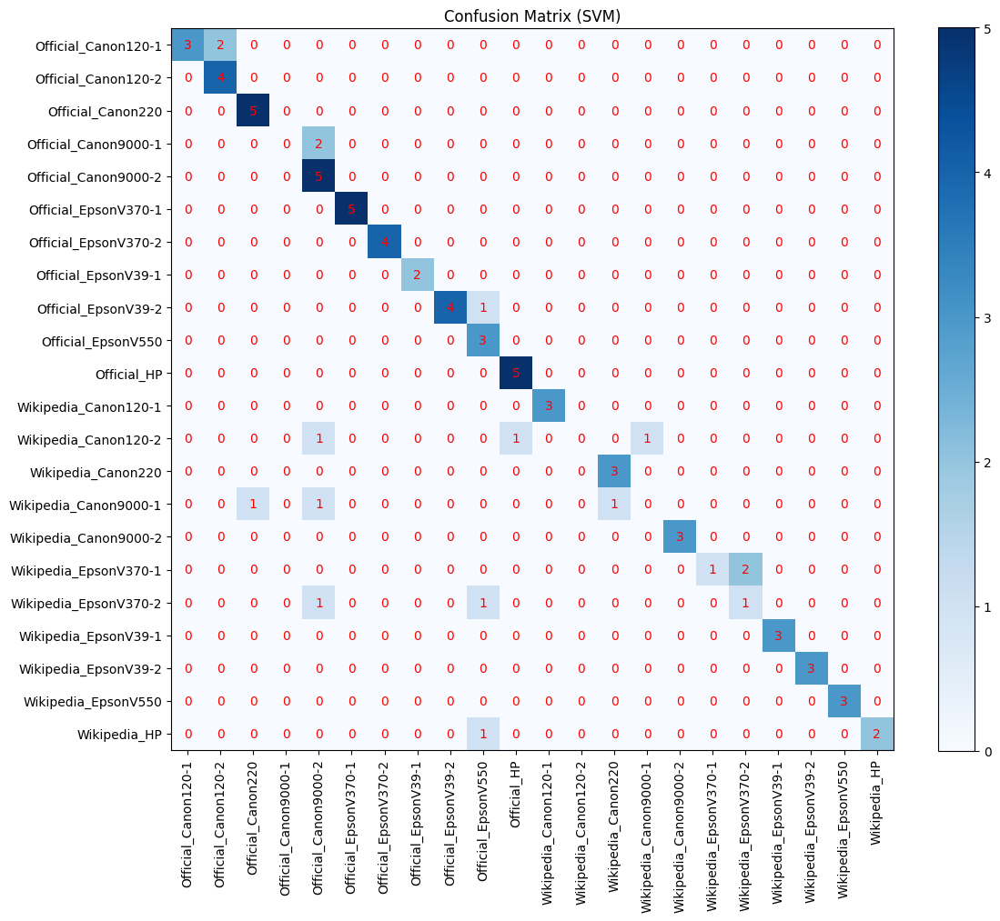

Epoch 1, Loss: 4.9946
Epoch 2, Loss: 3.2171
Epoch 3, Loss: 2.8398
Epoch 4, Loss: 2.7574
Epoch 5, Loss: 2.7579
Epoch 6, Loss: 2.6365
Epoch 7, Loss: 2.4687
Epoch 8, Loss: 2.5559
Epoch 9, Loss: 2.3599
Epoch 10, Loss: 2.3374
Epoch 11, Loss: 2.3418
Epoch 12, Loss: 2.1946
Epoch 13, Loss: 2.1261
Epoch 14, Loss: 2.0256
Epoch 15, Loss: 1.9961
Epoch 16, Loss: 1.9782
Epoch 17, Loss: 1.9558
Epoch 18, Loss: 1.7399
Epoch 19, Loss: 1.8113
Epoch 20, Loss: 1.7439

--- CNN Results ---
Test Accuracy: 0.205


In [ ]:
import cv2
import numpy as np
from pathlib import Path
import re
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# --- Parameters ---
datasets = {
    "Official": Path("/content/drive/MyDrive/dataset/Official_Preprocessed"),
    "Wikipedia": Path("/content/drive/MyDrive/dataset/Wikipedia_Preprocessed"),
}

# --- Residual Extraction ---
def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Feature Extraction for SVM ---
def residual_features(img):
    residual = extract_residual(img)
    resized = cv2.resize(residual, (64,64))
    return resized.flatten()

# --- Build Combined Dataset ---
X, y = [], []
for dataset_name, dataset_path in datasets.items():
    print(f"Loading dataset: {dataset_name}")
    sample_files = list(dataset_path.rglob("*.tif"))[:150]
    for file_path in sample_files:
        img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
        if img is None: continue
        features = residual_features(img)

        fname = file_path.name
        match = re.match(r"([A-Za-z0-9\-]+)_", fname)
        true_scanner = match.group(1) if match else "Unknown"
        label = f"{dataset_name}_{true_scanner}"

        X.append(features)
        y.append(label)

X = np.array(X)
y = np.array(y)

print("Combined dataset size:", X.shape, "Labels:", len(set(y)))

# --- Train/Test Split ---
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)

# --- SVM Classifier ---
clf = SVC(kernel="linear", probability=True)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

print("\n--- SVM Results ---")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred, labels=clf.classes_, zero_division=0))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
plt.figure(figsize=(12,10))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix (SVM)")
plt.xticks(range(len(clf.classes_)), clf.classes_, rotation=90)
plt.yticks(range(len(clf.classes_)), clf.classes_)
plt.colorbar()
for i in range(len(clf.classes_)):
    for j in range(len(clf.classes_)):
        plt.text(j, i, cm[i,j], ha="center", va="center", color="red")
plt.tight_layout()
plt.show()

# --- CNN Dataset ---
class ScannerDataset(Dataset):
    def __init__(self, datasets, img_size=64):
        self.data, self.labels = [], []
        self.label_map = {}
        label_id = 0
        for dataset_name, dataset_path in datasets.items():
            files = list(dataset_path.rglob("*.tif"))[:150]
            for file_path in files:
                img = cv2.imread(str(file_path), cv2.IMREAD_GRAYSCALE)
                if img is None: continue
                residual = extract_residual(img)
                resized = cv2.resize(residual, (img_size, img_size))
                self.data.append(resized[np.newaxis, :, :])  # add channel dimension

                fname = file_path.name
                match = re.match(r"([A-Za-z0-9\-]+)_", fname)
                true_scanner = match.group(1) if match else "Unknown"
                label = f"{dataset_name}_{true_scanner}"
                if label not in self.label_map:
                    self.label_map[label] = label_id
                    label_id += 1
                self.labels.append(self.label_map[label])
        self.data = torch.tensor(np.array(self.data), dtype=torch.float32)
        self.labels = torch.tensor(np.array(self.labels), dtype=torch.long)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

# --- Deep CNN Model ---
class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)
        self.fc1 = nn.Linear(128*8*8, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128*8*8)
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

# --- Train CNN ---
dataset = ScannerDataset(datasets)
train_size = int(0.7 * len(dataset))
test_size = len(dataset) - train_size
train_set, test_set = torch.utils.data.random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_set, batch_size=16, shuffle=True)
test_loader = DataLoader(test_set, batch_size=16, shuffle=False)

model = DeepScannerCNN(num_classes=len(dataset.label_map))
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(20):  # train longer
    model.train()
    running_loss = 0.0
    for data, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(data)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader):.4f}")

# --- Evaluate CNN ---
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for data, labels in test_loader:
        outputs = model(data)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print("\n--- CNN Results ---")
print(f"Test Accuracy: {correct/total:.3f}")


**MILESTONE 2**

In [ ]:
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

# --- Paths ---
flatfield_root = Path("/content/drive/MyDrive/dataset/Flatfield") # adjust to your flatfield folder
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
fingerprint_root.mkdir(parents=True, exist_ok=True)

# --- Residual Extraction ---
def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0) # Gaussian blur removes content
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Generate fingerprints ---
limit_fingerprints = 3 # Set a limit for demonstration
fingerprint_count = 0

for scanner_dir in flatfield_root.iterdir():
    if not scanner_dir.is_dir():
        continue
    scanner_name = scanner_dir.name
    for dpi_dir in scanner_dir.iterdir():
        if not dpi_dir.is_dir():
            continue
        dpi_name = dpi_dir.name
        residuals = []
        for img_file in dpi_dir.glob("*.tif"):
            img = cv2.imread(str(img_file), cv2.IMREAD_GRAYSCALE)
            if img is None: continue
            residuals.append(extract_residual(img))
        if residuals:
            fingerprint = np.mean(residuals, axis=0) # average residuals
            fp_name = f"{scanner_name}_{dpi_name}_fingerprint.npy"
            np.save(fingerprint_root / fp_name, fingerprint)
            print(f"Saved fingerprint: {fp_name}")

            # Optional: visualize fingerprint
            fp_vis = (fingerprint - fingerprint.min()) / (fingerprint.max() - fingerprint.min()) * 255
            fp_vis = fp_vis.astype(np.uint8)
            plt.figure(figsize=(6,6))
            plt.imshow(fp_vis, cmap="gray")
            plt.title(f"Fingerprint: {scanner_name}_{dpi_name}")
            plt.axis("off")
            plt.show()

            fingerprint_count += 1
            if fingerprint_count >= limit_fingerprints:
                break # Exit dpi_dir loop
    if fingerprint_count >= limit_fingerprints:
        break # Exit scanner_dir loop

--- Mean Residuals Across Fingerprints ---


,Fingerprint,Scanner,Resolution,Mean Residual
14,Canon120-1_150_fingerprint,Canon120-1,150,0.198697
21,Canon120-1_300_fingerprint,Canon120-1,300,0.071867
30,Canon120-1_Canon120-1_fingerprint,Canon120-1_Canon120-1_fingerprint,N/A,253.999392
4,Canon120-2_150_fingerprint,Canon120-2,150,0.210454
15,Canon120-2_300_fingerprint,Canon120-2,300,0.071792
32,Canon120-2_Canon120-2_fingerprint,Canon120-2_Canon120-2_fingerprint,N/A,253.996269
0,Canon220_150_fingerprint,Canon220,150,0.199057
20,Canon220_300_fingerprint,Canon220,300,0.081640
22,Canon220_Canon220_fingerprint,Canon220_Canon220_fingerprint,N/A,253.819130
8,Canon9000-1_150_fingerprint,Canon9000-1,150,0.196289


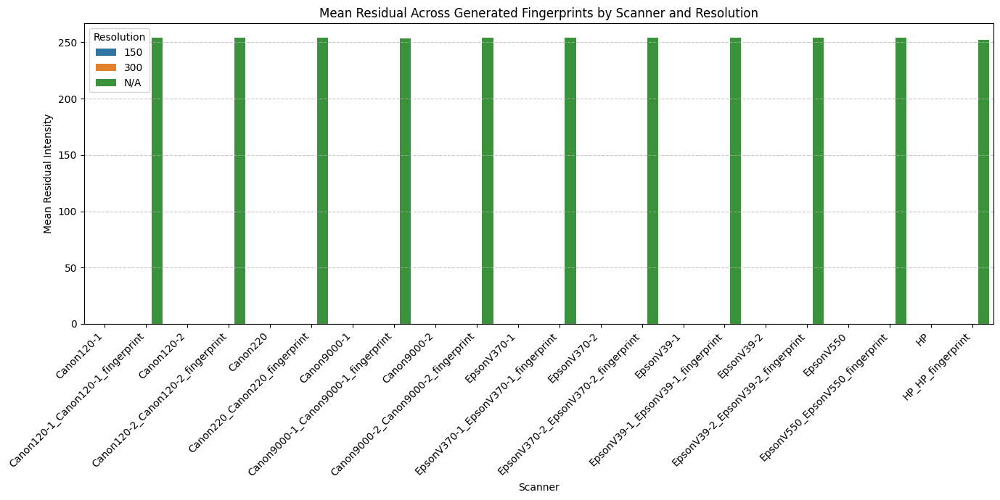

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import re
import seaborn as sns # Added this line

fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")

# --- Load fingerprints and compute mean residuals ---
mean_residuals_data = []

for fp_file in fingerprint_root.glob("*.npy"):
    fingerprint = np.load(fp_file)
    mean_residual = np.mean(fingerprint)

    # Extract scanner and resolution from filename
    file_name = fp_file.stem  # e.g., 'Canon120-1_150_fingerprint'
    match = re.match(r"([A-Za-z0-9\-]+)_(\d+)_fingerprint", file_name)
    if match:
        scanner_name = match.group(1)
        resolution = int(match.group(2))
    else:
        # Handle cases where naming convention might be different (e.g., old ones)
        match_simple = re.match(r"([A-Za-z0-9\-]+)_fingerprint", file_name)
        if match_simple:
            scanner_name = match_simple.group(1)
            resolution = "N/A"
        else:
            scanner_name = file_name
            resolution = "N/A"

    mean_residuals_data.append({
        "Fingerprint": fp_file.stem,
        "Scanner": scanner_name,
        "Resolution": resolution,
        "Mean Residual": mean_residual
    })

df_mean_residuals = pd.DataFrame(mean_residuals_data)

# Sort for better visualization
df_mean_residuals = df_mean_residuals.sort_values(by=["Scanner", "Resolution"])

print("--- Mean Residuals Across Fingerprints ---")
display(df_mean_residuals)

# --- Visualize Mean Residuals ---
plt.figure(figsize=(14, 7))
# Use hue for resolution if available, otherwise just use scanner
if "Resolution" in df_mean_residuals.columns and df_mean_residuals["Resolution"].nunique() > 1:
    sns.barplot(x="Scanner", y="Mean Residual", hue="Resolution", data=df_mean_residuals)
    plt.title("Mean Residual Across Generated Fingerprints by Scanner and Resolution")
else:
    sns.barplot(x="Scanner", y="Mean Residual", data=df_mean_residuals)
    plt.title("Mean Residual Across Generated Fingerprints by Scanner")

plt.xlabel("Scanner")
plt.ylabel("Mean Residual Intensity")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

In [ ]:
# Filter for 'N/A' resolution fingerprints
df_na_resolution = df_mean_residuals[df_mean_residuals['Resolution'] == 'N/A']

print("--- Statistical Summary for 'N/A' Resolution Fingerprints ---")
display(df_na_resolution['Mean Residual'].describe())

print("\n--- 'N/A' Resolution Fingerprints Details ---")
display(df_na_resolution)


--- Statistical Summary for 'N/A' Resolution Fingerprints ---


,Mean Residual
count,11.000000
mean,253.676325
std,0.592928
min,252.036691
25%,253.809183
50%,253.883349
75%,253.996899
max,253.999392



--- 'N/A' Resolution Fingerprints Details ---


,Fingerprint,Scanner,Resolution,Mean Residual
30,Canon120-1_Canon120-1_fingerprint,Canon120-1_Canon120-1_fingerprint,N/A,253.999392
32,Canon120-2_Canon120-2_fingerprint,Canon120-2_Canon120-2_fingerprint,N/A,253.996269
22,Canon220_Canon220_fingerprint,Canon220_Canon220_fingerprint,N/A,253.819130
26,Canon9000-1_Canon9000-1_fingerprint,Canon9000-1_Canon9000-1_fingerprint,N/A,253.170702
29,Canon9000-2_Canon9000-2_fingerprint,Canon9000-2_Canon9000-2_fingerprint,N/A,253.999141
28,EpsonV370-1_EpsonV370-1_fingerprint,EpsonV370-1_EpsonV370-1_fingerprint,N/A,253.806685
24,EpsonV370-2_EpsonV370-2_fingerprint,EpsonV370-2_EpsonV370-2_fingerprint,N/A,253.811681
31,EpsonV39-1_EpsonV39-1_fingerprint,EpsonV39-1_EpsonV39-1_fingerprint,N/A,253.997530
25,EpsonV39-2_EpsonV39-2_fingerprint,EpsonV39-2_EpsonV39-2_fingerprint,N/A,253.919009
27,EpsonV550_EpsonV550_fingerprint,EpsonV550_EpsonV550_fingerprint,N/A,253.883349


--- Mean Residuals Across Fingerprints ---


,Fingerprint,Scanner,Resolution,Mean Residual
14,Canon120-1_150_fingerprint,Canon120-1,150,0.198697
21,Canon120-1_300_fingerprint,Canon120-1,300,0.071867
30,Canon120-1_Canon120-1_fingerprint,Canon120-1_Canon120-1_fingerprint,N/A,253.999392
4,Canon120-2_150_fingerprint,Canon120-2,150,0.210454
15,Canon120-2_300_fingerprint,Canon120-2,300,0.071792
32,Canon120-2_Canon120-2_fingerprint,Canon120-2_Canon120-2_fingerprint,N/A,253.996269
0,Canon220_150_fingerprint,Canon220,150,0.199057
20,Canon220_300_fingerprint,Canon220,300,0.081640
22,Canon220_Canon220_fingerprint,Canon220_Canon220_fingerprint,N/A,253.819130
8,Canon9000-1_150_fingerprint,Canon9000-1,150,0.196289


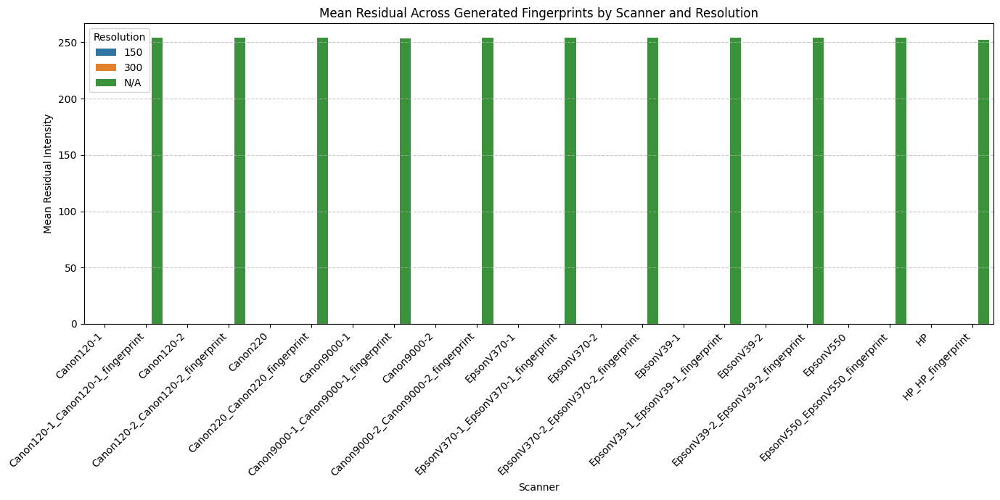


--- Statistical Summary for 150 and 300 DPI Resolution Fingerprints ---


,count,mean,std,min,25%,50%,75%,max
Resolution,,,,,,,,
150,11.0,0.192275,0.041652,0.071879,0.192201,0.199057,0.213123,0.220146
300,11.0,0.092440,0.047884,0.071792,0.071994,0.074348,0.086373,0.235109



--- 150 and 300 DPI Resolution Fingerprints Details ---


,Fingerprint,Scanner,Resolution,Mean Residual
14,Canon120-1_150_fingerprint,Canon120-1,150,0.198697
21,Canon120-1_300_fingerprint,Canon120-1,300,0.071867
4,Canon120-2_150_fingerprint,Canon120-2,150,0.210454
15,Canon120-2_300_fingerprint,Canon120-2,300,0.071792
0,Canon220_150_fingerprint,Canon220,150,0.199057
20,Canon220_300_fingerprint,Canon220,300,0.081640
8,Canon9000-1_150_fingerprint,Canon9000-1,150,0.196289
16,Canon9000-1_300_fingerprint,Canon9000-1,300,0.071995
17,Canon9000-2_150_fingerprint,Canon9000-2,150,0.071879
3,Canon9000-2_300_fingerprint,Canon9000-2,300,0.235109


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import re
import seaborn as sns # Added this line

fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")

# --- Load fingerprints and compute mean residuals ---
mean_residuals_data = []

for fp_file in fingerprint_root.glob("*.npy"):
    fingerprint = np.load(fp_file)
    mean_residual = np.mean(fingerprint)

    # Extract scanner and resolution from filename
    file_name = fp_file.stem  # e.g., 'Canon120-1_150_fingerprint'
    match = re.match(r"([A-Za-z0-9\-]+)_(\d+)_fingerprint", file_name)
    if match:
        scanner_name = match.group(1)
        resolution = int(match.group(2))
    else:
        # Handle cases where naming convention might be different (e.g., old ones)
        match_simple = re.match(r"([A-Za-z0-9\-]+)_fingerprint", file_name)
        if match_simple:
            scanner_name = match_simple.group(1)
            resolution = "N/A"
        else:
            scanner_name = file_name
            resolution = "N/A"

    mean_residuals_data.append({
        "Fingerprint": fp_file.stem,
        "Scanner": scanner_name,
        "Resolution": resolution,
        "Mean Residual": mean_residual
    })

df_mean_residuals = pd.DataFrame(mean_residuals_data)

# Sort for better visualization
df_mean_residuals = df_mean_residuals.sort_values(by=["Scanner", "Resolution"])

print("--- Mean Residuals Across Fingerprints ---")
display(df_mean_residuals)

# --- Visualize Mean Residuals ---
plt.figure(figsize=(14, 7))
# Use hue for resolution if available, otherwise just use scanner
if "Resolution" in df_mean_residuals.columns and df_mean_residuals["Resolution"].nunique() > 1:
    sns.barplot(x="Scanner", y="Mean Residual", hue="Resolution", data=df_mean_residuals)
    plt.title("Mean Residual Across Generated Fingerprints by Scanner and Resolution")
else:
    sns.barplot(x="Scanner", y="Mean Residual", data=df_mean_residuals)
    plt.title("Mean Residual Across Generated Fingerprints by Scanner")

plt.xlabel("Scanner")
plt.ylabel("Mean Residual Intensity")
plt.xticks(rotation=45, ha="right")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Filter for 150 and 300 DPI resolution fingerprints
df_filtered_resolutions = df_mean_residuals[df_mean_residuals['Resolution'].isin([150, 300])]

print("\n--- Statistical Summary for 150 and 300 DPI Resolution Fingerprints ---")
display(df_filtered_resolutions.groupby('Resolution')['Mean Residual'].describe())

print("\n--- 150 and 300 DPI Resolution Fingerprints Details ---")
display(df_filtered_resolutions)

In [ ]:
print("--- Filtered Resolutions (150 and 300 DPI) Details ---")
display(df_filtered_resolutions)

--- Filtered Resolutions (150 and 300 DPI) Details ---


,Fingerprint,Scanner,Resolution,Mean Residual
14,Canon120-1_150_fingerprint,Canon120-1,150,0.198697
21,Canon120-1_300_fingerprint,Canon120-1,300,0.071867
4,Canon120-2_150_fingerprint,Canon120-2,150,0.210454
15,Canon120-2_300_fingerprint,Canon120-2,300,0.071792
0,Canon220_150_fingerprint,Canon220,150,0.199057
20,Canon220_300_fingerprint,Canon220,300,0.081640
8,Canon9000-1_150_fingerprint,Canon9000-1,150,0.196289
16,Canon9000-1_300_fingerprint,Canon9000-1,300,0.071995
17,Canon9000-2_150_fingerprint,Canon9000-2,150,0.071879
3,Canon9000-2_300_fingerprint,Canon9000-2,300,0.235109


In [ ]:
from collections import defaultdict
import re

# 1. Initialize empty dictionaries
results_official = defaultdict(list)
results_wikipedia = defaultdict(list)

# Get the class labels from the trained SVM classifier
svm_classes = clf.classes_

# Create a mapping from index to label for y_test and y_pred
# Note: y_test and y_pred contain the actual string labels, so direct comparison is possible

# 2. Iterate through y_test and y_pred
for true_label, predicted_label in zip(y_test, y_pred):
    # 3a. Extract dataset and scanner name from true_label
    match = re.match(r"(Official|Wikipedia)_([A-Za-z0-9\-]+)", true_label)
    if match:
        dataset_name = match.group(1)
        scanner_name = match.group(2)

        # 3b. Determine if the prediction was correct
        is_correct = 1 if true_label == predicted_label else 0

        # 3c. Add binary outcome to the appropriate dictionary
        if dataset_name == "Official":
            results_official[scanner_name].append(is_correct)
        elif dataset_name == "Wikipedia":
            results_wikipedia[scanner_name].append(is_correct)

print("Populated results_official:")
for scanner, results in results_official.items():
    print(f"  {scanner}: {results}")

print("\nPopulated results_wikipedia:")
for scanner, results in results_wikipedia.items():
    print(f"  {scanner}: {results}")


Populated results_official:
  EpsonV370-1: [1, 1, 1, 1, 1]
  Canon9000-2: [1, 1, 1, 1, 1]
  EpsonV550: [1, 1, 1]
  EpsonV370-2: [1, 1, 1, 1]
  Canon220: [1, 1, 1, 1, 1]
  Canon120-1: [0, 0, 1, 1, 1]
  EpsonV39-1: [1, 1]
  EpsonV39-2: [1, 1, 0, 1, 1]
  HP: [1, 1, 1, 1, 1]
  Canon120-2: [1, 1, 1, 1]
  Canon9000-1: [0, 0]

Populated results_wikipedia:
  Canon9000-2: [1, 1, 1]
  EpsonV39-1: [1, 1, 1]
  HP: [1, 0, 1]
  Canon120-1: [1, 1, 1]
  EpsonV370-1: [1, 0, 0]
  EpsonV550: [1, 1, 1]
  Canon220: [1, 1, 1]
  Canon9000-1: [0, 0, 0]
  EpsonV370-2: [0, 0, 1]
  Canon120-2: [0, 0, 0]
  EpsonV39-2: [1, 1, 1]


In [ ]:
import pandas as pd
import numpy as np

# Function to calculate accuracy from results dictionaries
def calculate_accuracy(results_dict, dataset_name):
    accuracy_data = []
    for scanner, outcomes in results_dict.items():
        if outcomes:
            accuracy = np.mean(outcomes) * 100
            accuracy_data.append({"Scanner": scanner, f"{dataset_name} Accuracy": accuracy})
        else:
            accuracy_data.append({"Scanner": scanner, f"{dataset_name} Accuracy": np.nan}) # Handle cases with no data
    return pd.DataFrame(accuracy_data)

# Calculate accuracies for Official dataset
df_official_acc = calculate_accuracy(results_official, "Official")

# Calculate accuracies for Wikipedia dataset
df_wikipedia_acc = calculate_accuracy(results_wikipedia, "Wikipedia")

# Merge the dataframes into a combined table
# Use 'outer' merge to include all scanners from both datasets
combined_accuracy_df = pd.merge(df_official_acc, df_wikipedia_acc, on="Scanner", how="outer")

# Sort by scanner name for better readability
combined_accuracy_df = combined_accuracy_df.sort_values(by="Scanner").reset_index(drop=True)

print("\n--- Combined Scanner Identification Accuracy (SVM) ---")
display(combined_accuracy_df)



--- Combined Scanner Identification Accuracy (SVM) ---


,Scanner,Official Accuracy,Wikipedia Accuracy
0,Canon120-1,60.0,100.000000
1,Canon120-2,100.0,0.000000
2,Canon220,100.0,100.000000
3,Canon9000-1,0.0,0.000000
4,Canon9000-2,100.0,100.000000
5,EpsonV370-1,100.0,33.333333
6,EpsonV370-2,100.0,33.333333
7,EpsonV39-1,100.0,100.000000
8,EpsonV39-2,80.0,100.000000
9,EpsonV550,100.0,100.000000


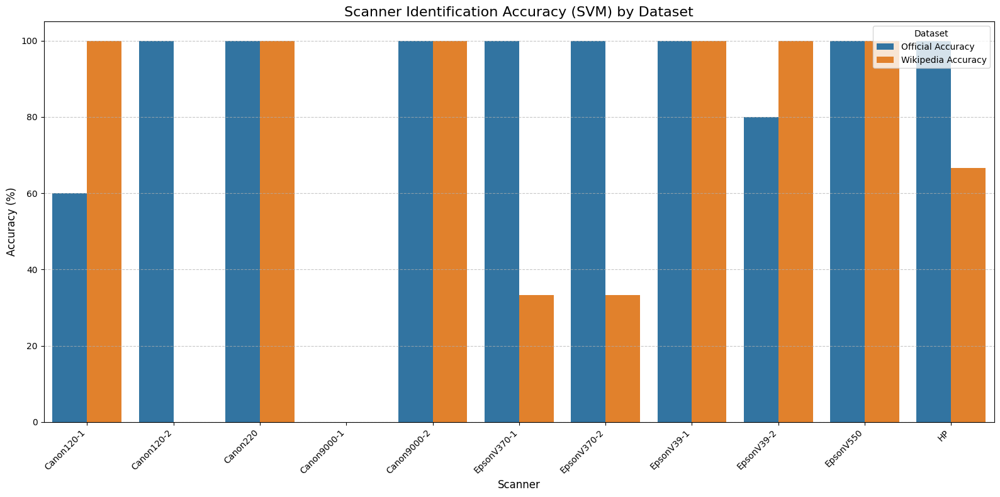

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the DataFrame to long format for easier plotting with seaborn
df_melted = combined_accuracy_df.melt(
    id_vars=['Scanner'],
    var_name='Dataset',
    value_name='Accuracy'
)

plt.figure(figsize=(16, 8))
sns.barplot(x='Scanner', y='Accuracy', hue='Dataset', data=df_melted)
plt.title('Scanner Identification Accuracy (SVM) by Dataset', fontsize=16)
plt.xlabel('Scanner', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 105) # Set y-axis limit slightly above 100 for better visualization
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Function to calculate accuracy from results dictionaries
def calculate_accuracy(results_dict, dataset_name):
    accuracy_data = []
    for scanner, outcomes in results_dict.items():
        if outcomes:
            accuracy = np.mean(outcomes) * 100
            accuracy_data.append({"Scanner": scanner, f"{dataset_name} Accuracy": accuracy})
        else:
            accuracy_data.append({"Scanner": scanner, f"{dataset_name} Accuracy": np.nan}) # Handle cases with no data
    return pd.DataFrame(accuracy_data)

# Calculate accuracies for Official dataset
df_official_acc = calculate_accuracy(results_official, "Official")

# Calculate accuracies for Wikipedia dataset
df_wikipedia_acc = calculate_accuracy(results_wikipedia, "Wikipedia")

# Merge the dataframes into a combined table
# Use 'outer' merge to include all scanners from both datasets
combined_accuracy_df = pd.merge(df_official_acc, df_wikipedia_acc, on="Scanner", how="outer")

# Sort by scanner name for better readability
combined_accuracy_df = combined_accuracy_df.sort_values(by="Scanner").reset_index(drop=True)

print("\n--- Combined Scanner Identification Accuracy (SVM) ---")
display(combined_accuracy_df)


--- Combined Scanner Identification Accuracy (SVM) ---


,Scanner,Official Accuracy,Wikipedia Accuracy
0,Canon120-1,60.0,100.000000
1,Canon120-2,100.0,0.000000
2,Canon220,100.0,100.000000
3,Canon9000-1,0.0,0.000000
4,Canon9000-2,100.0,100.000000
5,EpsonV370-1,100.0,33.333333
6,EpsonV370-2,100.0,33.333333
7,EpsonV39-1,100.0,100.000000
8,EpsonV39-2,80.0,100.000000
9,EpsonV550,100.0,100.000000


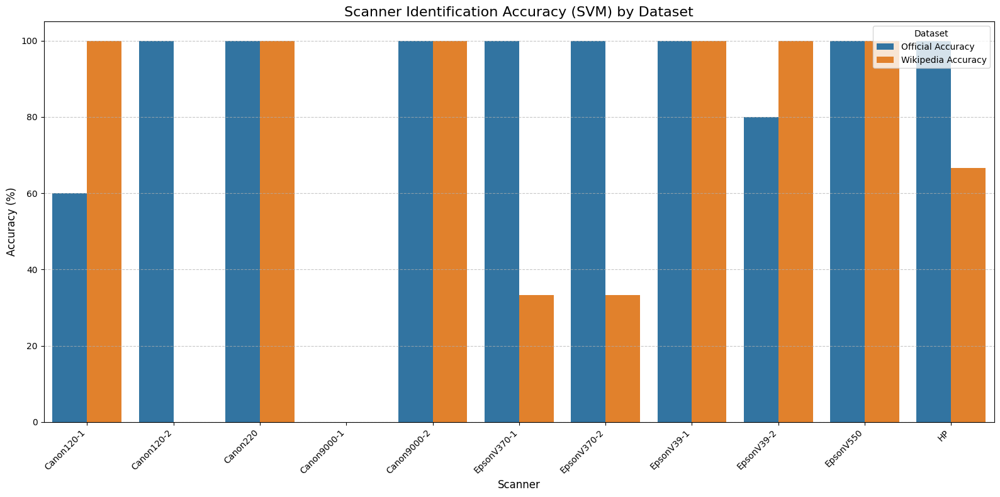

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt the DataFrame to long format for easier plotting with seaborn
df_melted = combined_accuracy_df.melt(
    id_vars=['Scanner'],
    var_name='Dataset',
    value_name='Accuracy'
)

plt.figure(figsize=(16, 8))
sns.barplot(x='Scanner', y='Accuracy', hue='Dataset', data=df_melted)
plt.title('Scanner Identification Accuracy (SVM) by Dataset', fontsize=16)
plt.xlabel('Scanner', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 105) # Set y-axis limit slightly above 100 for better visualization
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Dataset')
plt.tight_layout()
plt.show()

Starting fingerprint generation for Flatfield dataset...
Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon120-1_150_fingerprint.npy


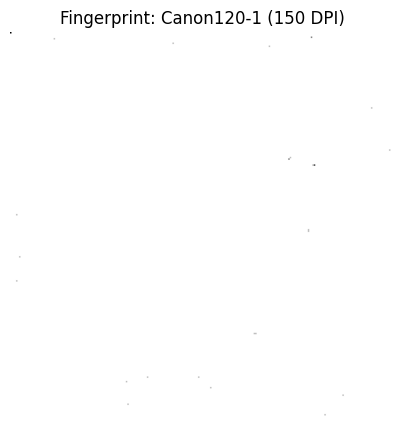

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon120-1_300_fingerprint.npy


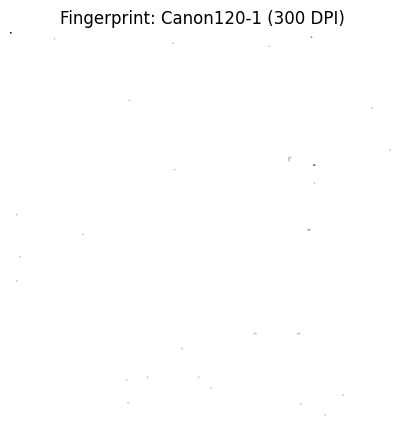

Could not read image: /content/drive/MyDrive/dataset/Flatfield/EpsonV39-1/._150.tif
Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV39-1_150_fingerprint.npy


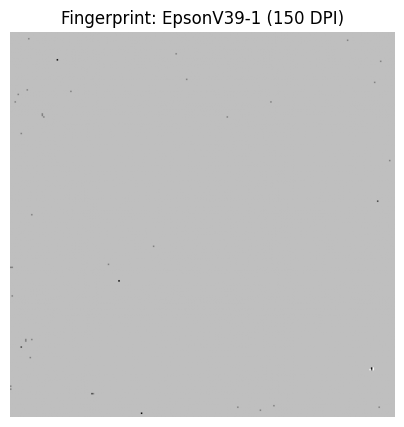

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV39-1_300_fingerprint.npy


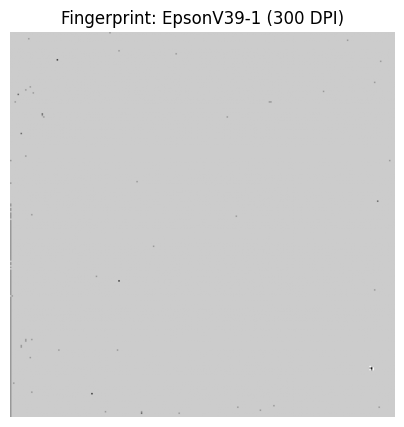

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon120-2_150_fingerprint.npy


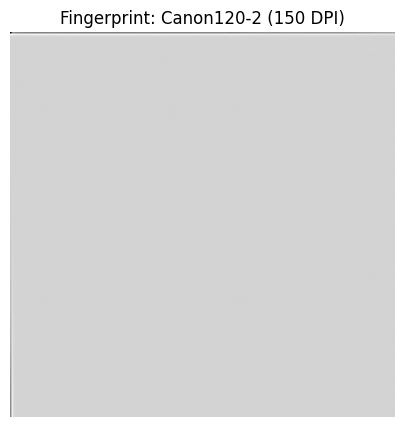

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon120-2_300_fingerprint.npy


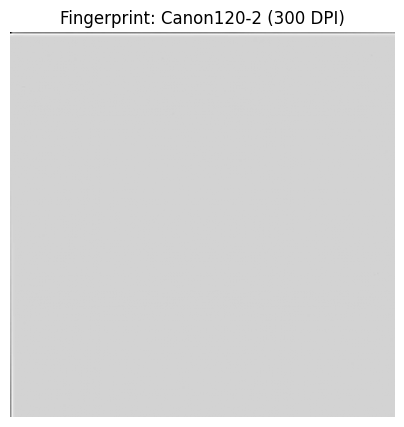

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon220_150_fingerprint.npy


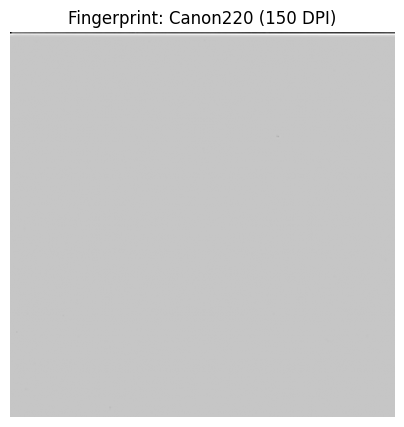

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon220_300_fingerprint.npy


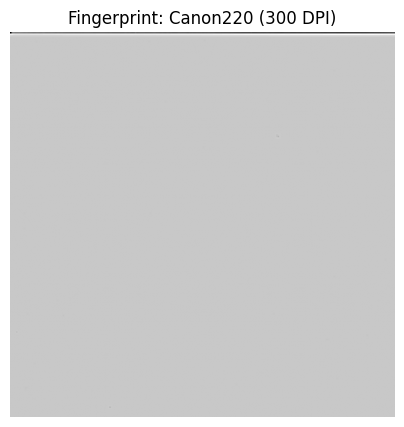

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/HP_150_fingerprint.npy


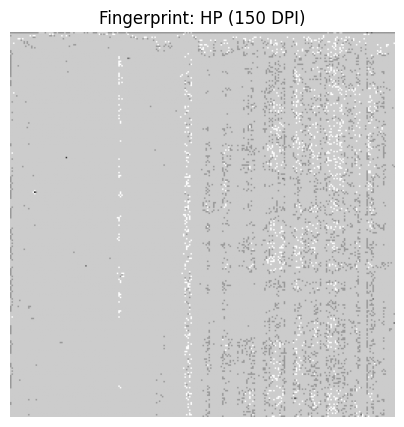

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/HP_300_fingerprint.npy


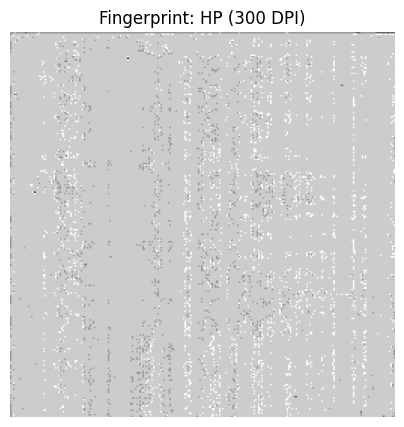

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV370-2_150_fingerprint.npy


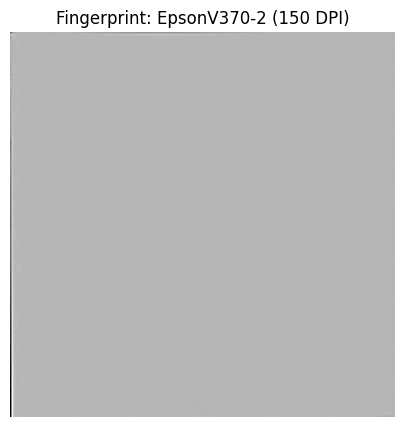

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV370-2_300_fingerprint.npy


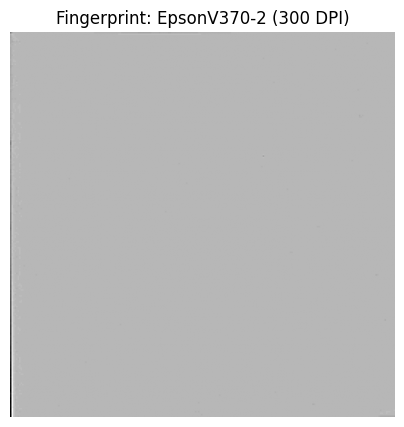

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV39-2_150_fingerprint.npy


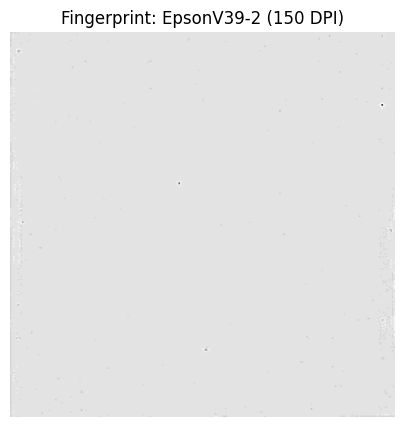

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV39-2_300_fingerprint.npy


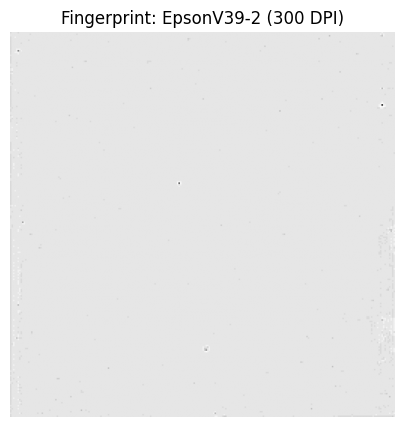

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon9000-1_150_fingerprint.npy


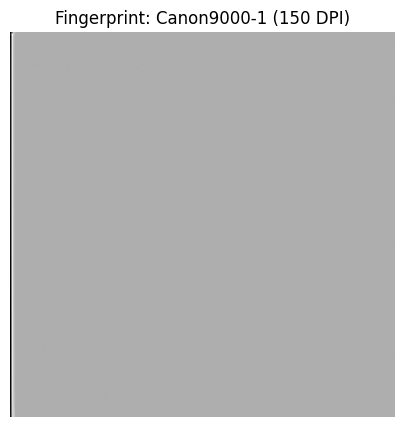

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon9000-1_300_fingerprint.npy


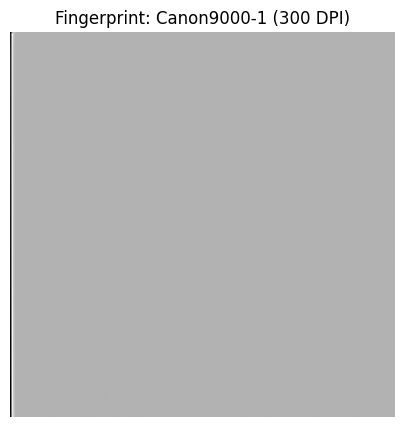

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV550_150_fingerprint.npy


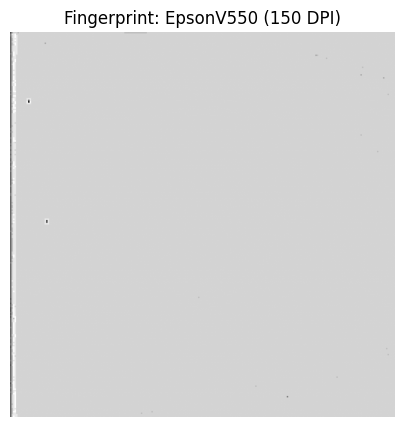

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV550_300_fingerprint.npy


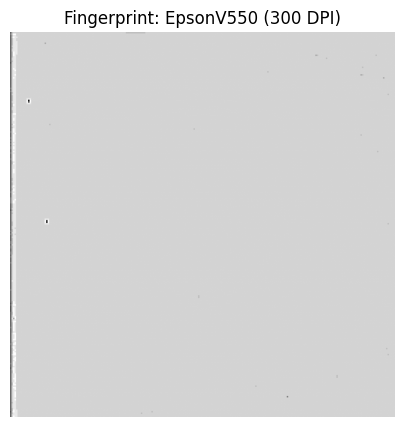

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV370-1_150_fingerprint.npy


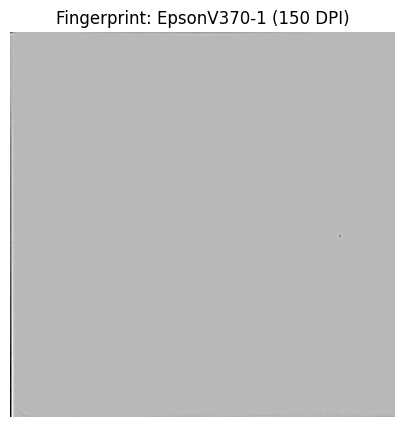

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/EpsonV370-1_300_fingerprint.npy


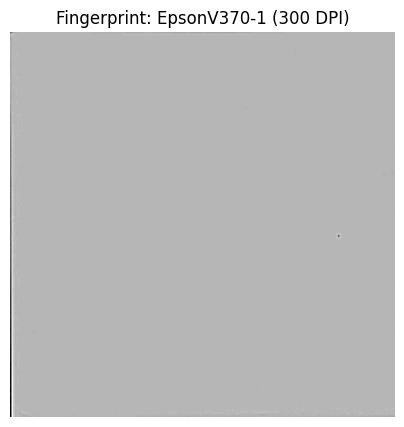

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon9000-2_150_fingerprint.npy


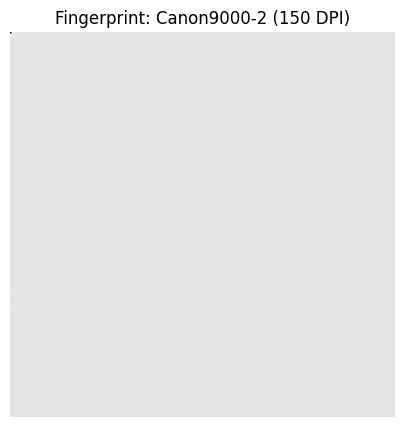

Saved fingerprint: /content/drive/MyDrive/dataset/Fingerprints/Canon9000-2_300_fingerprint.npy


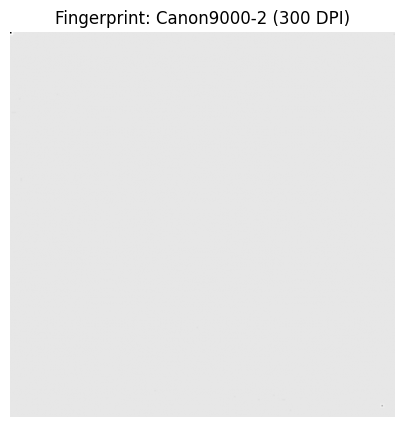


--- Fingerprint Summary ---
        Scanner  DPI  Mean Residual  Std Residual  \
0    Canon120-1  150      -0.000488      0.028701   
1    Canon120-1  300      -0.000641      0.031243   
2    EpsonV39-1  150      -0.000778      0.036843   
3    EpsonV39-1  300      -0.003082      0.061933   
4    Canon120-2  150      -0.102371      3.097807   
5    Canon120-2  300      -0.102890      3.107851   
6      Canon220  150      -0.123260      4.297199   
7      Canon220  300      -0.111801      3.902244   
8            HP  150      -0.032547      0.267673   
9            HP  300       0.007507      0.258826   
10  EpsonV370-2  150      -0.040482      1.381397   
11  EpsonV370-2  300      -0.026794      0.981044   
12   EpsonV39-2  150      -0.007675      0.150029   
13   EpsonV39-2  300      -0.009155      0.170471   
14  Canon9000-1  150      -0.231476      7.931241   
15  Canon9000-1  300      -0.222168      7.653550   
16    EpsonV550  150      -0.011810      0.339975   
17    EpsonV550  

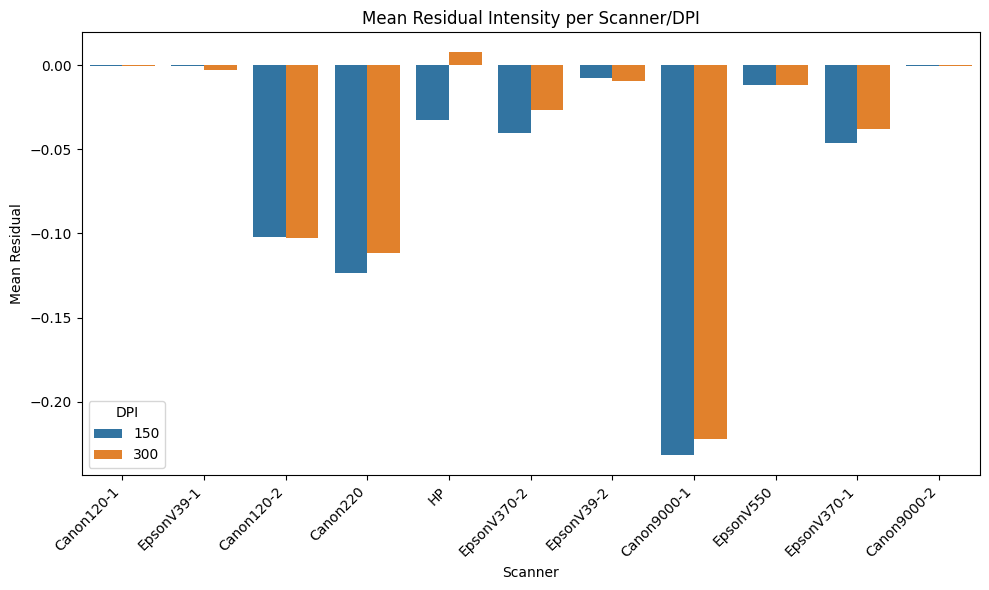


Total fingerprints generated: 33


In [ ]:
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd
import re # Import re for regex

# --- Paths ---
flatfield_root = Path("/content/drive/MyDrive/dataset/Flatfield")
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
fingerprint_root.mkdir(parents=True, exist_ok=True)

# Define the fixed size that fingerprints should be, matching preprocessing size
FIXED_SIZE = (256, 256)

# --- Residual Extraction ---
def extract_residual(img):
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img.astype(np.float32) - denoised.astype(np.float32)
    return residual

# --- Generate fingerprints ---
summary_data = []
print("Starting fingerprint generation for Flatfield dataset...")
for scanner_dir in flatfield_root.iterdir():
    if not scanner_dir.is_dir():
        continue
    scanner_name = scanner_dir.name

    # Iterate directly over image files under the scanner directory, checking all common extensions
    image_files = []
    for ext in ["*.png", "*.bmp", "*.jpg", "*.tif", "*.tiff"]:
        image_files.extend(list(scanner_dir.glob(ext)))

    if not image_files:
        print(f"No image files found in {scanner_dir} for any common extension.")
        continue

    # Group files by inferred DPI to compute average fingerprints per resolution
    grouped_by_dpi = {'150': [], '300': []}
    for img_file in image_files:
        # Infer DPI from filename
        if "150" in img_file.name:
            grouped_by_dpi['150'].append(img_file)
        elif "300" in img_file.name:
            grouped_by_dpi['300'].append(img_file)

    for dpi_name, files_for_dpi in grouped_by_dpi.items():
        if not files_for_dpi:
            continue

        residuals = []
        for img_file in files_for_dpi:
            img = cv2.imread(str(img_file), cv2.IMREAD_GRAYSCALE)
            if img is None:
                print(f"Could not read image: {img_file}")
                continue # Skip if image cannot be read

            # Resize the image to FIXED_SIZE before extracting residual
            img_resized = cv2.resize(img, FIXED_SIZE, interpolation=cv2.INTER_AREA)
            residuals.append(extract_residual(img_resized))

        if residuals:
            fingerprint = np.mean(residuals, axis=0)
            fp_name = f"{scanner_name}_{dpi_name}_fingerprint.npy"
            np.save(fingerprint_root / fp_name, fingerprint)
            print(f"Saved fingerprint: {fingerprint_root / fp_name}")

            mean_val = np.mean(fingerprint)
            std_val = np.std(fingerprint)
            summary_data.append({
                "Scanner": scanner_name,
                "DPI": dpi_name,
                "Mean Residual": mean_val,
                "Std Residual": std_val,
                "Fingerprint File": fp_name
            })

            # Visualization for each fingerprint
            fp_vis = (fingerprint - fingerprint.min()) / (fingerprint.max() - fingerprint.min()) * 255
            fp_vis = fp_vis.astype(np.uint8)
            plt.figure(figsize=(5,5))
            plt.imshow(fp_vis, cmap="gray")
            plt.title(f"Fingerprint: {scanner_name} ({dpi_name} DPI)")
            plt.axis("off")
            plt.show()
            plt.close() # Close figure to prevent excessive memory usage

# --- Summary Table ---
df_summary = pd.DataFrame(summary_data)
print("\n--- Fingerprint Summary ---")
print(df_summary)

# --- Barplot of mean residuals ---
import seaborn as sns
plt.figure(figsize=(10,6))
sns.barplot(x="Scanner", y="Mean Residual", hue="DPI", data=df_summary)
plt.title("Mean Residual Intensity per Scanner/DPI")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

print(f"\nTotal fingerprints generated: {len(list(fingerprint_root.glob('*.npy')))}")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import time

# --- Paths ---
official_dataset_root = Path("/content/drive/MyDrive/dataset/Official")
wikipedia_dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")
residual_root = Path("/content/drive/MyDrive/dataset/Residuals")

# Ensure the residual_root directory exists
print(f"Ensuring residual directory exists: {residual_root}")
residual_root.mkdir(parents=True, exist_ok=True)
print(f"Residual directory status: {residual_root.exists()}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Ensuring residual directory exists: /content/drive/MyDrive/dataset/Residuals
Residual directory status: True


### Residual Extraction Function
This function applies a Gaussian blur to the image to estimate the content (text, lines, etc.) and then subtracts this content from the original image. The remaining signal is the residual noise, which contains the scanner's unique fingerprint. The process ensures that even images with significant text can have their noise patterns extracted.

In [ ]:
# --- Residual Extraction Function ---
def extract_residual(image_path):
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        # print(f"ERROR: Could not read image: {image_path}") # Uncomment for verbose error
        return None

    # Normalize to [0,1] for better numerical stability with float32 operations
    img = img.astype(np.float32) / 255.0

    # Apply Gaussian blur to suppress visible content, estimating the 'flat-field'
    # The kernel size (e.g., 5x5) can be adjusted. Larger kernels remove more detail.
    denoised = cv2.GaussianBlur(img, (5,5), 0)

    # Residual = original - denoised
    residual = img - denoised

    # Normalize residual to [-1,1] to ensure consistent scale across images
    residual = residual / (np.max(np.abs(residual)) + 1e-8) # Add small epsilon to avoid division by zero

    return residual

def process_nested_dataset(dataset_path, dataset_name, max_samples_to_show_per_dpi=1):
    print(f"\nStarting processing for dataset: {dataset_name} at {dataset_path}")
    generated_count = 0
    loaded_count = 0

    if not dataset_path.exists():
        print(f"ERROR: Dataset root directory not found: {dataset_path}. Please check the path.")
        return

    scanner_dirs = [d for d in dataset_path.iterdir() if d.is_dir()]
    if not scanner_dirs:
        print(f"WARNING: No scanner directories found in {dataset_path}.")
        return

    for scanner_dir in scanner_dirs:
        scanner_name = scanner_dir.name

        dpi_dirs = [d for d in scanner_dir.iterdir() if d.is_dir()]
        if not dpi_dirs:
            print(f"    WARNING: No DPI directories found in {scanner_dir}.")
            continue

        for dpi_dir in dpi_dirs:
            dpi_name = dpi_dir.name

            img_files = list(dpi_dir.glob("*.tif"))
            if not img_files:
                print(f"      WARNING: No .tif files found in {dpi_dir}. Skipping.")
                continue

            shown_count_for_dpi = 0
            for img_file in img_files:
                # Construct a unique and informative save_name
                save_name = f"{dataset_name}_{scanner_name}_{dpi_name}_{img_file.stem}_residual.npy"
                save_path = residual_root / save_name

                if save_path.exists():
                    residual = np.load(save_path)
                    loaded_count += 1
                else:
                    residual = extract_residual(img_file)
                    if residual is not None:
                        np.save(save_path, residual)
                        generated_count += 1
                        # print(f"        Saved: {save_path}") # Uncomment for verbose saving
                    else:
                        # print(f"        Failed to extract residual for {img_file}") # Uncomment for verbose error
                        continue

                # Optional: visualize a few samples
                if shown_count_for_dpi < max_samples_to_show_per_dpi:
                    if residual is not None:
                        # Convert residual to image-friendly format for display
                        res_vis = (residual - residual.min()) / (residual.max() - residual.min() + 1e-8) * 255
                        res_vis = res_vis.astype(np.uint8)

                        plt.figure(figsize=(5,5))
                        plt.imshow(res_vis, cmap="gray")
                        plt.title(f"Residual: {dataset_name}/{scanner_name}/{dpi_name}")
                        plt.axis("off")
                        plt.show()
                        plt.close()
                        shown_count_for_dpi += 1

    print(f"Finished processing {dataset_name}. Newly generated: {generated_count}, Loaded existing: {loaded_count}")

### Processing Official and Wikipedia Scans
Now, we'll apply the residual extraction process to both datasets. The results (residual noise patterns) will be saved as `.npy` files in the specified `Residuals` directory. A few sample visualizations will be shown for each dataset.


Starting processing for dataset: Official at /content/drive/MyDrive/dataset/Official


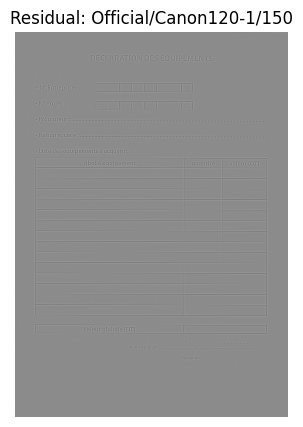

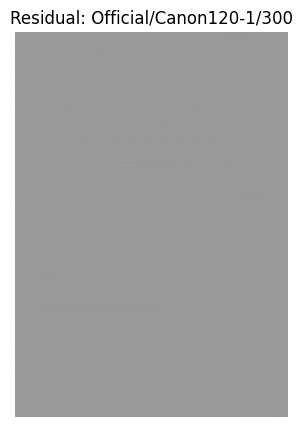

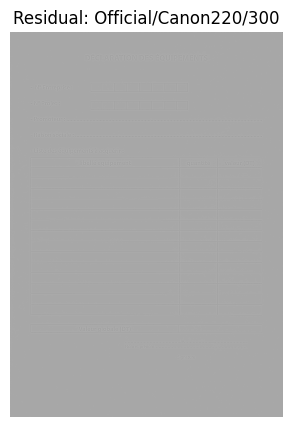

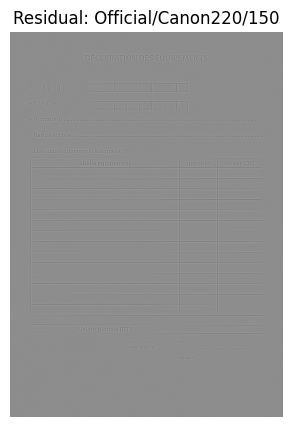

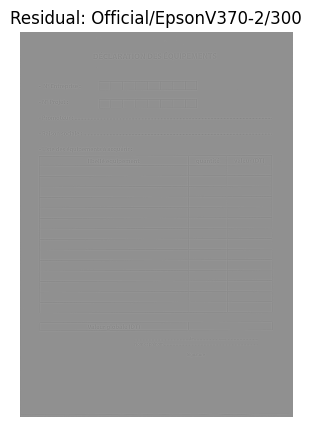

...

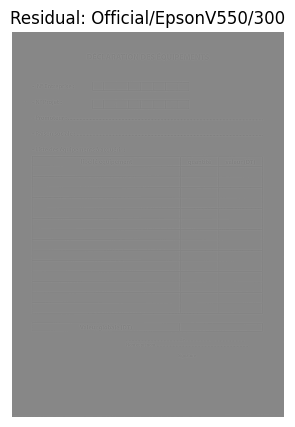

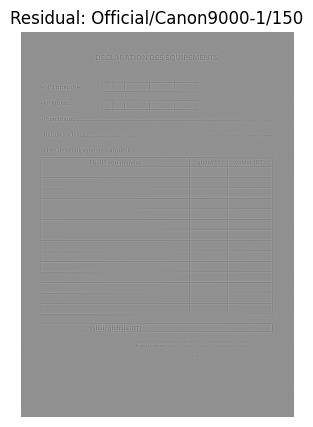

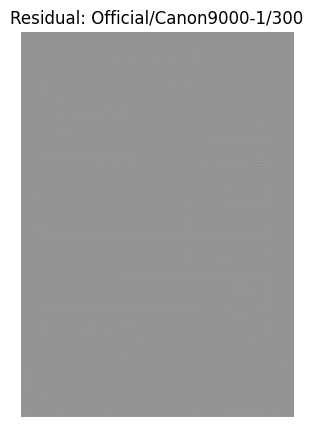

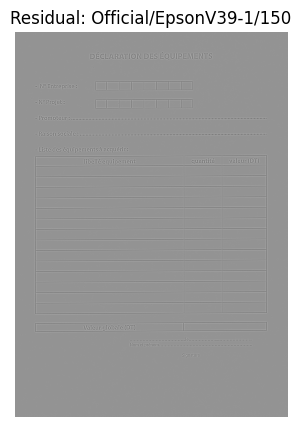

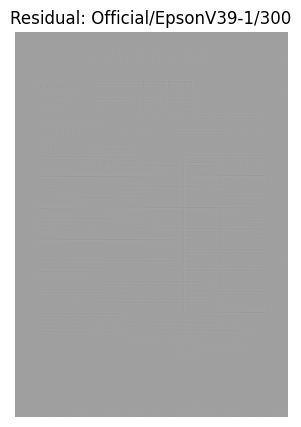

Finished processing Official. Newly generated: 0, Loaded existing: 2200

Starting processing for dataset: Wikipedia at /content/drive/MyDrive/dataset/Wikipedia


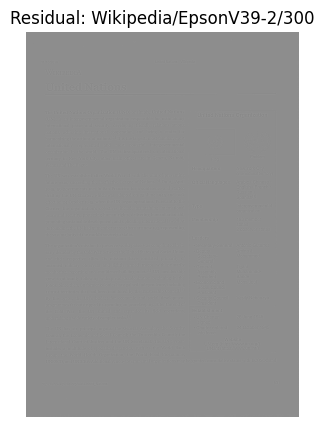

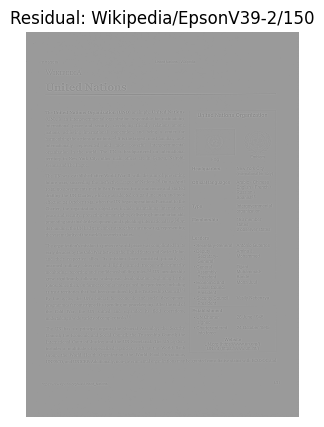

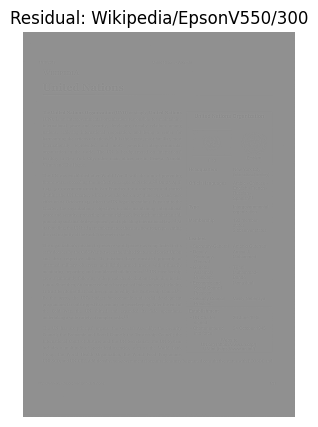

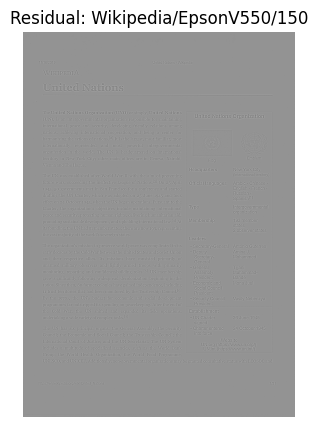

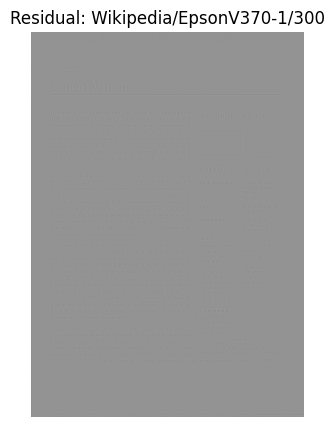

...

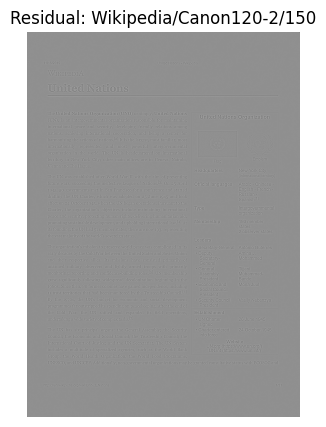

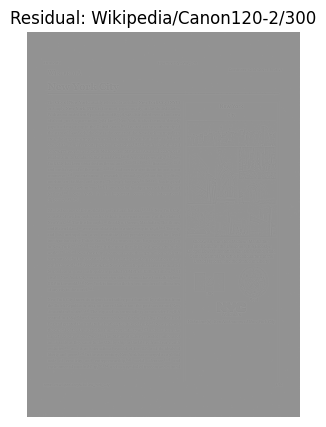

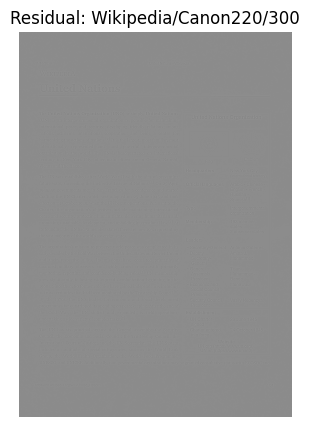

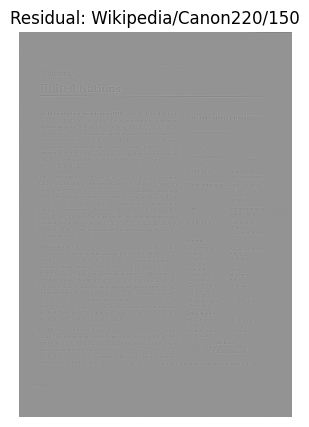

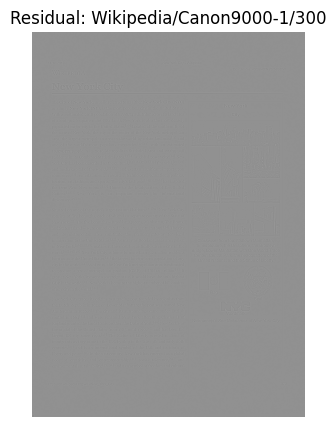

In [ ]:
# --- Run for Official and Wikipedia datasets ---
process_nested_dataset(official_dataset_root, "Official", max_samples_to_show_per_dpi=1)
process_nested_dataset(wikipedia_dataset_root, "Wikipedia", max_samples_to_show_per_dpi=1)

# Add a small delay to allow filesystem to sync (important for Google Drive)
time.sleep(2)

# Final check on total number of .npy files in the residual_root
final_count = len(list(residual_root.glob('*.npy')))
print(f"\nFINAL CHECK: Total residuals (.npy files) found in {residual_root}: {final_count}")

In [ ]:
import numpy as np
from pathlib import Path

# Assuming official_dataset_root and wikipedia_dataset_root are defined upstream
official_dataset_root = Path("/content/drive/MyDrive/dataset/Official")
wikipedia_dataset_root = Path("/content/drive/MyDrive/dataset/Wikipedia")
residual_root = Path("/content/drive/MyDrive/dataset/Residuals")

# --- Count total original Wikipedia files ---
# This dataset has nested structure: Wikipedia/Scanner/DPI/image.tif
total_wikipedia_images = 0
for scanner_dir in wikipedia_dataset_root.iterdir():
    if scanner_dir.is_dir():
        for dpi_dir in scanner_dir.iterdir():
            if dpi_dir.is_dir():
                total_wikipedia_images += len(list(dpi_dir.glob("*.tif")))

print(f"Total original Wikipedia images found: {total_wikipedia_images}")

# --- Count existing Wikipedia residual files ---
existing_wikipedia_residuals_count = 0
# Residual files are named like: Wikipedia_Scanner_DPI_stem_residual.npy
for res_file in residual_root.glob("Wikipedia_*.npy"):
    existing_wikipedia_residuals_count += 1

print(f"Total existing residual files for 'Wikipedia' dataset: {existing_wikipedia_residuals_count}")

# --- Calculate not stored files ---
not_stored_wikipedia_files = total_wikipedia_images - existing_wikipedia_residuals_count

print(f"Number of Wikipedia files not stored as residuals: {not_stored_wikipedia_files}")


Total original Wikipedia images found: 2368
Total existing residual files for 'Wikipedia' dataset: 2368
Number of Wikipedia files not stored as residuals: 0



--- Analyzing Wikipedia_Canon220_300_s3_74_residual ---
Dataset: Wikipedia, Scanner: Canon220, DPI: 300
Residual stats → mean: -0.0000, std: 0.0770


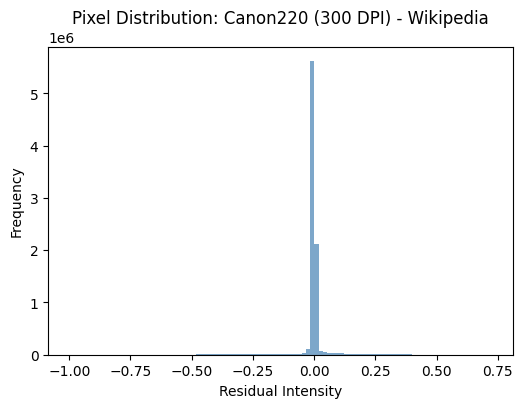

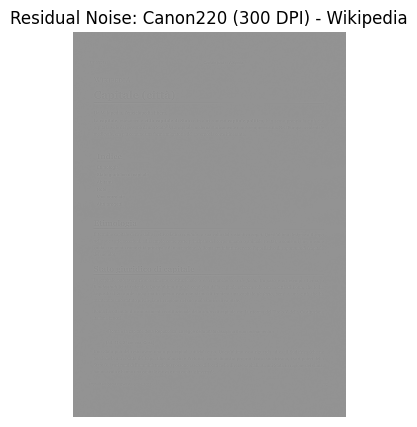

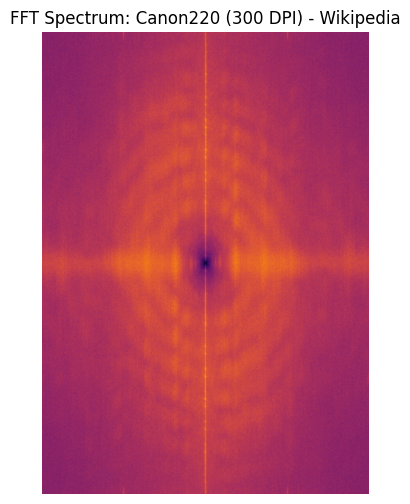

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# --- Paths ---
residual_root = Path("/content/drive/MyDrive/dataset/Residuals")

# --- Helper Functions ---
def normalize_residual(residual):
    return (residual - residual.min()) / (residual.max() - residual.min()) * 255

def plot_histogram(residual, scanner, dpi, dataset):
    plt.figure(figsize=(6,4))
    plt.hist(residual.flatten(), bins=100, color="steelblue", alpha=0.7)
    plt.title(f"Pixel Distribution: {scanner} ({dpi} DPI) - {dataset}")
    plt.xlabel("Residual Intensity")
    plt.ylabel("Frequency")
    plt.show()

def show_residual(residual, scanner, dpi, dataset):
    res_vis = normalize_residual(residual).astype(np.uint8)
    plt.figure(figsize=(5,5))
    plt.imshow(res_vis, cmap="gray")
    plt.title(f"Residual Noise: {scanner} ({dpi} DPI) - {dataset}")
    plt.axis("off")
    plt.show()

def plot_fft(residual, scanner, dpi, dataset):
    f = np.fft.fft2(residual)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift)+1)

    plt.figure(figsize=(6,6))
    plt.imshow(magnitude_spectrum, cmap="inferno")
    plt.title(f"FFT Spectrum: {scanner} ({dpi} DPI) - {dataset}")
    plt.axis("off")
    plt.show()

# --- Run EDA on a few residuals ---
def run_eda(residual_root, max_samples=1): # Changed max_samples to 1
    residual_files = list(residual_root.glob("*.npy"))
    for fp in residual_files[:max_samples]:  # limit for speed
        residual = np.load(fp)
        file_name = fp.stem
        # Example filename: Official_Canon220_150_doc1_residual
        parts = file_name.split("_")
        dataset = parts[0] if len(parts) > 0 else "Unknown"
        scanner = parts[1] if len(parts) > 1 else "Unknown"
        dpi = parts[2] if len(parts) > 2 else "Unknown"

        print(f"\n--- Analyzing {file_name} ---")
        print(f"Dataset: {dataset}, Scanner: {scanner}, DPI: {dpi}")
        print(f"Residual stats \u2192 mean: {np.mean(residual):.4f}, std: {np.std(residual):.4f}")

        # Visualizations
        plot_histogram(residual, scanner, dpi, dataset)
        show_residual(residual, scanner, dpi, dataset)
        plot_fft(residual, scanner, dpi, dataset)

# --- Execute ---
run_eda(residual_root, max_samples=1)

Loaded fingerprints: ['HP_HP_fingerprint', 'EpsonV550_EpsonV550_fingerprint', 'Canon220_Canon220_fingerprint', 'EpsonV370-1_EpsonV370-1_fingerprint', 'Canon9000-2_Canon9000-2_fingerprint', 'Canon120-1_Canon120-1_fingerprint', 'Canon9000-1_Canon9000-1_fingerprint', 'EpsonV370-2_EpsonV370-2_fingerprint', 'EpsonV39-2_EpsonV39-2_fingerprint', 'EpsonV39-1_EpsonV39-1_fingerprint', 'Canon120-2_Canon120-2_fingerprint', 'Canon120-1_150_fingerprint', 'Canon120-1_300_fingerprint', 'EpsonV39-1_150_fingerprint', 'EpsonV39-1_300_fingerprint', 'Canon120-2_300_fingerprint', 'Canon120-2_150_fingerprint', 'Canon220_150_fingerprint', 'Canon220_300_fingerprint', 'HP_150_fingerprint', 'HP_300_fingerprint', 'EpsonV370-2_150_fingerprint', 'EpsonV370-2_300_fingerprint', 'EpsonV39-2_150_fingerprint', 'EpsonV39-2_300_fingerprint', 'Canon9000-1_150_fingerprint', 'Canon9000-1_300_fingerprint', 'EpsonV550_150_fingerprint', 'EpsonV550_300_fingerprint', 'EpsonV370-1_300_fingerprint', 'EpsonV370-1_150_fingerprint', '

/tmp/ipykernel_2093/2374455004.py:65: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


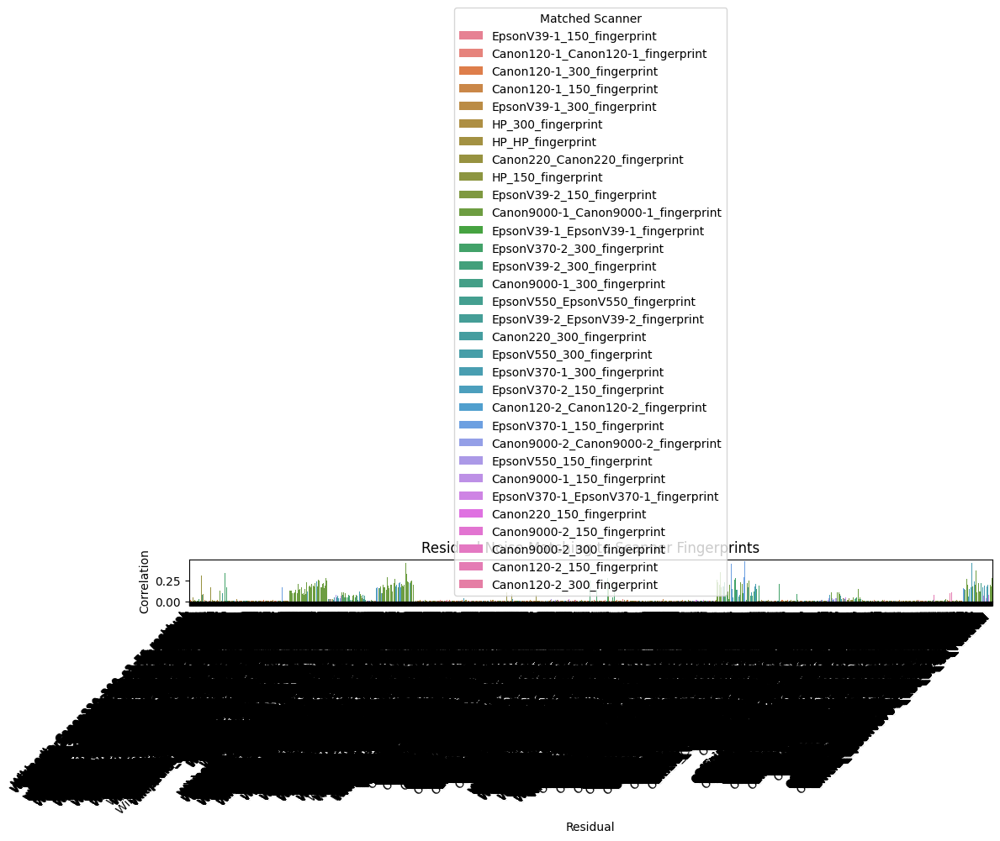

In [ ]:
import numpy as np
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

# --- Paths ---
fingerprint_root = Path("/content/drive/MyDrive/dataset/Fingerprints")
residual_root = Path("/content/drive/MyDrive/dataset/Residuals")

# --- Load fingerprints (resize to fixed shape) ---
fingerprints = {}
target_size = (128,128)  # common size for comparison

for fp_file in fingerprint_root.glob("*.npy"):
    fp = np.load(fp_file)
    fp_resized = cv2.resize(fp, target_size, interpolation=cv2.INTER_AREA)
    fingerprints[fp_file.stem] = fp_resized

print("Loaded fingerprints:", list(fingerprints.keys()))

# --- Correlation function ---
def corr_match(residual, fingerprint):
    r = residual.flatten()
    f = fingerprint.flatten()
    r = (r - np.mean(r)) / (np.std(r) + 1e-8)
    f = (f - np.mean(f)) / (np.std(f) + 1e-8)
    return np.mean(r * f)

# --- Compare residuals with fingerprints ---
results = []
for res_file in residual_root.glob("*.npy"):
    residual = np.load(res_file)
    residual_resized = cv2.resize(residual, target_size, interpolation=cv2.INTER_AREA)

    best_match = None
    best_score = -999
    for fp_name, fp in fingerprints.items():
        score = corr_match(residual_resized, fp)
        if score > best_score:
            best_score = score
            best_match = fp_name
    results.append({
        "Residual": res_file.stem,
        "Matched Scanner": best_match,
        "Correlation": best_score
    })
    print(f"{res_file.stem} → {best_match} (corr={best_score:.3f})")

# --- Results DataFrame ---
df_results = pd.DataFrame(results)

if df_results.empty:
    print("⚠️ No residuals or fingerprints found. Check your folders.")
else:
    print("\n--- Residual vs Fingerprint Matching ---")
    print(df_results.head())

    # --- Visualization ---
    plt.figure(figsize=(12,6))
    sns.barplot(x="Residual", y="Correlation", hue="Matched Scanner", data=df_results)
    plt.title("Residual Noise Matching to Scanner Fingerprints")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import cv2
from pathlib import Path
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# --- Parameters ---
residual_data_root = Path("/content/drive/MyDrive/dataset/Residuals")
img_size = 32
batch_size = 64 # Increased batch size since data loading is no longer a bottleneck

# --- 1. OPTIMIZED Dataset (Loads to RAM) ---
class InMemoryResidualDataset(Dataset):
    def __init__(self, residual_root, img_size=32):
        self.img_size = img_size
        self.residuals = []
        self.labels = []
        self.label_map = {}

        print(f"Loading ALL residuals into RAM from {residual_root}...")
        # Find all files first
        data_paths = list(residual_root.glob("*.npy"))
        if not data_paths:
            raise ValueError(f"No files found in {residual_root}")

        label_id = 0

        # LOAD EVERYTHING INTO MEMORY NOW
        for file_path in tqdm(data_paths, desc="Loading to RAM"):
            # 1. Parse Label
            fname_parts = file_path.stem.split('_')
            if len(fname_parts) >= 3:
                label_str = f"{fname_parts[0]}_{fname_parts[1]}_{fname_parts[2]}"
            else:
                label_str = "Unknown"

            if label_str not in self.label_map:
                self.label_map[label_str] = label_id
                label_id += 1

            # 2. Load Data immediately
            try:
                res = np.load(file_path)

                # Resize if needed
                if res.shape[0] != self.img_size or res.shape[1] != self.img_size:
                    res = cv2.resize(res, (self.img_size, self.img_size), interpolation=cv2.INTER_AREA)

                # Store in lists (in RAM)
                self.residuals.append(res)
                self.labels.append(self.label_map[label_str])

            except Exception as e:
                print(f"Skipping corrupted file {file_path}: {e}")
                continue

        # Convert lists to single big numpy arrays for speed
        # Add channel dimension (N, 1, H, W)
        self.residuals = np.array(self.residuals)[:, np.newaxis, :, :]
        self.labels = np.array(self.labels)

        print(f"Data Loaded! Shape: {self.residuals.shape}")
        print(f"Total Classes: {len(self.label_map)}")

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        # Retrieve from RAM (Super Fast)
        # No file I/O here!
        x = torch.tensor(self.residuals[idx], dtype=torch.float32)
        y = torch.tensor(self.labels[idx], dtype=torch.long)
        return x, y

# --- 2. The CNN Model (Same as before) ---
class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)

        # For img_size=32: 32 -> 16 -> 8 -> 4. Output: 128*4*4 = 2048
        self.fc1 = nn.Linear(128 * (img_size // 8) * (img_size // 8), 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128 * (img_size // 8) * (img_size // 8))
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

# --- 3. Main Execution Block ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Initialize Dataset (This step will take time, but it happens ONCE)
full_dataset = InMemoryResidualDataset(residual_data_root, img_size=img_size)

# Split Indices using sklearn (faster than torch random_split for indices)
train_idx, test_idx = train_test_split(
    range(len(full_dataset)),
    test_size=0.2,
    stratify=full_dataset.labels, # Ensure class balance
    random_state=42
)

# Create Subsets
train_set = torch.utils.data.Subset(full_dataset, train_idx)
test_set = torch.utils.data.Subset(full_dataset, test_idx)


train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, pin_memory=True)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False, pin_memory=True)

# Save Label Map
output_dir = Path("/content/drive/MyDrive/")
np.save(output_dir / "cnn_label_map.npy", full_dataset.label_map)

# --- Training ---
model = DeepScannerCNN(num_classes=len(full_dataset.label_map)).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# We can now safely do 20-30 epochs because they will be fast!
epochs = 20
print(f"\nStarting training ({epochs} epochs)...")

for epoch in range(epochs):
    model.train()
    running_loss = 0.0

    # Standard training loop
    for data, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
        data, labels = data.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(data)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1} - Loss: {running_loss/len(train_loader):.4f}")

print("Training Complete.")

# --- Evaluation & Saving ---
model.eval() # Set model to evaluation mode
all_predictions = []
all_labels = []

with torch.no_grad(): # Disable gradient calculation for evaluation
    for data, labels in test_loader:
        data, labels = data.to(device), labels.to(device)
        outputs = model(data)
        _, predicted = torch.max(outputs, 1) # Get the index of the max log-probability
        all_predictions.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

accuracy = (np.array(all_predictions) == np.array(all_labels)).mean()
print(f"\nFinal Test Accuracy: {accuracy:.4f}")

# Generate Classification Report
idx_to_label = {v: k for k, v in full_dataset.label_map.items()}
class_names = [idx_to_label[i] for i in sorted(idx_to_label.keys())]

print("\nClassification Report:")
print(classification_report(all_labels, all_predictions, target_names=class_names, zero_division=0))

# Plot Confusion Matrix
cm = confusion_matrix(all_labels, all_predictions)
plt.figure(figsize=(15, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Scanner Classification')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), output_dir / "deep_scanner_cnn.pth")
print("Model Saved.")

Using device: cpu
Loading ALL residuals into RAM from /content/drive/MyDrive/dataset/Residuals...


Loading to RAM:   0%|          | 0/4568 [00:00<?, ?it/s]

Data Loaded! Shape: (4568, 1, 32, 32)
Total Classes: 44

Starting training (20 epochs)...


Epoch 1/20:   0%|          | 0/58 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch 1 - Loss: 3.5012


Epoch 2/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 2 - Loss: 2.9842


Epoch 3/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 3 - Loss: 2.6302


Epoch 4/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 4 - Loss: 2.3553


Epoch 5/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 5 - Loss: 2.1755


Epoch 6/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 6 - Loss: 2.0741


Epoch 7/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 7 - Loss: 1.9778


Epoch 8/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 8 - Loss: 1.9553


Epoch 9/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 9 - Loss: 1.9065


Epoch 10/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 10 - Loss: 1.8783


Epoch 11/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 11 - Loss: 1.8213


Epoch 12/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 12 - Loss: 1.8779


Epoch 13/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 13 - Loss: 1.7843


Epoch 14/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 14 - Loss: 1.7233


Epoch 15/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 15 - Loss: 1.7785


Epoch 16/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 16 - Loss: 1.7138


Epoch 17/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 17 - Loss: 1.6806


Epoch 18/20:   0%|          | 0/58 [00:00<?, ?it/s]

Epoch 18 - Loss: 1.7553


Epoch 19/20:   0%|          | 0/58 [00:00<?, ?it/s]

**MILESTONE3**

In [ ]:
import torch
import numpy as np
import cv2
from pathlib import Path


class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)
        img_size = 32 # This must match the img_size used during training
        self.fc1 = nn.Linear(128 * (img_size // 8) * (img_size // 8), 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128 * (img_size // 8) * (img_size // 8))
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x


# --- Paths to saved model and label map ---
model_path = Path("/content/drive/MyDrive/deep_scanner_cnn.pth")
label_map_path = Path("/content/drive/MyDrive/cnn_label_map.npy")

# --- Load label map ---
label_map = np.load(label_map_path, allow_pickle=True).item()
idx_to_label = {v: k for k, v in label_map.items()}
num_classes = len(label_map)

# --- Load trained model ---
model = DeepScannerCNN(num_classes=num_classes)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval() # Set to evaluation mode

print(f"Model loaded from: {model_path}")
print(f"Label map loaded from: {label_map_path}")
print(f"Number of classes: {num_classes}")

# --- Residual Extraction Function (must match training preprocessing) ---
def extract_residual(image_path, img_size=32):
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"ERROR: Could not read image: {image_path}")
        return None

    img = img.astype(np.float32) / 255.0
    denoised = cv2.GaussianBlur(img, (5,5), 0)
    residual = img - denoised
    residual = residual / (np.max(np.abs(residual)) + 1e-8)

    # Resize residual to img_size
    if residual.shape[0] != img_size or residual.shape[1] != img_size:
        residual = cv2.resize(residual, (img_size, img_size), interpolation=cv2.INTER_AREA)

    return residual

# --- Prediction function ---
def predict_scanner(residual_file_path, img_size=32):
    # Load residual from .npy file
    residual_data = np.load(residual_file_path)

    # Ensure residual is resized to img_size (if not already)
    if residual_data.shape[0] != img_size or residual_data.shape[1] != img_size:
        residual_data = cv2.resize(residual_data, (img_size, img_size), interpolation=cv2.INTER_AREA)

    # Convert to PyTorch tensor with batch and channel dimensions (1, 1, H, W)
    input_tensor = torch.tensor(residual_data, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = torch.max(probabilities, 1)

    predicted_label = idx_to_label[predicted_idx.item()]

    return predicted_label, confidence.item()



example_residual_file = Path("/content/drive/MyDrive/dataset/Residuals/Official_Canon120-1_150_s1_2_residual.npy")

if example_residual_file.exists():
    predicted_scanner, confidence = predict_scanner(example_residual_file)
    print(f"\nPredicted Scanner for {example_residual_file.name}: {predicted_scanner} (Confidence: {confidence:.4f})")
else:
    print(f"Error: Example residual file not found at {example_residual_file}")
    print("Please provide a valid path to a .npy residual file for prediction.")

Model loaded from: /content/drive/MyDrive/deep_scanner_cnn.pth
Label map loaded from: /content/drive/MyDrive/cnn_label_map.npy
Number of classes: 44

Predicted Scanner for Official_Canon120-1_150_s1_2_residual.npy: Official_Canon120-1_150 (Confidence: 0.6835)


In [ ]:
import numpy as np
from pathlib import Path
import cv2
import torch
import torch.nn as nn

# Ensure DeepScannerCNN class is defined (copy from previous cell if running independently)
class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)
        img_size = 32 # This must match the img_size used during training
        self.fc1 = nn.Linear(128 * (img_size // 8) * (img_size // 8), 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128 * (img_size // 8) * (img_size // 8))
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

# --- Paths to saved model and label map ---
model_path = Path("/content/drive/MyDrive/deep_scanner_cnn.pth")
label_map_path = Path("/content/drive/MyDrive/cnn_label_map.npy")

# --- Load label map ---
label_map = np.load(label_map_path, allow_pickle=True).item()
idx_to_label = {v: k for k, v in label_map.items()}
num_classes = len(label_map)

# --- Load trained model ---
model = DeepScannerCNN(num_classes=num_classes)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval() # Set to evaluation mode

# --- Prediction function (re-defined here for completeness) ---
def predict_scanner(residual_file_path, img_size=32):
    # Load residual from .npy file
    residual_data = np.load(residual_file_path)

    # Ensure residual is resized to img_size (if not already)
    if residual_data.shape[0] != img_size or residual_data.shape[1] != img_size:
        residual_data = cv2.resize(residual_data, (img_size, img_size), interpolation=cv2.INTER_AREA)

    # Convert to PyTorch tensor with batch and channel dimensions (1, 1, H, W)
    input_tensor = torch.tensor(residual_data, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = torch.max(probabilities, 1)

    predicted_label = idx_to_label[predicted_idx.item()]

    return predicted_label, confidence.item()

# --- Example Usage with a NEW file ---
# This example picks a different residual file.
# You can change this path to any other .npy residual file in your dataset/Residuals folder.

residual_root = Path("/content/drive/MyDrive/dataset/Residuals")

# Find a different residual file to predict on
# Let's try to find one from Wikipedia, e.g., for Canon9000-1
new_example_residual_file = None
for f_path in residual_root.glob("Wikipedia_Canon9000-1_150_*.npy"):
    new_example_residual_file = f_path
    break # Take the first one we find

if new_example_residual_file and new_example_residual_file.exists():
    print(f"Attempting prediction for: {new_example_residual_file.name}")
    predicted_scanner, confidence = predict_scanner(new_example_residual_file)
    print(f"\nPredicted Scanner for {new_example_residual_file.name}: {predicted_scanner} (Confidence: {confidence:.4f})")
else:
    print(f"Error: No suitable example residual file found for prediction (e.g., Wikipedia_Canon9000-1_150). Please ensure such files exist or specify a valid path.")


Attempting prediction for: Wikipedia_Canon9000-1_150_s4_68_residual.npy

Predicted Scanner for Wikipedia_Canon9000-1_150_s4_68_residual.npy: Official_Canon120-1_150 (Confidence: 0.5240)


In [ ]:
import numpy as np
from pathlib import Path
import cv2
import torch
import torch.nn as nn

# --- DeepScannerCNN Model Definition (must match training definition) ---
class DeepScannerCNN(nn.Module):
    def __init__(self, num_classes):
        super(DeepScannerCNN, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.conv3 = nn.Conv2d(64, 128, 3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool = nn.MaxPool2d(2,2)
        self.dropout = nn.Dropout(0.5)
        img_size = 32 # This must match the img_size used during training
        self.fc1 = nn.Linear(128 * (img_size // 8) * (img_size // 8), 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool(torch.relu(self.bn1(self.conv1(x))))
        x = self.pool(torch.relu(self.bn2(self.conv2(x))))
        x = self.pool(torch.relu(self.bn3(self.conv3(x))))
        x = x.view(-1, 128 * (img_size // 8) * (img_size // 8))
        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.fc2(x)
        return x

# --- Paths to saved model and label map ---
model_path = Path("/content/drive/MyDrive/deep_scanner_cnn.pth")
label_map_path = Path("/content/drive/MyDrive/cnn_label_map.npy")

# --- Load label map ---
label_map = np.load(label_map_path, allow_pickle=True).item()
idx_to_label = {v: k for k, v in label_map.items()}
num_classes = len(label_map)

# --- Load trained model ---
model = DeepScannerCNN(num_classes=num_classes)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval() # Set to evaluation mode

print(f"Model loaded from: {model_path}")
print(f"Label map loaded from: {label_map_path}")
print(f"Number of classes: {num_classes}")

# --- Residual Extraction Function (must match training preprocessing) ---
def extract_residual_from_raw_image(image_path, img_size=32):
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        print(f"ERROR: Could not read image: {image_path}")
        return None

    img = img.astype(np.float32) / 255.0
    denoised = cv2.GaussianBlur(img, (5,5), 0) # Use same blur as training
    residual = img - denoised
    residual = residual / (np.max(np.abs(residual)) + 1e-8) # Normalize

    # Resize residual to img_size used during training
    if residual.shape[0] != img_size or residual.shape[1] != img_size:
        residual = cv2.resize(residual, (img_size, img_size), interpolation=cv2.INTER_AREA)

    return residual

# --- New Prediction function for raw image files ---
def predict_scanner_from_image(image_file_path, img_size=32):
    # 1. Extract residual from the raw image file
    residual_data = extract_residual_from_raw_image(image_file_path, img_size)
    if residual_data is None:
        return "Error: Could not process image", 0.0

    # 2. Convert to PyTorch tensor with batch and channel dimensions (1, 1, H, W)
    input_tensor = torch.tensor(residual_data, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    # 3. Make prediction using the loaded model
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = torch.max(probabilities, 1)

    predicted_label = idx_to_label[predicted_idx.item()]

    return predicted_label, confidence.item()


Model loaded from: /content/drive/MyDrive/deep_scanner_cnn.pth
Label map loaded from: /content/drive/MyDrive/cnn_label_map.npy
Number of classes: 44


In [ ]:
import random


# Find a sample raw image file
external_image_root = Path("/content/drive/MyDrive/dataset/Wikipedia") # Or any other dataset root
example_raw_image_file = None

# Recursively search for a .tif file in the Wikipedia dataset
tif_files = list(external_image_root.rglob("*.tif"))
if tif_files:
    example_raw_image_file = random.choice(tif_files)


if example_raw_image_file and example_raw_image_file.exists():
    print(f"Attempting prediction for raw image: {example_raw_image_file.name}")
    predicted_scanner, confidence = predict_scanner_from_image(example_raw_image_file)
    print(f"\nPredicted Scanner for {example_raw_image_file.name}: {predicted_scanner} (Confidence: {confidence:.4f})")
else:
    print(f"Error: No suitable example raw image file found at {external_image_root} or the specified path does not exist.")
    print("Please ensure you have an image file (e.g., .tif, .jpg, .png) and update 'example_raw_image_file' to its correct path.")

Attempting prediction for raw image: s9_21.tif

Predicted Scanner for s9_21.tif: Official_Canon120-1_150 (Confidence: 0.5734)
